In [1]:
import pandas as pd
import numpy as np
import re

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

import statsmodels.api as sm
from scipy.stats import shapiro
from scipy.stats import mannwhitneyu
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

import warnings
warnings.filterwarnings('ignore')

# настройки пандас
pd.options.display.float_format = '{:.2f}'.format

# Загрузка данных

In [2]:
data = pd.read_excel('D:/psy_data.xlsx', sheet_name='poll')

In [3]:
sample_data = pd.read_excel('D:/2024_gender_labor_final_data.xlsx', sheet_name='results')

## Характеристика

In [4]:
data.head()

,ID,Время создания,Ваш пол,Сколько вам лет?,Вы учитесь или работаете?,Ваше имя (по желанию),"1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Совершенно не важно, есть у меня это качество или нет","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Скорее не важно, чем важно","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Не очень важно","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Важно в средней степени",...,76. Вам обычно удается накопить нужную сумму денег? / Нет,77. Труд – наибольшая ценность для Вас? / Да,77. Труд – наибольшая ценность для Вас? / Нет,78. Вы уверенно и непринужденно чувствуете себя среди незнакомых людей? / Да,78. Вы уверенно и непринужденно чувствуете себя среди незнакомых людей? / Нет,"79. Вы согласны ущемить свободу, чтобы обладать властью? / Да","79. Вы согласны ущемить свободу, чтобы обладать властью? / Нет",80. Наиболее сильное потрясение для Вас – отсутствие денег? / Да,80. Наиболее сильное потрясение для Вас – отсутствие денег? / Нет,"Спасибо Вам за уделенное Вами время!\n\nДля обратной связи, получения результатов пройденного (по желанию) - укажите свой адрес электронной почты или контактный номер телефона:"
0,1621974239,2024-02-11 13:14:45,Женский,42,Только работаю,Ольга,NaN,NaN,NaN,NaN,...,NaN,NaN,Нет,NaN,Нет,NaN,Нет,Да,NaN,palem@mail.ru
1,1621978480,2024-02-11 13:20:54,Мужской,42,Только работаю,Алексей,NaN,NaN,NaN,NaN,...,NaN,NaN,Нет,NaN,Нет,NaN,Нет,NaN,Нет,NaN
2,1621984885,2024-02-11 13:30:15,Женский,43,Только работаю,Вера,NaN,NaN,NaN,NaN,...,NaN,NaN,Нет,NaN,Нет,NaN,Нет,NaN,Нет,\nvsp.2005@mail.ru
3,1621989786,2024-02-11 13:37:22,Мужской,39,Только работаю,Супер юрист,NaN,NaN,NaN,NaN,...,NaN,NaN,Нет,Да,NaN,NaN,Нет,Да,NaN,NaN
4,1622003252,2024-02-11 13:57:06,Мужской,30,Только работаю,Вадим,NaN,NaN,NaN,NaN,...,NaN,NaN,Нет,NaN,Нет,NaN,Нет,NaN,Нет,NaN


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40 entries, 0 to 39
Columns: 717 entries, ID to Спасибо Вам за уделенное Вами время!

Для обратной связи, получения результатов пройденного (по желанию) - укажите свой адрес электронной почты или контактный номер телефона:
dtypes: float64(101), int64(2), object(614)
memory usage: 224.2+ KB


In [6]:
data.columns

Index(['ID', 'Время создания', 'Ваш пол', 'Сколько вам лет?',
       'Вы учитесь или работаете?', 'Ваше имя (по желанию)',
       '1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Совершенно не важно, есть у меня это качество или нет',
       '1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Скорее не важно, чем важно',
       '1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Не очень важно',
       '1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Важно в средней степени',
       ...
       '76. Вам обычно удается накопить нужную сумму денег? / Нет',
       '77. Труд – наибольшая ценность для Вас? / Да',
       '77. Труд – наибольшая ценность для Вас? / Нет',
       '78. Вы уверенно и непринужденно чувствуете себя среди незнакомых людей? / Да',
       '78. Вы уверенно и непринужденно чувствуете себя среди незнакомых людей? / Нет',
       '79. Вы согласны 

## Разделение данных на описание выборки и опросы

In [7]:
sample_description = sample_data[['ID', 'Пол', 'Должность', 'образование', 'Доход', 'Возраст',
       'Сфера деятельности', 'Имя' ]]

In [8]:
values_data = data.iloc[:, 6:356]

In [9]:
coping_data = data.iloc[:, 356:556]

In [10]:
motivation_data = data.iloc[:, 556:716]

# Описание выборки

In [11]:
sample_description.head()

,ID,Пол,Должность,образование,Доход,Возраст,Сфера деятельности,Имя
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1621974239.00,Женский,руководитель отдела,высшее/специалист,высокий,42.00,юрист,Ольга
2,1621978480.00,Мужской,руководитель отдела,высшее/специалист,средний,42.00,IT,Алексей
3,1621984885.00,Женский,специалист,высшее/специалист,высокий,43.00,специалист по закупкам,Вера
4,1621989786.00,Мужской,руководитель отдела,высшее/бакалавриат,высокий,39.00,юрист,Супер юрист


## Гистограмма распределения выборки по признаку пола

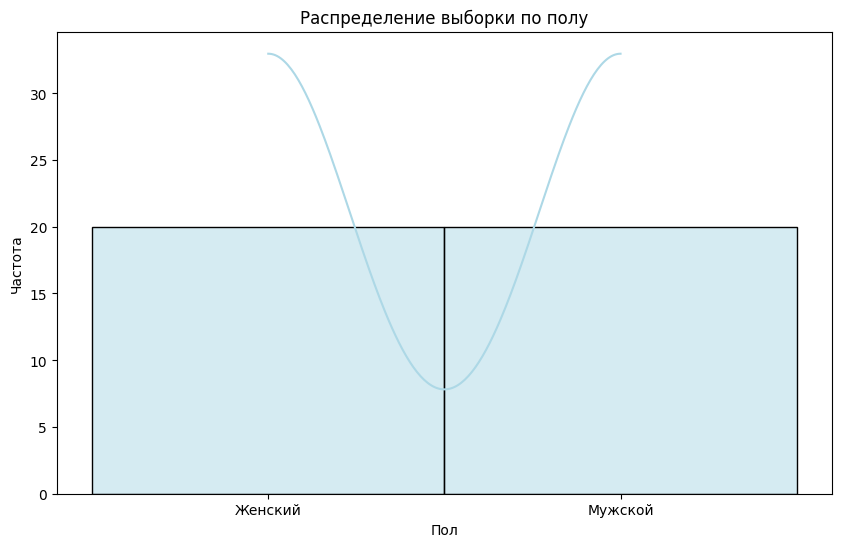

In [12]:
plt.figure(figsize=(10, 6))
sns.histplot(sample_description['Пол'], bins=100, kde=True, color='lightblue', edgecolor='black')

plt.xlabel('Пол')
plt.ylabel('Частота')
plt.title('Распределение выборки по полу')
plt.show()

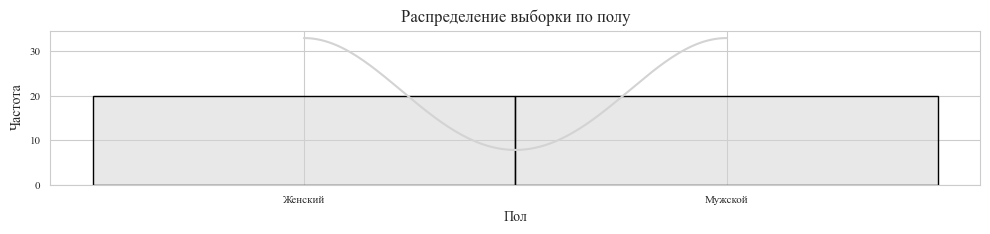

In [13]:
plt.figure(figsize=(12, 2))
sns.set_style("whitegrid")
sns.histplot(sample_description['Пол'], bins=100, kde=True, color='lightgray', edgecolor='black')

plt.xlabel('Пол', fontname='Times New Roman', fontsize=10)
plt.ylabel('Частота', fontname='Times New Roman', fontsize=10)
plt.title('Распределение выборки по полу', fontname='Times New Roman', fontsize=12)
plt.xticks(fontname='Times New Roman', fontsize=8)
plt.yticks(fontname='Times New Roman', fontsize=8)
plt.show()

## Гистограмма распределения выборки по возрасту

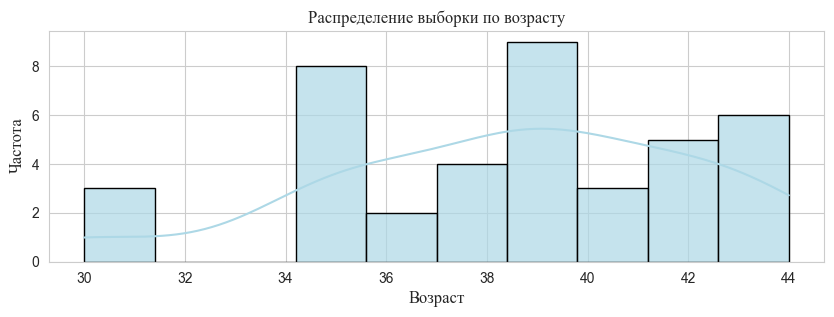

In [14]:
plt.figure(figsize=(10, 3))
sns.histplot(data=sample_description, 
             x='Возраст',
             bins=10, 
             kde=True, 
             color='lightblue', 
             edgecolor='black',
             alpha=0.7)  # Увеличение прозрачности гистограммы

plt.xlabel('Возраст', fontname='Times New Roman', fontsize=12)
plt.ylabel('Частота', fontname='Times New Roman', fontsize=12)
plt.title('Распределение выборки по возрасту', fontname='Times New Roman', fontsize=12)
plt.show()

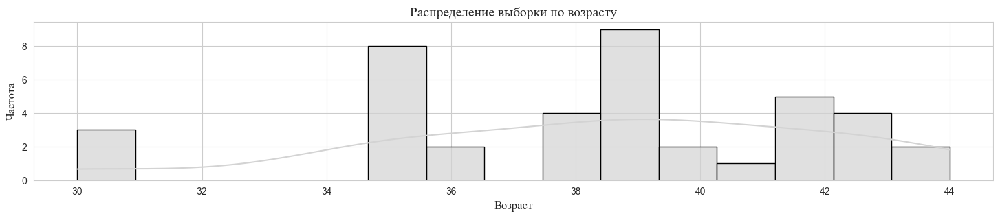

In [15]:
plt.figure(figsize=(18, 3))
sns.histplot(data=sample_description, 
             x='Возраст',
             bins=15, 
             kde=True, 
             color='lightgray', 
             edgecolor='black',
             alpha=0.7)  

plt.xlabel('Возраст', fontname='Times New Roman', fontsize=12)
plt.ylabel('Частота', fontname='Times New Roman', fontsize=12)
plt.title('Распределение выборки по возрасту', fontname='Times New Roman', fontsize=14)
plt.show()

In [16]:
sample_description['Возраст'].min()

30.0

In [17]:
sample_description['Возраст'].max()

44.0

## Гистограмма распределения выборки по возрасту с разбивкой по полу

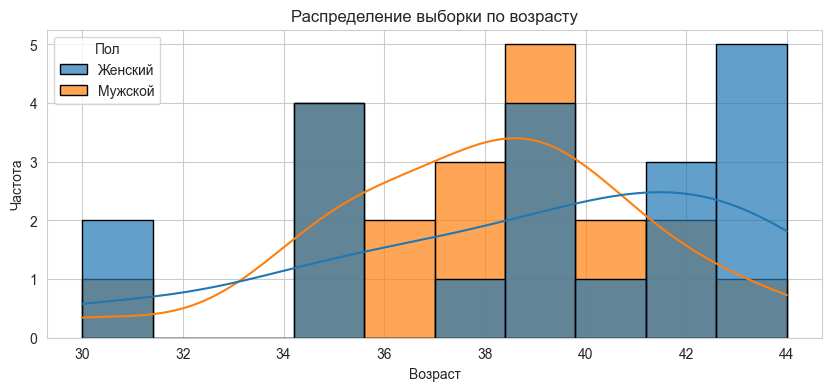

In [18]:
plt.figure(figsize=(10, 4))
sns.histplot(data=sample_description, 
             x='Возраст',
             hue='Пол',
             bins=10, 
             kde=True, 
             color='lightblue', 
             edgecolor='black',
             alpha=0.7,
            #multiple="stack"
            )  # Увеличение прозрачности гистограммы

plt.xlabel('Возраст')
plt.ylabel('Частота')
plt.title('Распределение выборки по возрасту')
plt.show()

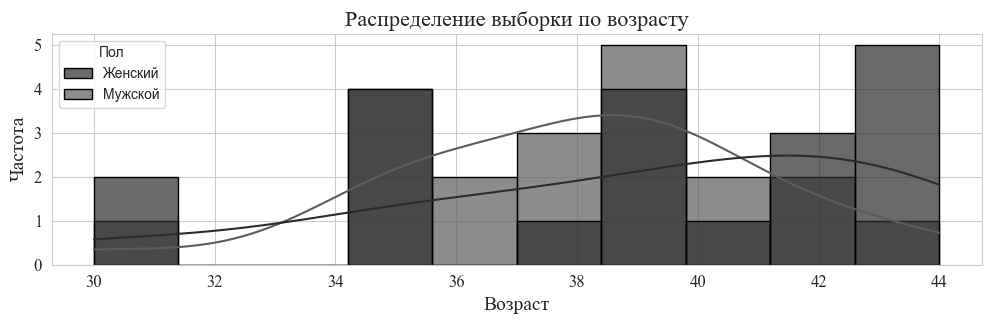

In [19]:
sns.set_palette("Greys_r")

plt.figure(figsize=(12, 3))
sns.histplot(data=sample_description, 
             x='Возраст',
             hue='Пол',
             bins=10, 
             kde=True, 
             color='lightgray', 
             edgecolor='black',
             alpha=0.7,
             #multiple="stack"
            )  # Increase histogram transparency

plt.xlabel('Возраст', fontname='Times New Roman', fontsize=14)
plt.ylabel('Частота', fontname='Times New Roman', fontsize=14)
plt.title('Распределение выборки по возрасту', fontname='Times New Roman', fontsize=16)
plt.xticks(fontname='Times New Roman', fontsize=12)
plt.yticks(fontname='Times New Roman', fontsize=12)
plt.show()

In [20]:
sample_description[sample_description['Пол'] == 'Женский']['Возраст'].mean()

38.85

In [21]:
sample_description[sample_description['Пол'] == 'Женский']['Возраст'].median()

39.0

In [22]:
sample_description[sample_description['Пол'] == 'Мужской']['Возраст'].mean()

37.95

In [23]:
sample_description[sample_description['Пол'] == 'Мужской']['Возраст'].median()

38.5

## Гистограмма распределения выборки по уровню образования

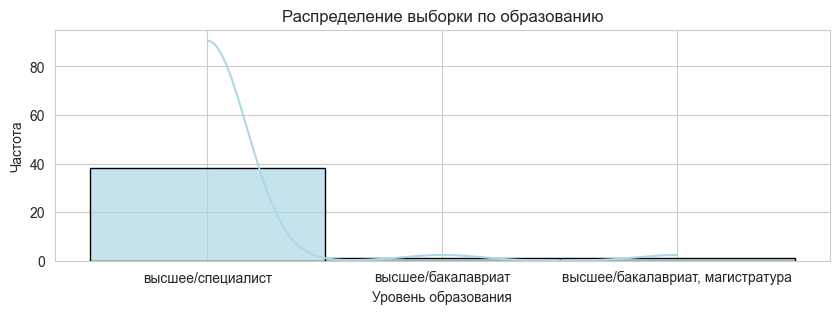

In [24]:
plt.figure(figsize=(10, 3))
sns.histplot(data=sample_description, 
             x='образование',
             bins=20, 
             kde=True, 
             color='lightblue', 
             edgecolor='black',
             alpha=0.7)  # Увеличение прозрачности гистограммы

plt.xlabel('Уровень образования')
plt.ylabel('Частота')
plt.title('Распределение выборки по образованию')
plt.show()

## Гистограмма распределения выборки по уровню дохода

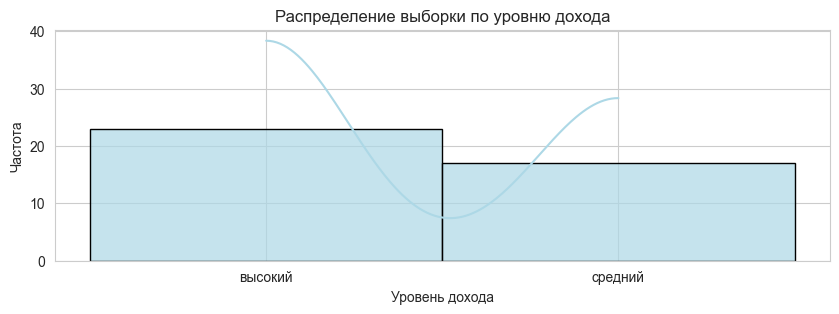

In [25]:
plt.figure(figsize=(10, 3))
#sns.set(font='Times New Roman')
sns.histplot(data=sample_description, 
             x='Доход',
             #hue="Пол",
             bins=20, 
             kde=True, 
             color='lightblue', 
             edgecolor='black',
             alpha=0.7)  # Увеличение прозрачности гистограммы

plt.xlabel('Уровень дохода')
plt.ylabel('Частота')
plt.title('Распределение выборки по уровню дохода')
plt.show()

## Гистограмма распределения выборки по уровню дохода с разбивкой по полу

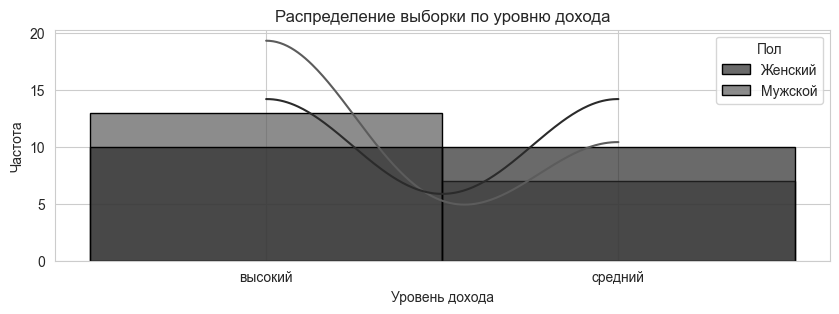

In [26]:
plt.figure(figsize=(10, 3))
sns.histplot(data=sample_description, 
             x='Доход',
             hue="Пол",
             bins=20, 
             kde=True, 
             color='lightblue', 
             edgecolor='black',
             alpha=0.7)  # Увеличение прозрачности гистограммы

plt.xlabel('Уровень дохода')
plt.ylabel('Частота')
plt.title('Распределение выборки по уровню дохода')
plt.show()

## Взаимосвязь между возрастом, полом и сферой деятельности

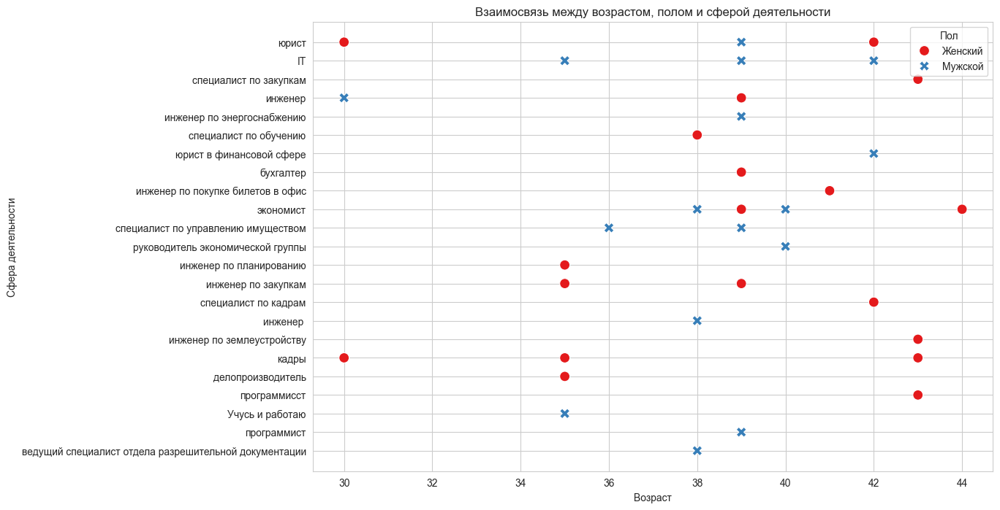

In [27]:
plt.figure(figsize=(12, 8))
sns.scatterplot(data=sample_description,
                x='Возраст', 
                y='Сфера деятельности', 
                hue='Пол', 
                style='Пол',  # Указываем столбец для различных стилей
                palette='Set1', s=100)

plt.xlabel('Возраст')
plt.ylabel('Сфера деятельности')
plt.title('Взаимосвязь между возрастом, полом и сферой деятельности')
plt.legend(title='Пол')
plt.show()

## Гистограмма распределения выборки по признаку получения дополнительного образования (вопрос «Вы учитесь или работаете?»)

In [28]:
data['Вы учитесь или работаете?'].value_counts()

Вы учитесь или работаете?
Только работаю     29
Учусь и работаю    11
Name: count, dtype: int64

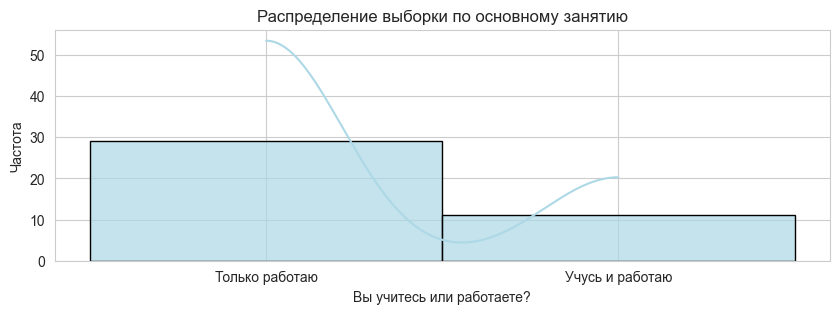

In [29]:
plt.figure(figsize=(10, 3))
sns.histplot(data=data, 
             x='Вы учитесь или работаете?',
             bins=20, 
             kde=True, 
             color='lightblue', 
             edgecolor='black',
             alpha=0.7)  # Увеличение прозрачности гистограммы

#plt.xlabel('Возраст')
plt.ylabel('Частота')
plt.title('Распределение выборки по основному занятию')
plt.show()

## Гистограмма распределения выборки по признаку получения дополнительного образования (вопрос «Вы учитесь или работаете?»)

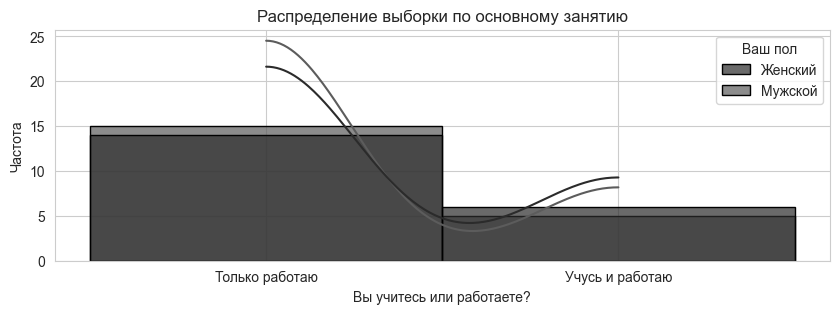

In [30]:
plt.figure(figsize=(10, 3))
sns.histplot(data=data, 
             x='Вы учитесь или работаете?',
             hue='Ваш пол',
             bins=20, 
             kde=True, 
             color='lightblue', 
             edgecolor='black',
             alpha=0.7)  # Увеличение прозрачности гистограммы

#plt.xlabel('Возраст')
plt.ylabel('Частота')
plt.title('Распределение выборки по основному занятию')
plt.show()

## Распределение выборки по сфере деятельности

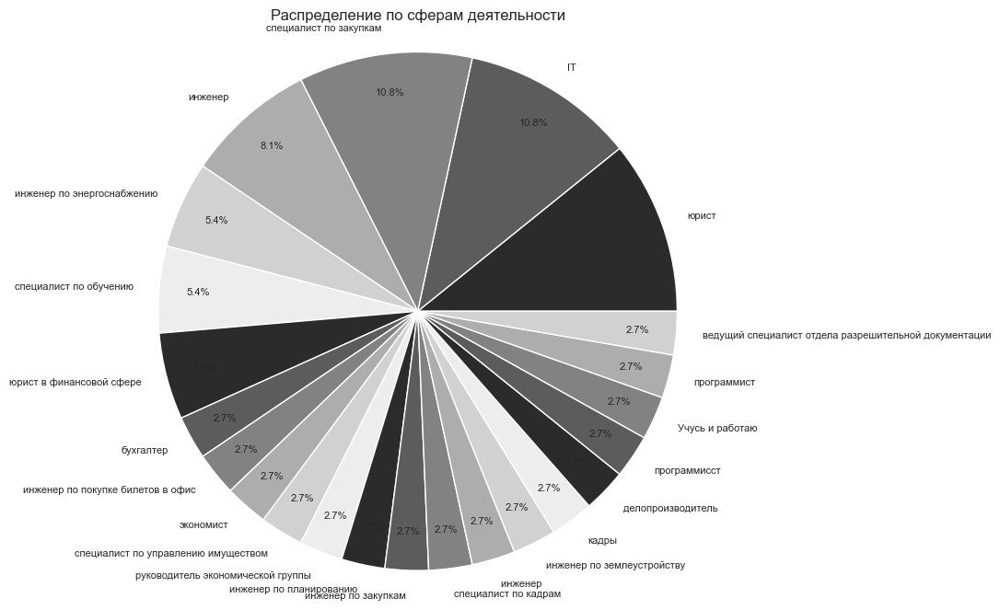

In [31]:
field_activity = sample_description['Сфера деятельности'].dropna()  # Удаляем отсутствующие значения, если они есть

labels = field_activity.unique()
sizes = field_activity.value_counts()

plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', 
        pctdistance=0.85,
        labeldistance=1.1, 
        textprops={'fontsize': 8}
       )
plt.axis('equal')  # Позволяет кругу оставаться кругом
plt.title('Распределение по сферам деятельности')
plt.show()

Далее проанализированы данные опросов.

# Опрос ЦОЛ-8 Леевик

## Обработка данных

В опроснике 50 вопросов. На каждый вопрос 7 вариантов ответа. 50 * 7 = 350.

In [32]:
values_data.head()

,"1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Совершенно не важно, есть у меня это качество или нет","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Скорее не важно, чем важно","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Не очень важно","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Важно в средней степени","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Скорее важно, чем не важно","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Очень важно","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Обладать этим качеством для меня самое главное в жизни.","2. Одеваться по моде: / Совершенно не важно, есть у меня это качество или нет","2. Одеваться по моде: / Скорее не важно, чем важно",2. Одеваться по моде: / Не очень важно,...,"49. Стремиться к самоусовершенствованию: / Скорее важно, чем не важно",49. Стремиться к самоусовершенствованию: / Очень важно,49. Стремиться к самоусовершенствованию: / Обладать этим качеством для меня самое главное в жизни.,"50. Участвовать в решении общественных и государственных вопросов: / Совершенно не важно, есть у меня это качество или нет","50. Участвовать в решении общественных и государственных вопросов: / Скорее не важно, чем важно",50. Участвовать в решении общественных и государственных вопросов: / Не очень важно,50. Участвовать в решении общественных и государственных вопросов: / Важно в средней степени,"50. Участвовать в решении общественных и государственных вопросов: / Скорее важно, чем не важно",50. Участвовать в решении общественных и государственных вопросов: / Очень важно,50. Участвовать в решении общественных и государственных вопросов: / Обладать этим качеством для меня самое главное в жизни.
0,NaN,NaN,NaN,NaN,"Скорее важно, чем не важно",NaN,NaN,NaN,"Скорее не важно, чем важно",NaN,...,NaN,Очень важно,NaN,NaN,"Скорее не важно, чем важно",NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,Очень важно,NaN,NaN,NaN,NaN,...,NaN,Очень важно,NaN,NaN,NaN,Не очень важно,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,Очень важно,NaN,NaN,NaN,Не очень важно,...,NaN,NaN,NaN,"Совершенно не важно, есть у меня это качество ...",NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,Очень важно,NaN,NaN,"Скорее не важно, чем важно",NaN,...,NaN,Очень важно,NaN,NaN,NaN,NaN,Важно в средней степени,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,"Скорее важно, чем не важно",NaN,NaN,"Совершенно не важно, есть у меня это качество ...",NaN,NaN,...,"Скорее важно, чем не важно",NaN,NaN,NaN,NaN,NaN,Важно в средней степени,NaN,NaN,NaN


Всего 50 вопросов. Столбики датафрейма начинаются с номера вопроса. Варианты ответа вписаны в столбик:

Мы просим оценить их по семибальной шкале. Цифры обозначают:

* 1 - совершенно не важно, есть у меня это качество или нет
* 2 - скорее не важно, чем важно
* 3 - не очень важно
* 4 важно в средней степени
* 5 скорее важно, чем не важно
* 6 очень важно
* 7 обладать этим качеством для меня самое главное в жизни.



Вместо первых 7ми столбиков, которые начинаются с цифры "1", оставить один столбец до перечисления вариаентов ответа. Для каждого респондента есть один не NaN.

### Пример

Сначала посмотрим только первые столбцов (это вопрос первый и разными вариантами ответа):

In [33]:
example = values_data.iloc[:, 0:7]
example.head()

,"1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Совершенно не важно, есть у меня это качество или нет","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Скорее не важно, чем важно","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Не очень важно","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Важно в средней степени","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Скорее важно, чем не важно","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Очень важно","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Обладать этим качеством для меня самое главное в жизни."
0,NaN,NaN,NaN,NaN,"Скорее важно, чем не важно",NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,Очень важно,NaN
2,NaN,NaN,NaN,NaN,NaN,Очень важно,NaN
3,NaN,NaN,NaN,NaN,NaN,Очень важно,NaN
4,NaN,NaN,NaN,NaN,"Скорее важно, чем не важно",NaN,NaN


Добавляем новый столбец agg:

In [34]:
example['answer'] = example.apply(
    lambda row: next(                                  # выводим следующее значение
        (val for val in row if not pd.isna(val)),      # если оно не равно NaN
                     np.nan),                          # в противном случае - NaN
    axis=1)

In [35]:
example.head()

,"1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Совершенно не важно, есть у меня это качество или нет","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Скорее не важно, чем важно","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Не очень важно","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Важно в средней степени","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Скорее важно, чем не важно","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Очень важно","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Обладать этим качеством для меня самое главное в жизни.",answer
0,NaN,NaN,NaN,NaN,"Скорее важно, чем не важно",NaN,NaN,"Скорее важно, чем не важно"
1,NaN,NaN,NaN,NaN,NaN,Очень важно,NaN,Очень важно
2,NaN,NaN,NaN,NaN,NaN,Очень важно,NaN,Очень важно
3,NaN,NaN,NaN,NaN,NaN,Очень важно,NaN,Очень важно
4,NaN,NaN,NaN,NaN,"Скорее важно, чем не важно",NaN,NaN,"Скорее важно, чем не важно"


### Группировка данных

Теперь надо применить метод ко всему датафрейму с опросом:

In [36]:
for i in range(0, 50 * 7, 7): # для каждых семи ответов из 50-ти вопросов 
    block_columns = values_data.iloc[:, i:i+7]  # Выбираем блок из 7 столбцов
    values_data[f'Вопрос {i//7 + 1}'] = block_columns.apply(lambda row:next(
        (val for val in row if not pd.isna(val)),
        np.nan),axis=1)

In [37]:
values_data.iloc[:, -50:].head()

,Вопрос 1,Вопрос 2,Вопрос 3,Вопрос 4,Вопрос 5,Вопрос 6,Вопрос 7,Вопрос 8,Вопрос 9,Вопрос 10,...,Вопрос 41,Вопрос 42,Вопрос 43,Вопрос 44,Вопрос 45,Вопрос 46,Вопрос 47,Вопрос 48,Вопрос 49,Вопрос 50
0,"Скорее важно, чем не важно","Скорее не важно, чем важно","Скорее не важно, чем важно","Скорее не важно, чем важно",Очень важно,"Скорее важно, чем не важно","Скорее важно, чем не важно","Скорее важно, чем не важно",Не очень важно,"Скорее не важно, чем важно",...,"Скорее важно, чем не важно",Очень важно,Очень важно,"Скорее важно, чем не важно",Очень важно,Очень важно,Очень важно,Очень важно,Очень важно,"Скорее не важно, чем важно"
1,Очень важно,Важно в средней степени,Очень важно,"Скорее важно, чем не важно",Очень важно,Очень важно,"Скорее важно, чем не важно",Важно в средней степени,Важно в средней степени,Важно в средней степени,...,Очень важно,"Скорее важно, чем не важно",Очень важно,"Скорее важно, чем не важно","Скорее важно, чем не важно",Очень важно,Очень важно,"Скорее важно, чем не важно",Очень важно,Не очень важно
2,Очень важно,Не очень важно,Очень важно,Важно в средней степени,Очень важно,"Скорее не важно, чем важно","Скорее важно, чем не важно",Важно в средней степени,"Скорее важно, чем не важно",Важно в средней степени,...,"Скорее важно, чем не важно",Очень важно,"Скорее важно, чем не важно","Скорее важно, чем не важно",Очень важно,Очень важно,Очень важно,"Скорее не важно, чем важно",Важно в средней степени,"Совершенно не важно, есть у меня это качество ..."
3,Очень важно,"Скорее не важно, чем важно",Очень важно,Очень важно,Очень важно,Очень важно,"Скорее важно, чем не важно","Скорее важно, чем не важно",Важно в средней степени,Важно в средней степени,...,Очень важно,Очень важно,Очень важно,Очень важно,Очень важно,Важно в средней степени,Очень важно,Очень важно,Очень важно,Важно в средней степени
4,"Скорее важно, чем не важно","Совершенно не важно, есть у меня это качество ...","Скорее важно, чем не важно","Совершенно не важно, есть у меня это качество ...",Очень важно,Очень важно,Очень важно,Важно в средней степени,"Скорее важно, чем не важно",Важно в средней степени,...,"Скорее важно, чем не важно",Важно в средней степени,"Скорее важно, чем не важно","Скорее важно, чем не важно",Очень важно,"Скорее важно, чем не важно",Очень важно,"Скорее важно, чем не важно","Скорее важно, чем не важно",Важно в средней степени


В конце датафрейма получили агрегированные данные по ответу на каждый вопрос.

In [38]:
for i in range(0, 50 * 7, 7):
    block_columns = values_data.iloc[:, i:i+7]  #  блок из 7 столбцов
    for column in block_columns.columns:
        match = re.match(r'([^:]+):', column) # регулярное выражение, чтобы оставить только вопрос
                                              # убрали весь текст после символа : /
        if match:
            new_column_name = match.group(1)  # Имя нового столбца
          
            values_data[f'{new_column_name}'] = block_columns.apply(
                lambda row:next((val for val in row if not pd.isna(val)), 
                                np.nan),
                axis=1)

In [39]:
values_preprocessed = values_data.iloc[:, -50:]
values_preprocessed.head(20)

,"1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру)",2. Одеваться по моде,3. Быстро овладевать профессиональными умениями,4. Быть в курсе последних местных новостей,5. Быть смелым в принятии решений,6. Уметь понимать ошибки и заблуждения других людей,"7. Понимать прекрасное в человеке, природе и искусстве",8. Иметь педагогические способности (уметь учить и воспитывать людей),9. Быть скромным,10. Заниматься общественной работой в группе,...,41. Иметь собственное мнение по самым разным производственным и житейским вопросам,42. Быть материально обеспеченным,"43. Быть хорошим специалистом, до тонкостей знающим свое дело",44. Быть в хороших отношениях с товарищами по учебе,45. Уметь владеть собой в трудных жизненных ситуациях,46. Быть готовым словом и делом помочь другим людям,"47. Быть жизнерадостным, иметь чувство юмора","48. Быть выносливым, способным длительно и напряженно трудиться",49. Стремиться к самоусовершенствованию,50. Участвовать в решении общественных и государственных вопросов
0,"Скорее важно, чем не важно","Скорее не важно, чем важно","Скорее не важно, чем важно","Скорее не важно, чем важно",Очень важно,"Скорее важно, чем не важно","Скорее важно, чем не важно","Скорее важно, чем не важно",Не очень важно,"Скорее не важно, чем важно",...,"Скорее важно, чем не важно",Очень важно,Очень важно,"Скорее важно, чем не важно",Очень важно,Очень важно,Очень важно,Очень важно,Очень важно,"Скорее не важно, чем важно"
1,Очень важно,Важно в средней степени,Очень важно,"Скорее важно, чем не важно",Очень важно,Очень важно,"Скорее важно, чем не важно",Важно в средней степени,Важно в средней степени,Важно в средней степени,...,Очень важно,"Скорее важно, чем не важно",Очень важно,"Скорее важно, чем не важно","Скорее важно, чем не важно",Очень важно,Очень важно,"Скорее важно, чем не важно",Очень важно,Не очень важно
2,Очень важно,Не очень важно,Очень важно,Важно в средней степени,Очень важно,"Скорее не важно, чем важно","Скорее важно, чем не важно",Важно в средней степени,"Скорее важно, чем не важно",Важно в средней степени,...,"Скорее важно, чем не важно",Очень важно,"Скорее важно, чем не важно","Скорее важно, чем не важно",Очень важно,Очень важно,Очень важно,"Скорее не важно, чем важно",Важно в средней степени,"Совершенно не важно, есть у меня это качество ..."
3,Очень важно,"Скорее не важно, чем важно",Очень важно,Очень важно,Очень важно,Очень важно,"Скорее важно, чем не важно","Скорее важно, чем не важно",Важно в средней степени,Важно в средней степени,...,Очень важно,Очень важно,Очень важно,Очень важно,Очень важно,Важно в средней степени,Очень важно,Очень важно,Очень важно,Важно в средней степени
4,"Скорее важно, чем не важно","Совершенно не важно, есть у меня это качество ...","Скорее важно, чем не важно","Совершенно не важно, есть у меня это качество ...",Очень важно,Очень важно,Очень важно,Важно в средней степени,"Скорее важно, чем не важно",Важно в средней степени,...,"Скорее важно, чем не важно",Важно в средней степени,"Скорее важно, чем не важно","Скорее важно, чем не важно",Очень важно,"Скорее важно, чем не важно",Очень важно,"Скорее важно, чем не важно","Скорее важно, чем не важно",Важно в средней степени
5,Очень важно,"Скорее важно, чем не важно","Скорее важно, чем не важно",Не очень важно,Не очень важно,Важно в средней степени,"Скорее не важно, чем важно","Скорее не важно, чем важно",Не очень важно,Не очень важно,...,Очень важно,Обладать этим качеством для меня самое главное...,"Скорее важно, чем не важно",Очень важно,Очень важно,"Скорее важно, чем не важно",Обладать этим качеством для меня самое главное...,"Скорее важно, чем не важно","Скорее важно, чем не важно",Не очень важно
6,Очень важно,Не очень важно,Очень важно,Не очень важно,Очень важно,"Скорее важно, чем не важно",Важно в средней степени,Очень важно,Важно в средней степени,Не очень важно,...,Очень важно,"Скорее важно, чем не важно",Обладать этим качеством для меня самое главное...,Важно в средней степени,Обладать этим качеством для ме

In [40]:
values_preprocessed.isna().sum().to_frame()

,0
"1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру)",0
2. Одеваться по моде,0
3. Быстро овладевать профессиональными умениями,0
4. Быть в курсе последних местных новостей,0
5. Быть смелым в принятии решений,0
6. Уметь понимать ошибки и заблуждения других людей,0
"7. Понимать прекрасное в человеке, природе и искусстве",0
8. Иметь педагогические способности (уметь учить и воспитывать людей),0
9. Быть скромным,0
10. Заниматься общественной работой в группе,0


Пропущенные значения заменим фразой "Важно в средней степени":

In [41]:
values_preprocessed = values_preprocessed.fillna("Важно в средней степени")

In [42]:
values_preprocessed.to_excel('values_preprocesses_answers.xlsx', index=False)

### Ключ расшифровки

Заменим варианты ответа цифрами, согласно методике обработки опроса:
* 1 - Совершенно не важно, есть у меня это качество или нет
* 2 - Скорее не важно, чем важно
* 3 - Не очень важно
* 4 - Важно в средней степени
* 5 - Скорее важно, чем не важно
* 6 - Очень важно
* 7 - Обладать этим качеством для меня самое главное в жизни

In [43]:
values_answers_keys = {
    "Совершенно не важно, есть у меня это качество или нет": 1,
    "Скорее не важно, чем важно": 2,
    "Не очень важно": 3,
    "Важно в средней степени": 4,
    "Скорее важно, чем не важно": 5,
    "Очень важно": 6,
    "Обладать этим качеством для меня самое главное в жизни.": 7
}

In [44]:
values_preprocessed.replace(values_answers_keys, inplace=True)

In [45]:
values_preprocessed.head()

,"1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру)",2. Одеваться по моде,3. Быстро овладевать профессиональными умениями,4. Быть в курсе последних местных новостей,5. Быть смелым в принятии решений,6. Уметь понимать ошибки и заблуждения других людей,"7. Понимать прекрасное в человеке, природе и искусстве",8. Иметь педагогические способности (уметь учить и воспитывать людей),9. Быть скромным,10. Заниматься общественной работой в группе,...,41. Иметь собственное мнение по самым разным производственным и житейским вопросам,42. Быть материально обеспеченным,"43. Быть хорошим специалистом, до тонкостей знающим свое дело",44. Быть в хороших отношениях с товарищами по учебе,45. Уметь владеть собой в трудных жизненных ситуациях,46. Быть готовым словом и делом помочь другим людям,"47. Быть жизнерадостным, иметь чувство юмора","48. Быть выносливым, способным длительно и напряженно трудиться",49. Стремиться к самоусовершенствованию,50. Участвовать в решении общественных и государственных вопросов
0,5,2,2,2,6,5,5,5,3,2,...,5,6,6,5,6,6,6,6,6,2
1,6,4,6,5,6,6,5,4,4,4,...,6,5,6,5,5,6,6,5,6,3
2,6,3,6,4,6,2,5,4,5,4,...,5,6,5,5,6,6,6,2,4,1
3,6,2,6,6,6,6,5,5,4,4,...,6,6,6,6,6,4,6,6,6,4
4,5,1,5,1,6,6,6,4,5,4,...,5,4,5,5,6,5,6,5,5,4


In [46]:
values_preprocessed.iloc[:, :5]

,"1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру)",2. Одеваться по моде,3. Быстро овладевать профессиональными умениями,4. Быть в курсе последних местных новостей,5. Быть смелым в принятии решений
0,5,2,2,2,6
1,6,4,6,5,6
2,6,3,6,4,6
3,6,2,6,6,6
4,5,1,5,1,6
5,6,5,5,3,3
6,6,3,6,3,6
7,6,4,6,3,4
8,6,4,6,5,5
9,6,1,6,3,5


In [47]:
values_preprocessed.to_excel('values_preprocessed_keys.xlsx', index=False)

## Результаты диагностики

**Это мы не будем делать:**

Для облегчения процесса применения ключа расширофки и диагностики оставим в названиях столбцов только номер вопроса:

In [48]:
#new_column_names = {old_column: old_column.split('.')[0] for old_column in values_preprocessed.columns}
#values_preprocessed = values_preprocessed.rename(columns=new_column_names)
#values_preprocessed.head()

In [49]:
values_preprocessed.columns

Index(['1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру)',
       '2. Одеваться по моде',
       '3. Быстро овладевать профессиональными умениями',
       '4. Быть в курсе последних местных новостей',
       '5. Быть смелым в принятии решений',
       '6. Уметь понимать ошибки и заблуждения других людей',
       '7. Понимать прекрасное в человеке, природе и искусстве',
       '8. Иметь педагогические способности (уметь учить и воспитывать людей)',
       '9. Быть скромным', '10. Заниматься общественной работой в группе',
       '11. Знать последние достижения науки и техники в своей профессиональной области',
       '12. Иметь свою благоустроенную квартиру',
       '13. Сознавать, понимать полезность своего труда для других людей',
       '14. Иметь возможность общаться с товарищами',
       '15. Быть инициативным, самостоятельным в решении задач',
       '16. Быть искренним в отношениях с людьми',
       '17. Быть уверенным в себе и своих силах',
       '

# ТУТ НЕПРАВИЛЬНО!!!

In [50]:
#values_preprocessed[['10', '20', '30', '40', '50']]

In [51]:
#values_preprocessed[['11', '13', '23', '26', '33', '43']]

Создаем словарь для ключа расшифровки:

In [52]:
values = {
    'ЦО на труд': ['11', '13', '23', '26', '33', '43'],
    'ЦО на общение': [4, 14, 24, 34, 44, 47],
    'ЦО на познание': [1, 21, 31, 39, 49],
    'ЦО на общественно-политическую деятельность (ОПД)': [10, 20, 30, 40, 50],
    'ЦО на материальные ценности': [2, 3, 12, 18, 22, 32, 42],
    'ЦО на развитие нравственных качеств': [6, 16, 27, 37, 46],
    'ЦО на развитие деловых качеств': [8, 15, 28, 38, 41, 48],
    'ЦО на развитие волевых качеств': [5, 17, 25, 35, 45],
    'ЦО на развитие моральных качеств': [7, 9, 19, 29, 36] 
}

In [53]:
values_interpretation = {
    'ЦО на труд': [11, 13, 23, 26, 33, 43],
    'ЦО на общение': [4, 14, 24, 34, 44, 47],
    'ЦО на познание': [1, 21, 31, 39, 49],
    'ЦО на общественно-политическую деятельность (ОПД)': [10, 20, 30, 40, 50],
    'ЦО на материальные ценности': [2, 3, 12, 18, 22, 32, 42],
    'ЦО на развитие нравственных качеств': [6, 16, 27, 37, 46],
    'ЦО на развитие деловых качеств': [8, 15, 28, 38, 41, 48],
    'ЦО на развитие волевых качеств': [5, 17, 25, 35, 45],
    'ЦО на развитие моральных качеств': [7, 9, 19, 29, 36] 
}

In [54]:
# НАЗВАНИЯ КОЛОНОК - ЭТО СТРОКИ!!!

values_interpretation_str = {
    'ЦО на труд': [11, 13, '23', '26', '33', '43'],
    'ЦО на общение': [4, 14, 24, 34, 44, 47],
    'ЦО на познание': [1, 21, 31, 39, 49],
    'ЦО на общественно-политическую деятельность (ОПД)': [10, 20, 30, 40, 50],
    'ЦО на материальные ценности': [2, 3, 12, 18, 22, 32, 42],
    'ЦО на развитие нравственных качеств': [6, 16, 27, 37, 46],
    'ЦО на развитие деловых качеств': [8, 15, 28, 38, 41, 48],
    'ЦО на развитие волевых качеств': [5, 17, 25, 35, 45],
    'ЦО на развитие моральных качеств': [7, 9, 19, 29, 36] 
}

In [55]:
# Словарь определения столбцов для сложения
values_interpretation_check = {
    'ЦО на труд': ['11', '13', '23', '26', '33', '43'],
    'ЦО на общение': ['4', '14', '24', '34', '44', '47'],
    'ЦО на познание': ['1', '21', '31', '39', '49'],
    'ЦО на общественно-политическую деятельность (ОПД)': ['10', '20', '30', '40', '50'],
    'ЦО на материальные ценности': ['2', '3', '12', '18', '22', '32', '42'],
    'ЦО на развитие нравственных качеств': ['6', '16', '27', '37', '46'],
    'ЦО на развитие деловых качеств': ['8', '15', '28', '38', '41', '48'],
    'ЦО на развитие волевых качеств': ['5', '17', '25', '35', '45'],
    'ЦО на развитие моральных качеств': ['7', '9', '19', '29', '36'] 
}

# Создаем датафрейм из предоставленных данных
data_check = pd.DataFrame({
    '11': [5, 6, 6, 6, 5, 6],
    '13': [2, 4, 3, 2, 1, 5],
    '23': [2, 6, 6, 6, 5, 5],
    '26': [2, 5, 4, 6, 1, 3],
    '33': [6, 6, 6, 6, 6, 3],
    '4': [6, 4, 3, 5, 2, 1],
    '14': [1, 3, 5, 7, 9, 2],
    '24': [3, 5, 7, 9, 1, 3],
    '34': [5, 7, 9, 1, 3, 5],
    '44': [7, 9, 1, 3, 5, 7],
    '47': [9, 1, 3, 5, 7, 9]
})

# Создаем новый столбец для каждой пары в словаре, если все столбцы присутствуют в датафрейме
for col_name, cols_to_sum in values_interpretation_check.items():
    if all(col in data_check.columns for col in cols_to_sum):
        data_check[col_name] = data_check[cols_to_sum].sum(axis=1)

# Отображение данных с новыми столбцами
data_check

,11,13,23,26,33,4,14,24,34,44,47,ЦО на общение
0,5,2,2,2,6,6,1,3,5,7,9,31
1,6,4,6,5,6,4,3,5,7,9,1,29
2,6,3,6,4,6,3,5,7,9,1,3,28
3,6,2,6,6,6,5,7,9,1,3,5,30
4,5,1,5,1,6,2,9,1,3,5,7,27
5,6,5,5,3,3,1,2,3,5,7,9,27


In [56]:
# Sum values for each column and create new columns
#for value_name, value_question_column in values_interpretation.items():
    # Convert column indices to integer if they are string
    #value_question_column = [int(col) if isinstance(col, str) else col for col in value_question_column]
    # Sum values across rows for the specified columns and assign it to a new column
    #values_preprocessed[value_name] = values_preprocessed.iloc[:, value_question_column].sum(axis=1)

In [57]:
#values_preprocessed

In [58]:
#for value_name, value_question_column in values.items():
    #values_preprocessed[value_name] = values_preprocessed.iloc[:, value_question_column].sum(axis=1)
    #values_preprocessed[value_name] = values_preprocessed.iloc[:, value_question_column].sum(axis=1)


In [59]:
#values_aggregated = values_preprocessed.iloc[:, -9:]
#values_aggregated.head()

In [60]:
#scale

In [61]:
values_interpretation = {
    'ЦО на труд': [11, 13, 23, 26, 33, 43],
    'ЦО на общение': [4, 14, 24, 34, 44, 47],
    'ЦО на познание': [1, 21, 31, 39, 49],
    'ЦО на общественно-политическую деятельность (ОПД)': [10, 20, 30, 40, 50],
    'ЦО на материальные ценности': [2, 3, 12, 18, 22, 32, 42],
    'ЦО на развитие нравственных качеств': [6, 16, 27, 37, 46],
    'ЦО на развитие деловых качеств': [8, 15, 28, 38, 41, 48],
    'ЦО на развитие волевых качеств': [5, 17, 25, 35, 45],
    'ЦО на развитие моральных качеств': [7, 9, 19, 29, 36] 
}

Для каждого респондента просуммируем баллы по целям жизни и средствам достижения целей жизни:

In [62]:
#for value, indices in values.items():
    #values_preprocessed[value] = values_preprocessed.iloc[:, indices].sum(axis=1)

**БЫЛО ТАК, НО ДЕЛАТЬ НЕ БУДЕМ:**

In [63]:
#for value_name, value_question_column in values_interpretation.items():
    #values_preprocessed[value_name] = values_preprocessed.iloc[:, value_question_column].sum(axis=1)

# НОВАЯ ОБРАБОТКА

Датасет с опросом Леевика (ценности):

In [64]:
values_preprocessed.head()

,"1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру)",2. Одеваться по моде,3. Быстро овладевать профессиональными умениями,4. Быть в курсе последних местных новостей,5. Быть смелым в принятии решений,6. Уметь понимать ошибки и заблуждения других людей,"7. Понимать прекрасное в человеке, природе и искусстве",8. Иметь педагогические способности (уметь учить и воспитывать людей),9. Быть скромным,10. Заниматься общественной работой в группе,...,41. Иметь собственное мнение по самым разным производственным и житейским вопросам,42. Быть материально обеспеченным,"43. Быть хорошим специалистом, до тонкостей знающим свое дело",44. Быть в хороших отношениях с товарищами по учебе,45. Уметь владеть собой в трудных жизненных ситуациях,46. Быть готовым словом и делом помочь другим людям,"47. Быть жизнерадостным, иметь чувство юмора","48. Быть выносливым, способным длительно и напряженно трудиться",49. Стремиться к самоусовершенствованию,50. Участвовать в решении общественных и государственных вопросов
0,5,2,2,2,6,5,5,5,3,2,...,5,6,6,5,6,6,6,6,6,2
1,6,4,6,5,6,6,5,4,4,4,...,6,5,6,5,5,6,6,5,6,3
2,6,3,6,4,6,2,5,4,5,4,...,5,6,5,5,6,6,6,2,4,1
3,6,2,6,6,6,6,5,5,4,4,...,6,6,6,6,6,4,6,6,6,4
4,5,1,5,1,6,6,6,4,5,4,...,5,4,5,5,6,5,6,5,5,4


In [65]:
# Создание столбцов для целей жизни на труд
values_preprocessed['ЦО на труд'] = values_preprocessed[['11. Знать последние достижения науки и техники в своей профессиональной области',
                                             '13. Сознавать, понимать полезность своего труда для других людей',
                                             '23. Получать удовольствие от процесса труда',
                                             '26. Быть ответственным за порученное дело',
                                             '33. Приобрести богатый профессиональный опыт',
                                             '43. Быть хорошим специалистом, до тонкостей знающим свое дело']].sum(axis=1)

# Создание столбцов для целей жизни на общение
values_preprocessed['ЦО на общение'] = values_preprocessed[['4. Быть в курсе последних местных новостей',
                                               '14. Иметь возможность общаться с товарищами',
                                               '24. Отдыхать в приятном общении с друзьями',
                                               '34. Испытывать удовлетворение от общения с товарищами по производственным и непроизводственным вопросам',
                                               '44. Быть в хороших отношениях с товарищами по учебе',
                                               '47. Быть жизнерадостным, иметь чувство юмора']].sum(axis=1)

# Создание столбцов для целей жизни на познание
values_preprocessed['ЦО на познание'] = values_preprocessed[['1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру)',
                                                 '21. Быть зрелым, мудрым в суждениях, опираться на здравый смысл в понимании жизни',
                                                 '31. Стараться расширить свой кругозор, повысить образование, общую культуру и интеллект',
                                                 '39. Быть самокритичным, критически относиться к достигнутому',
                                                 '49. Стремиться к самоусовершенствованию']].sum(axis=1)


# Создание столбцов для целей жизни на общественно-политическую деятельность (ОПД)
values_preprocessed['ЦО на ОПД'] = values_preprocessed[['10. Заниматься общественной работой в группе',
                                           '20. Заниматься общественной работой или работать в выборных органах училища (техникума)',
                                           '30. Выполнять отдельные важные общественные поручения в своем коллективе (в группе, общежитии)',
                                           '40. Работать в дружине по охране порядка и т.п.',
                                           '50. Участвовать в решении общественных и государственных вопросов']].sum(axis=1)

# Создание столбцов для целей жизни на материальные ценности
values_preprocessed['ЦО на материальные ценности'] = values_preprocessed[['2. Одеваться по моде',
                                                             '3. Быстро овладевать профессиональными умениями',
                                                             '12. Иметь свою благоустроенную квартиру',
                                                             '18. Уметь устанавливать хорошие отношения с нужными людьми',
                                                             '22. Иметь личную автомашину',
                                                             '32. Получать высокую заработную плату',
                                                             '42. Быть материально обеспеченным']].sum(axis=1)

In [66]:
# Создание столбцов для средств достижения целей жизни

# Создание столбцов для развития нравственных качеств
values_preprocessed['ЦО на развитие нравственных качеств'] = values_preprocessed[['6. Уметь понимать ошибки и заблуждения других людей',
                                                                   '16. Быть искренним в отношениях с людьми',
                                                                   '27. Уметь почувствовать и сопереживать горе, беду другого человека',
                                                                   '37. Любить людей, уважать их, быть чутким к их взглядам, обычаям, привычкам',
                                                                   '46. Быть готовым словом и делом помочь другим людям']].sum(axis=1)

# Создание столбцов для развития деловых качеств
values_preprocessed['ЦО на развитие деловых качеств'] = values_preprocessed[['8. Иметь педагогические способности (уметь учить и воспитывать людей)',
                                                               '15. Быть инициативным, самостоятельным в решении задач',
                                                               '28. Уметь быстро оценить и предвидеть возможные варианты хода событий',
                                                               '38. Обладать организаторскими способностями, уметь организовать, мобилизовать, сплотить труд и отдых людей',
                                                               '41. Иметь собственное мнение по самым разным производственным и житейским вопросам',
                                                               '48. Быть выносливым, способным длительно и напряженно трудиться']].sum(axis=1)

# Создание столбцов для развития волевых качеств
values_preprocessed['ЦО на развитие волевых качеств'] = values_preprocessed[['5. Быть смелым в принятии решений',
                                                               '17. Быть уверенным в себе и своих силах',
                                                               '25. Уметь быстро решать производственные и житейские вопросы',
                                                               '35. Быть настойчивым и упорным в преодолении трудностей и достижении цели',
                                                               '45. Уметь владеть собой в трудных жизненных ситуациях']].sum(axis=1)

# Создание столбцов для развития моральных качеств
values_preprocessed['ЦО на развитие моральных качеств'] = values_preprocessed[['7. Понимать прекрасное в человеке, природе и искусстве',
                                                                '9. Быть скромным',
                                                                '19. Иметь чувство собственного достоинства',
                                                                '29. Быть требовательным к себе',
                                                                '36. Быть бескорыстным']].sum(axis=1)

In [67]:
values_preprocessed

,"1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру)",2. Одеваться по моде,3. Быстро овладевать профессиональными умениями,4. Быть в курсе последних местных новостей,5. Быть смелым в принятии решений,6. Уметь понимать ошибки и заблуждения других людей,"7. Понимать прекрасное в человеке, природе и искусстве",8. Иметь педагогические способности (уметь учить и воспитывать людей),9. Быть скромным,10. Заниматься общественной работой в группе,...,50. Участвовать в решении общественных и государственных вопросов,ЦО на труд,ЦО на общение,ЦО на познание,ЦО на ОПД,ЦО на материальные ценности,ЦО на развитие нравственных качеств,ЦО на развитие деловых качеств,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств
0,5,2,2,2,6,5,5,5,3,2,...,2,31,28,28,12,29,27,30,28,23
1,6,4,6,5,6,6,5,4,4,4,...,3,33,30,27,17,36,26,30,28,23
2,6,3,6,4,6,2,5,4,5,4,...,1,31,31,24,15,37,22,27,28,27
3,6,2,6,6,6,6,5,5,4,4,...,4,34,35,28,21,39,25,34,29,25
4,5,1,5,1,6,6,6,4,5,4,...,4,30,29,26,17,29,27,30,30,27
5,6,5,5,3,3,4,2,2,3,3,...,3,32,34,25,14,42,26,28,25,20
6,6,3,6,3,6,5,4,6,4,3,...,2,34,23,27,13,32,20,33,31,24
7,6,4,6,3,4,5,4,4,3,2,...,4,33,29,29,16,40,29,32,27,25
8,6,4,6,5,5,5,5,6,4,3,...,1,36,31,27,11,35,26,30,29,27
9,6,1,6,3,5,4,3,3,1,1,...,3,39,25,29,11,37,28,31,31,21


Оставляем последние 8 столбцов с ЦОЛ-8:

In [68]:
values_aggregated = values_preprocessed.iloc[:, -9:]
values_aggregated.head()

,ЦО на труд,ЦО на общение,ЦО на познание,ЦО на ОПД,ЦО на материальные ценности,ЦО на развитие нравственных качеств,ЦО на развитие деловых качеств,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств
0,31,28,28,12,29,27,30,28,23
1,33,30,27,17,36,26,30,28,23
2,31,31,24,15,37,22,27,28,27
3,34,35,28,21,39,25,34,29,25
4,30,29,26,17,29,27,30,30,27


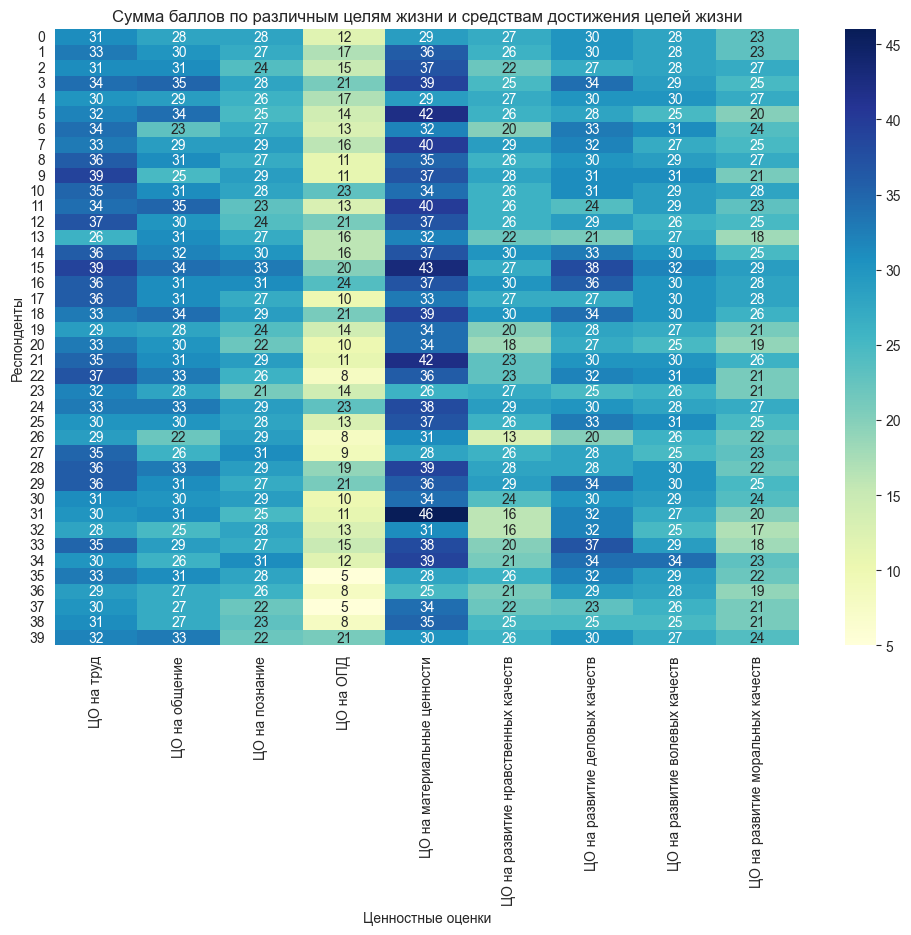

In [69]:
# Создаем тепловую карту
plt.figure(figsize=(12, 8))
sns.heatmap(values_aggregated, cmap="YlGnBu", annot=True, fmt="d")

# Добавляем подписи осей и заголовок
plt.xlabel('Ценностные оценки')
plt.ylabel('Респонденты')
plt.title('Сумма баллов по различным целям жизни и средствам достижения целей жизни')

# Показываем график
plt.show()

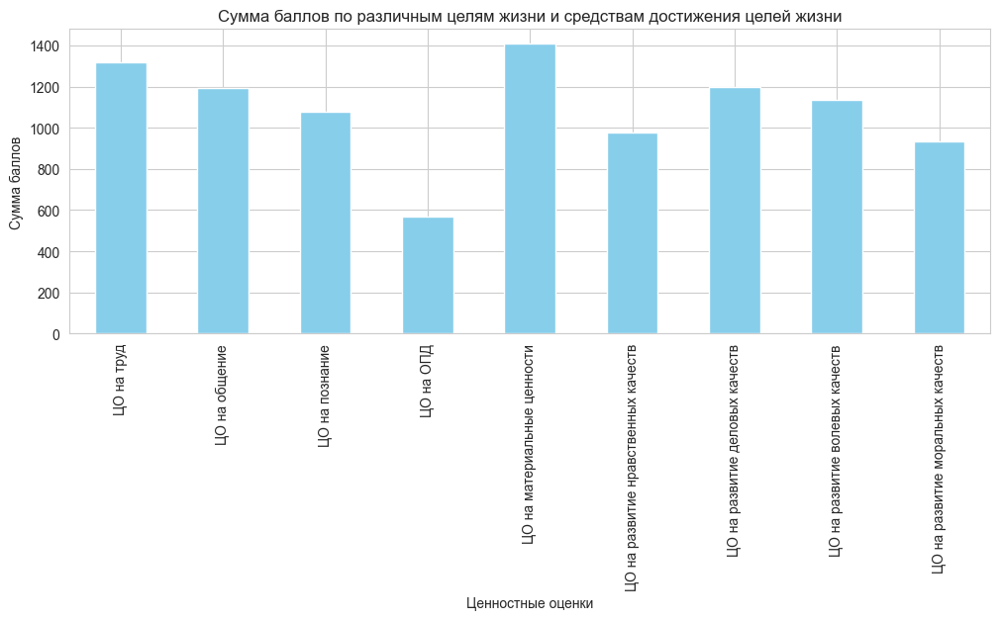

In [70]:
plt.figure(figsize=(12, 4))
values_aggregated.sum().plot(kind='bar', color='skyblue')

# Добавляем подписи осей и заголовок
plt.xlabel('Ценностные оценки')
plt.ylabel('Сумма баллов')
plt.title('Сумма баллов по различным целям жизни и средствам достижения целей жизни')

# Показываем график
plt.show()

In [71]:
values_aggregated.to_excel('values_aggregated.xlsx')

## Ценностные установки в зависимости от пола

In [72]:
data.head()

,ID,Время создания,Ваш пол,Сколько вам лет?,Вы учитесь или работаете?,Ваше имя (по желанию),"1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Совершенно не важно, есть у меня это качество или нет","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Скорее не важно, чем важно","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Не очень важно","1. Быть образованным (иметь широкие и глубокие знания, высокую общую культуру): / Важно в средней степени",...,76. Вам обычно удается накопить нужную сумму денег? / Нет,77. Труд – наибольшая ценность для Вас? / Да,77. Труд – наибольшая ценность для Вас? / Нет,78. Вы уверенно и непринужденно чувствуете себя среди незнакомых людей? / Да,78. Вы уверенно и непринужденно чувствуете себя среди незнакомых людей? / Нет,"79. Вы согласны ущемить свободу, чтобы обладать властью? / Да","79. Вы согласны ущемить свободу, чтобы обладать властью? / Нет",80. Наиболее сильное потрясение для Вас – отсутствие денег? / Да,80. Наиболее сильное потрясение для Вас – отсутствие денег? / Нет,"Спасибо Вам за уделенное Вами время!\n\nДля обратной связи, получения результатов пройденного (по желанию) - укажите свой адрес электронной почты или контактный номер телефона:"
0,1621974239,2024-02-11 13:14:45,Женский,42,Только работаю,Ольга,NaN,NaN,NaN,NaN,...,NaN,NaN,Нет,NaN,Нет,NaN,Нет,Да,NaN,palem@mail.ru
1,1621978480,2024-02-11 13:20:54,Мужской,42,Только работаю,Алексей,NaN,NaN,NaN,NaN,...,NaN,NaN,Нет,NaN,Нет,NaN,Нет,NaN,Нет,NaN
2,1621984885,2024-02-11 13:30:15,Женский,43,Только работаю,Вера,NaN,NaN,NaN,NaN,...,NaN,NaN,Нет,NaN,Нет,NaN,Нет,NaN,Нет,\nvsp.2005@mail.ru
3,1621989786,2024-02-11 13:37:22,Мужской,39,Только работаю,Супер юрист,NaN,NaN,NaN,NaN,...,NaN,NaN,Нет,Да,NaN,NaN,Нет,Да,NaN,NaN
4,1622003252,2024-02-11 13:57:06,Мужской,30,Только работаю,Вадим,NaN,NaN,NaN,NaN,...,NaN,NaN,Нет,NaN,Нет,NaN,Нет,NaN,Нет,NaN


In [73]:
gender_data = data[['Ваш пол']]

Объединим данные по пересечению индексов:

In [74]:
values_gender = pd.merge(gender_data, 
                         values_aggregated,
                         left_index=True,
                         right_index=True,
                         how='inner')  # inner - объединение по пересечению индексов

In [75]:
values_gender.head()

,Ваш пол,ЦО на труд,ЦО на общение,ЦО на познание,ЦО на ОПД,ЦО на материальные ценности,ЦО на развитие нравственных качеств,ЦО на развитие деловых качеств,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств
0,Женский,31,28,28,12,29,27,30,28,23
1,Мужской,33,30,27,17,36,26,30,28,23
2,Женский,31,31,24,15,37,22,27,28,27
3,Мужской,34,35,28,21,39,25,34,29,25
4,Мужской,30,29,26,17,29,27,30,30,27


In [76]:
values_by_gender = values_gender.groupby('Ваш пол').mean().T.reset_index()
#values_by_gender['Разница'] = values_by_gender['Женский'] - values_by_gender['Мужской']
values_by_gender

Ваш пол,index,Женский,Мужской
0,ЦО на труд,33.30,32.65
1,ЦО на общение,30.30,29.45
2,ЦО на познание,26.70,27.20
3,ЦО на ОПД,13.85,14.60
4,ЦО на материальные ценности,35.65,34.80
5,ЦО на развитие нравственных качеств,25.20,23.75
6,ЦО на развитие деловых качеств,29.65,30.20
7,ЦО на развитие волевых качеств,28.45,28.40
8,ЦО на развитие моральных качеств,23.80,22.85


In [77]:
values_by_gender_std = values_gender.groupby('Ваш пол').std().T.reset_index()
#values_by_gender['Разница'] = values_by_gender['Женский'] - values_by_gender['Мужской']
values_by_gender_std

Ваш пол,index,Женский,Мужской
0,ЦО на труд,3.01,3.13
1,ЦО на общение,2.66,3.58
2,ЦО на познание,3.16,2.50
3,ЦО на ОПД,5.04,5.32
4,ЦО на материальные ценности,4.89,4.66
5,ЦО на развитие нравственных качеств,3.19,4.83
6,ЦО на развитие деловых качеств,3.54,4.48
7,ЦО на развитие волевых качеств,2.14,2.28
8,ЦО на развитие моральных качеств,3.32,2.91


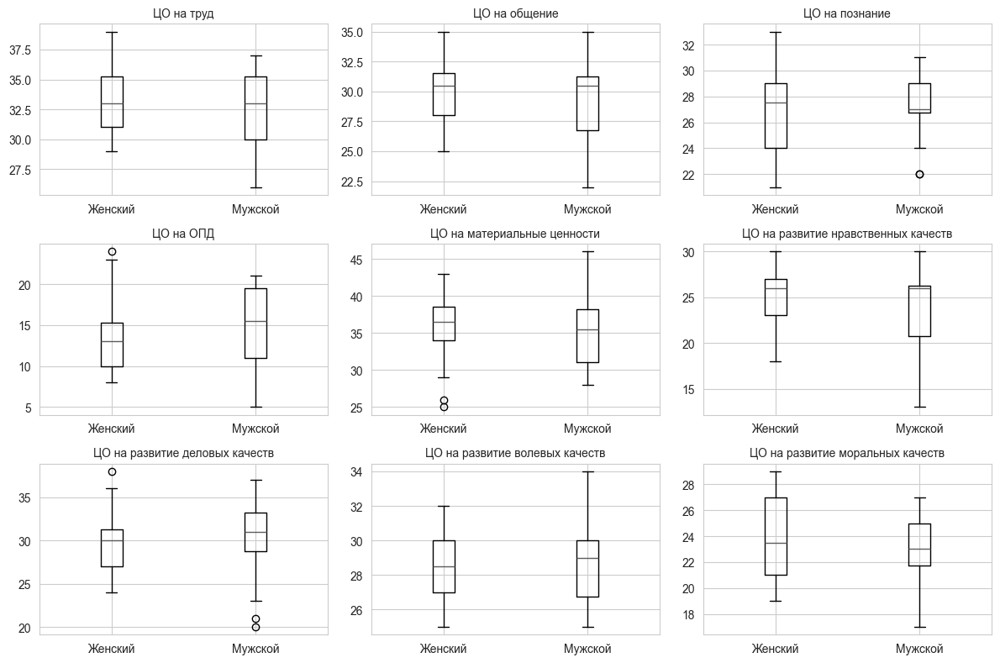

In [78]:
plt.figure(figsize=(12, 8))
for i, column in enumerate(values_gender.columns[1:]):
    plt.subplot(3, 3, i+1)
    plt.boxplot([values_gender[values_gender['Ваш пол'] == 'Женский'][column],
                 values_gender[values_gender['Ваш пол'] == 'Мужской'][column]], labels=['Женский', 'Мужской'])
    plt.title(column, fontsize=10)
plt.tight_layout()
plt.show()

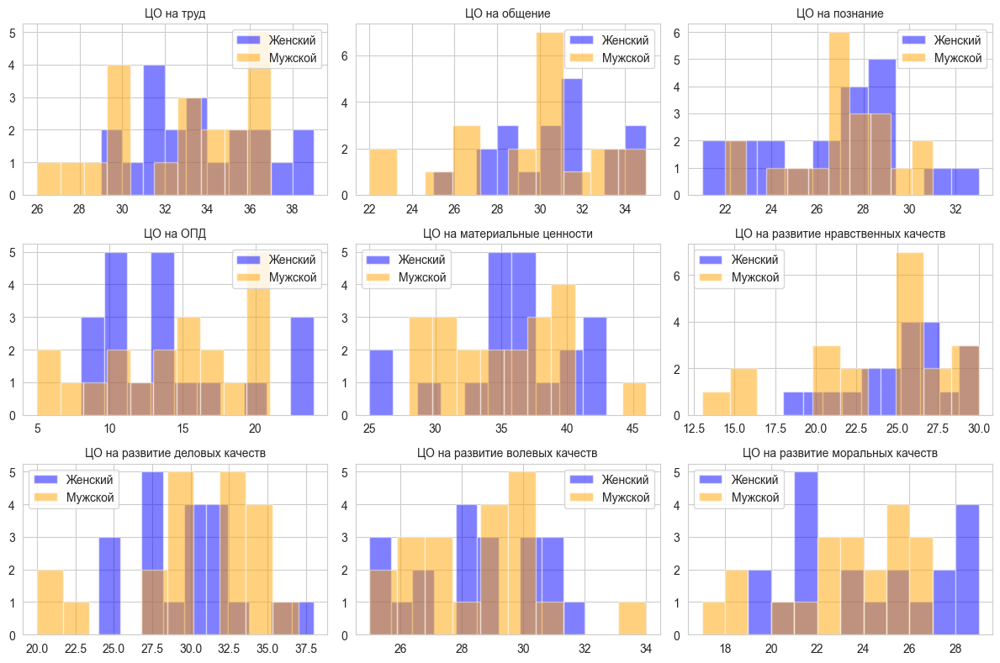

In [79]:
plt.figure(figsize=(12, 8))
for i, column in enumerate(values_gender.columns[1:]):
    plt.subplot(3, 3, i+1)
    plt.hist(values_gender[values_gender['Ваш пол'] == 'Женский'][column], alpha=0.5, label='Женский', color='blue')
    plt.hist(values_gender[values_gender['Ваш пол'] == 'Мужской'][column], alpha=0.5, label='Мужской', color='orange')
    plt.title(column, fontsize=10)
    plt.legend()
plt.tight_layout()
plt.show()

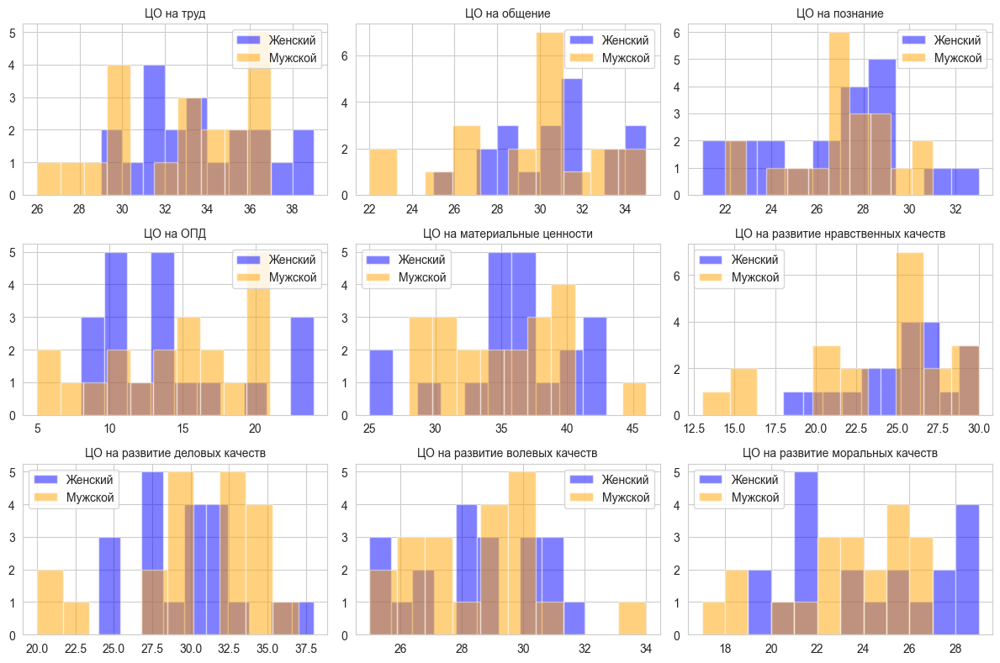

In [80]:
plt.figure(figsize=(12, 8))
for i, column in enumerate(values_gender.columns[1:]):
    plt.subplot(3, 3, i+1)
    plt.hist(values_gender[values_gender['Ваш пол'] == 'Женский'][column], alpha=0.5, label='Женский', color='blue')
    plt.hist(values_gender[values_gender['Ваш пол'] == 'Мужской'][column], alpha=0.5, label='Мужской', color='orange')
    plt.title(column, fontsize=10)
    plt.legend()
plt.tight_layout()
plt.show()

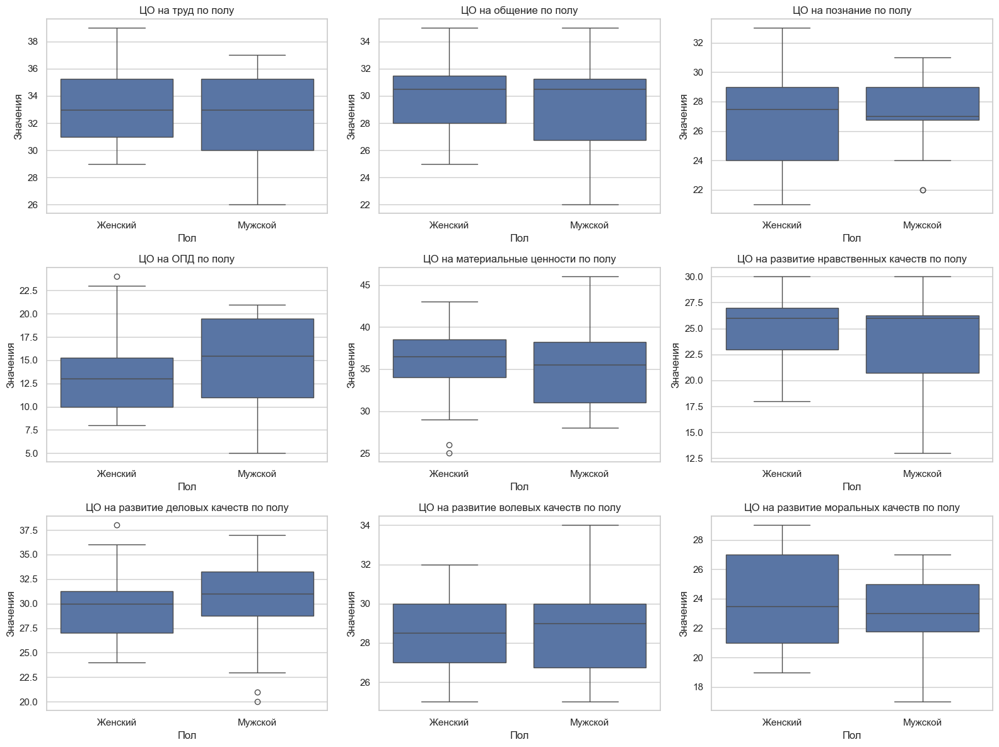

In [81]:
plt.figure(figsize=(16, 12)) # Создание boxplot с subplot

# Установка стиля seaborn
sns.set(style="whitegrid")

# Задаем количество строк и столбцов для subplot
rows = 3
cols = 3

# Создаем subplot
for i, column in enumerate(values_gender.columns[1:], 1):
    plt.subplot(rows, cols, i)
    sns.boxplot(x="Ваш пол", y=column, data=values_gender)
    plt.title(f"{column} по полу")
    plt.xlabel("Пол")
    plt.ylabel("Значения")

plt.tight_layout() # Исправляем перекрытие между графиками
plt.show()

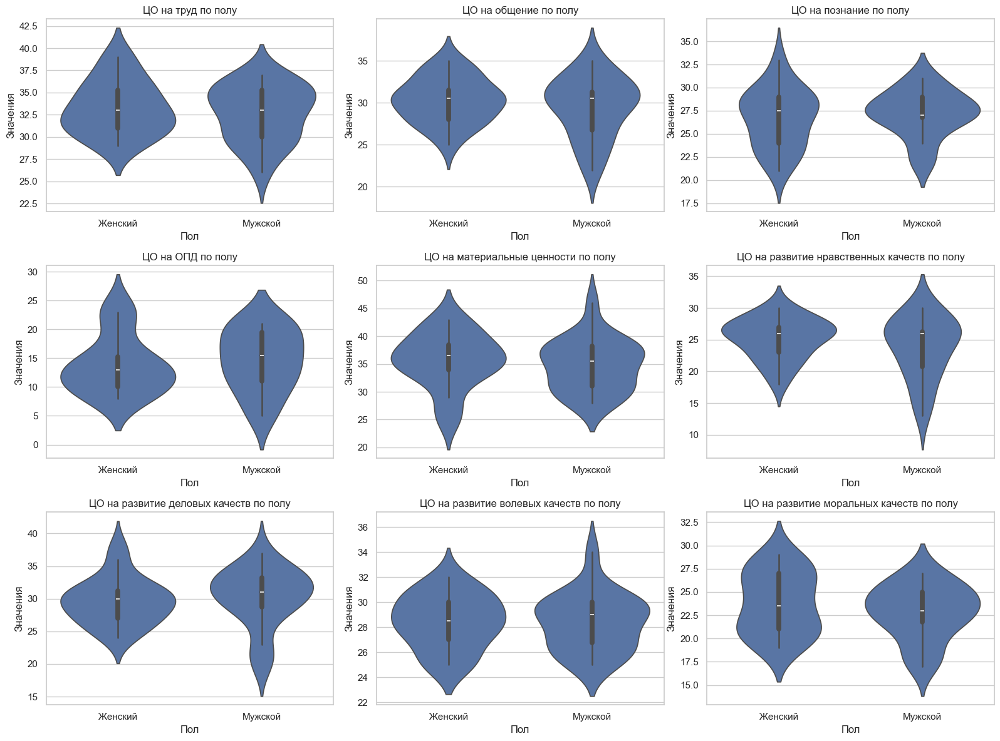

In [82]:
# Создание boxplot с subplot
plt.figure(figsize=(16, 12))

# Установка стиля seaborn
sns.set(style="whitegrid")

# Задаем количество строк и столбцов для subplot
rows = 3
cols = 3

# Создаем subplot
for i, column in enumerate(values_gender.columns[1:], 1):
    plt.subplot(rows, cols, i)
    sns.violinplot(x="Ваш пол", y=column, data=values_gender)
    plt.title(f"{column} по полу")
    plt.xlabel("Пол")
    plt.ylabel("Значения")

# Исправляем перекрытие между графиками
plt.tight_layout()

# Показываем графики
plt.show()

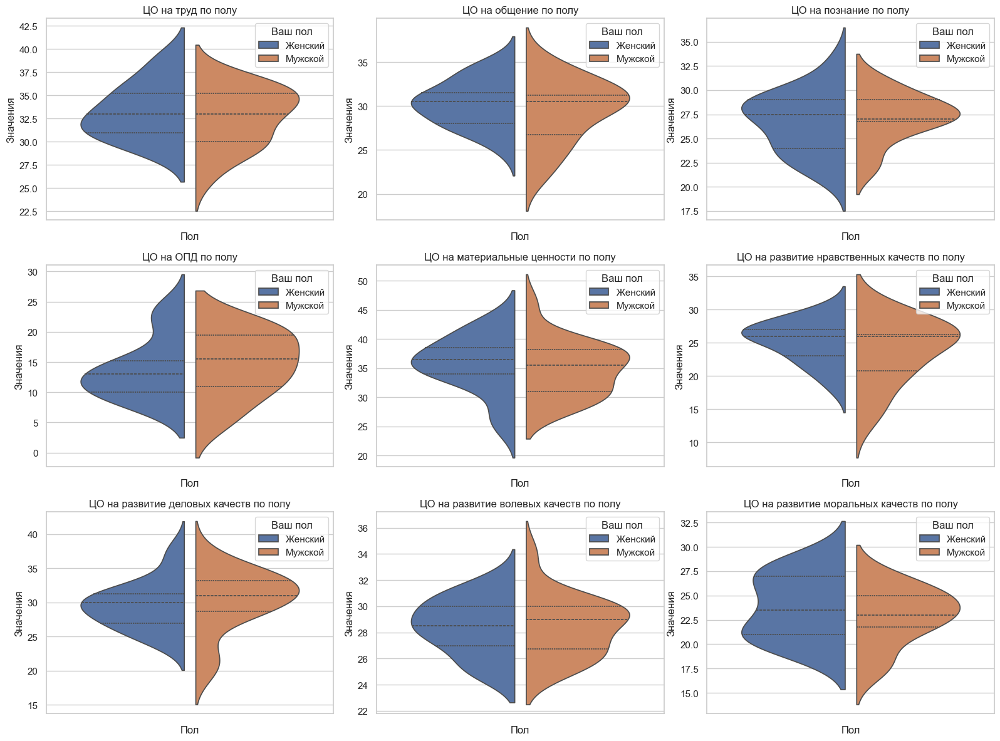

In [83]:
plt.figure(figsize=(16, 12))
sns.set(style="whitegrid")

# Задаем количество строк и столбцов для subplot
rows = 3
cols = 3

# Создаем subplot
for i, column in enumerate(values_gender.columns[1:], 1):
    plt.subplot(rows, cols, i)
    sns.violinplot(hue="Ваш пол", y=column, 
                   data=values_gender,
                  split=True, gap=.1, inner="quart"
                  
                  )
    plt.title(f"{column} по полу")
    plt.xlabel("Пол")
    plt.ylabel("Значения")

plt.tight_layout() # перекрытие между графиками
plt.show()

## Тестирование гипотезы

**H0 (нулевая гипотеза)**: средние значения равны между мужчинами и женщинами, нет отличий между группами внутри выборки по исследованию как целей жизни, так и средств достижения целей жизни.

**HA (альтернативная гипотеза)**: есть статистически значимые отличия, цели жизни и средства по достижения целей жизни внутри групп по признаку пола различается.

Разделим выборку опроса ценностных ориентаций по признаку пола на мужскую и женскую:

In [84]:
values_female = values_gender[values_gender['Ваш пол'] == 'Женский'].drop(columns=['Ваш пол'])
values_male = values_gender[values_gender['Ваш пол'] == 'Мужской'].drop(columns=['Ваш пол'])

Применяем критерий Манна-Уитни:

In [85]:
values_results_list = []

# Проходим по каждому столбцу данных
for column in values_female.columns:
    # Вычисляем p-value для текущего столбца
    
    statistic, p_value = mannwhitneyu(values_female[column], 
                                      values_male[column])
    # Добавляем результаты в список
    values_results_list.append({'Ценностные ориентации': column, 
                         'p-value': p_value,
                       'U-статистика': statistic}
                       )

# Преобразуем список в DataFrame
values_hypothesis = pd.DataFrame(values_results_list)

# Выводим DataFrame с результатами
values_hypothesis

,Ценностные ориентации,p-value,U-статистика
0,ЦО на труд,0.69,215.00
1,ЦО на общение,0.62,218.50
2,ЦО на познание,0.68,184.50
3,ЦО на ОПД,0.50,174.50
4,ЦО на материальные ценности,0.48,226.50
5,ЦО на развитие нравственных качеств,0.38,232.50
6,ЦО на развитие деловых качеств,0.28,159.50
7,ЦО на развитие волевых качеств,0.85,207.50
8,ЦО на развитие моральных качеств,0.45,228.50


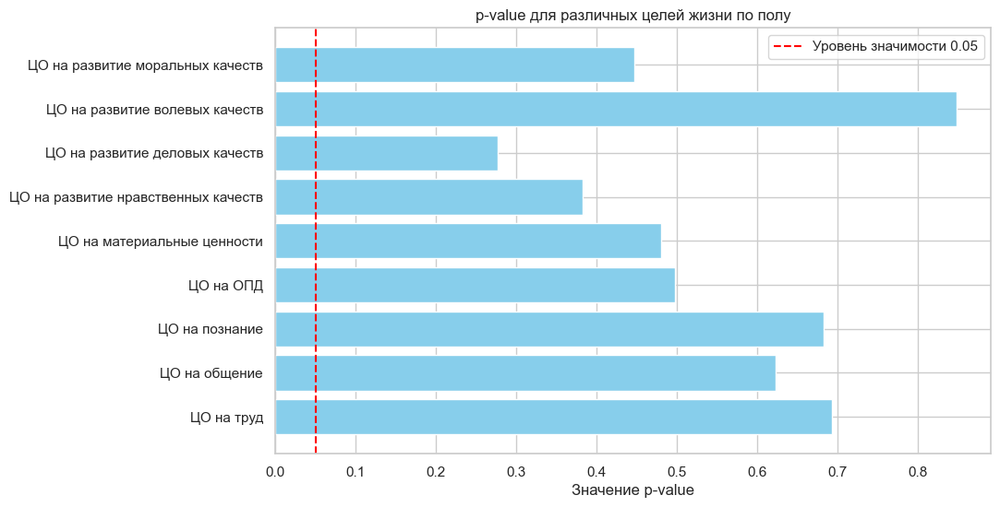

In [86]:
p_values = values_hypothesis['p-value']
variables = values_hypothesis['Ценностные ориентации']

plt.figure(figsize=(10,6))
plt.barh(variables, p_values, color='skyblue')
plt.xlabel('Значение p-value')
plt.title('p-value для различных целей жизни по полу')
plt.axvline(x=0.05, color='red', linestyle='--', label='Уровень значимости 0.05')
plt.legend()
plt.show()

# Определение мотивационных установок

## Обработка данных

In [87]:
motivation_data.head()

,"1. Сам процесс выполняемой работы увлекает Вас больше, чем этап ее завершения? / Да","1. Сам процесс выполняемой работы увлекает Вас больше, чем этап ее завершения? / Нет",2. Для достижения цели Вы обычно не жалеете сил? / Да,2. Для достижения цели Вы обычно не жалеете сил? / Нет,"3. Вам часто говорят, что Вы больше думаете о других, чем о себе? / Да","3. Вам часто говорят, что Вы больше думаете о других, чем о себе? / Нет",4. Вы обычно много времени уделяете своей особе? / Да,4. Вы обычно много времени уделяете своей особе? / Нет,"5. Вы обычно долго не решаетесь начать делать то, что Вам неинтересно, даже если это необходимо? / Да","5. Вы обычно долго не решаетесь начать делать то, что Вам неинтересно, даже если это необходимо? / Нет",...,76. Вам обычно удается накопить нужную сумму денег? / Да,76. Вам обычно удается накопить нужную сумму денег? / Нет,77. Труд – наибольшая ценность для Вас? / Да,77. Труд – наибольшая ценность для Вас? / Нет,78. Вы уверенно и непринужденно чувствуете себя среди незнакомых людей? / Да,78. Вы уверенно и непринужденно чувствуете себя среди незнакомых людей? / Нет,"79. Вы согласны ущемить свободу, чтобы обладать властью? / Да","79. Вы согласны ущемить свободу, чтобы обладать властью? / Нет",80. Наиболее сильное потрясение для Вас – отсутствие денег? / Да,80. Наиболее сильное потрясение для Вас – отсутствие денег? / Нет
0,NaN,Нет,Да,NaN,Да,NaN,NaN,Нет,Да,NaN,...,Да,NaN,NaN,Нет,NaN,Нет,NaN,Нет,Да,NaN
1,NaN,Нет,NaN,Нет,NaN,Нет,NaN,Нет,Да,NaN,...,Да,NaN,NaN,Нет,NaN,Нет,NaN,Нет,NaN,Нет
2,NaN,Нет,Да,NaN,Да,NaN,NaN,Нет,Да,NaN,...,Да,NaN,NaN,Нет,NaN,Нет,NaN,Нет,NaN,Нет
3,Да,NaN,Да,NaN,Да,NaN,NaN,Нет,Да,NaN,...,Да,NaN,NaN,Нет,Да,NaN,NaN,Нет,Да,NaN
4,NaN,Нет,Да,NaN,NaN,Нет,NaN,Нет,Да,NaN,...,Да,NaN,NaN,Нет,NaN,Нет,NaN,Нет,NaN,Нет


В опросе 80 вопросов с двумя вариантами ответа:

In [88]:
for i in range(0, 80 * 2, 2):
    block_columns = motivation_data.iloc[:, i:i+2]  #  блок из 2 столбцов
    
    for column in block_columns.columns:
        #match = re.match(r'([^/]+)/', column) # регулярное выражение, чтобы оставить только вопрос
                                              # убрали весь текст после символа : /
            
        match = re.sub(r'/.*', '', column)
        
        if match:
            new_column_name = match  # Имя нового столбца
            #leevik[f'{new_column_name}_{i//7 + 1}'] = block_columns[column]  # Создание
            
            motivation_data[f'{new_column_name}'] = block_columns.apply(
                lambda row:next((val for val in row if not pd.isna(val)), 
                                np.nan),
                axis=1)

In [89]:
motivation_raw_data = motivation_data.iloc[:, -80:]
motivation_raw_data.head()

,"1. Сам процесс выполняемой работы увлекает Вас больше, чем этап ее завершения?",2. Для достижения цели Вы обычно не жалеете сил?,"3. Вам часто говорят, что Вы больше думаете о других, чем о себе?",4. Вы обычно много времени уделяете своей особе?,"5. Вы обычно долго не решаетесь начать делать то, что Вам неинтересно, даже если это необходимо?","6. Вы уверены, что настойчивости в Вас больше, чем способностей?","7. Вам легче просить за других, чем за себя?","8. Вы считаете, что человек сначала должен думать о себе, а потом уже о других?","9. Заканчивая интересное дело, Вы часто сожалеете о том, что интересная работа уже завершена, а с ней жаль расставаться?","10. Вам больше нравятся деятельные люди, способные достигать результата, чем просто добрые и отзывчивые?",...,71. Вы чувствуете себя хозяином в своей семье?,72. Вам трудно ограничить себя в денежных средствах?,73. Ваши друзья и знакомые ценят Вас как специалиста?,"74. Люди, ущемляющие Вашу свободу, вызывают у Вас наибольшее негодование?",75. Власть может заменить Вам многие другие ценности?,76. Вам обычно удается накопить нужную сумму денег?,77. Труд – наибольшая ценность для Вас?,78. Вы уверенно и непринужденно чувствуете себя среди незнакомых людей?,"79. Вы согласны ущемить свободу, чтобы обладать властью?",80. Наиболее сильное потрясение для Вас – отсутствие денег?
0,Нет,Да,Да,Нет,Да,Да,Да,Нет,Нет,Нет,...,Нет,Да,Да,Да,Нет,Да,Нет,Нет,Нет,Да
1,Нет,Нет,Нет,Нет,Да,Нет,Да,Нет,Нет,Нет,...,Да,Нет,Да,Да,Нет,Да,Нет,Нет,Нет,Нет
2,Нет,Да,Да,Нет,Да,Нет,Да,Да,Да,Да,...,Да,Нет,Да,Да,Нет,Да,Нет,Нет,Нет,Нет
3,Да,Да,Да,Нет,Да,Да,Да,Да,Нет,Да,...,Да,Нет,Да,Да,Нет,Да,Нет,Да,Нет,Да
4,Нет,Да,Нет,Нет,Да,Нет,Да,Да,Нет,Нет,...,Нет,Да,Нет,Да,Нет,Да,Нет,Нет,Нет,Нет


### Экспорт

In [90]:
motivation_raw_data.to_excel('motivation_preprocessed_answers.xlsx')

## Кодирование вариантов ответа

In [91]:
motivation_keys = {
    "Да": 1,
    "Нет": 0   
}

In [92]:
motivation_raw_data.replace(motivation_keys, inplace=True)

In [93]:
motivation_raw_data.head()

,"1. Сам процесс выполняемой работы увлекает Вас больше, чем этап ее завершения?",2. Для достижения цели Вы обычно не жалеете сил?,"3. Вам часто говорят, что Вы больше думаете о других, чем о себе?",4. Вы обычно много времени уделяете своей особе?,"5. Вы обычно долго не решаетесь начать делать то, что Вам неинтересно, даже если это необходимо?","6. Вы уверены, что настойчивости в Вас больше, чем способностей?","7. Вам легче просить за других, чем за себя?","8. Вы считаете, что человек сначала должен думать о себе, а потом уже о других?","9. Заканчивая интересное дело, Вы часто сожалеете о том, что интересная работа уже завершена, а с ней жаль расставаться?","10. Вам больше нравятся деятельные люди, способные достигать результата, чем просто добрые и отзывчивые?",...,71. Вы чувствуете себя хозяином в своей семье?,72. Вам трудно ограничить себя в денежных средствах?,73. Ваши друзья и знакомые ценят Вас как специалиста?,"74. Люди, ущемляющие Вашу свободу, вызывают у Вас наибольшее негодование?",75. Власть может заменить Вам многие другие ценности?,76. Вам обычно удается накопить нужную сумму денег?,77. Труд – наибольшая ценность для Вас?,78. Вы уверенно и непринужденно чувствуете себя среди незнакомых людей?,"79. Вы согласны ущемить свободу, чтобы обладать властью?",80. Наиболее сильное потрясение для Вас – отсутствие денег?
0,0,1,1,0,1,1,1,0,0,0,...,0,1,1,1,0,1,0,0,0,1
1,0,0,0,0,1,0,1,0,0,0,...,1,0,1,1,0,1,0,0,0,0
2,0,1,1,0,1,0,1,1,1,1,...,1,0,1,1,0,1,0,0,0,0
3,1,1,1,0,1,1,1,1,0,1,...,1,0,1,1,0,1,0,1,0,1
4,0,1,0,0,1,0,1,1,0,0,...,0,1,0,1,0,1,0,0,0,0


### Экспорт

In [94]:
motivation_raw_data.to_excel('motivation_preprocessed_keys.xlsx')

## Ключ диагностики

**НЕ ДЕЛАЕМ НИЖЕ:**

Для облечгчения процесса применения ключа расширофки и диагностики оставим в названиях столбцов только номер вопроса:

In [95]:
#new_column_names = {old_column: old_column.split('.')[0] for old_column in motivation_raw_data.columns}
#motivation_raw_data = motivation_raw_data.rename(columns=new_column_names)
#motivation_raw_data.head()

Создаем словарь для ключа расшифровки:

In [96]:
orientation_indices = {
    'ориентация на процесс': [1, 5, 9, 13, 17, 21, 25, 29, 33, 37],
    'ориентация на результат': [2, 6, 10, 14, 18, 22, 26, 30, 34, 38],
    'ориентация на альтруизм': [3, 7, 11, 15, 19, 23, 27, 31, 35, 39],
    'ориентация на эгоизм': [4, 8, 12, 16, 20, 24, 28, 32, 36, 40],
    'ориентация на труд': [41, 45, 49, 53, 57, 61, 65, 69, 73, 77],
    'ориентация на свободу': [42, 46, 50, 54, 58, 62, 66, 70, 74, 78],
    'ориентация на власть': [43, 47, 51, 55, 59, 63, 67, 71, 75, 79],
    'ориентация на деньги': [44, 48, 52, 56, 60, 64, 68, 72, 76, 80]
}

Суммируем баллы по каждой ориентации для каждого респондента:

In [97]:
#for orientation, indices in orientation_indices.items():
   # motivation_raw_data[orientation] = motivation_raw_data.iloc[:, indices].sum(axis=1)

In [98]:
motivation_raw_data.head()

,"1. Сам процесс выполняемой работы увлекает Вас больше, чем этап ее завершения?",2. Для достижения цели Вы обычно не жалеете сил?,"3. Вам часто говорят, что Вы больше думаете о других, чем о себе?",4. Вы обычно много времени уделяете своей особе?,"5. Вы обычно долго не решаетесь начать делать то, что Вам неинтересно, даже если это необходимо?","6. Вы уверены, что настойчивости в Вас больше, чем способностей?","7. Вам легче просить за других, чем за себя?","8. Вы считаете, что человек сначала должен думать о себе, а потом уже о других?","9. Заканчивая интересное дело, Вы часто сожалеете о том, что интересная работа уже завершена, а с ней жаль расставаться?","10. Вам больше нравятся деятельные люди, способные достигать результата, чем просто добрые и отзывчивые?",...,71. Вы чувствуете себя хозяином в своей семье?,72. Вам трудно ограничить себя в денежных средствах?,73. Ваши друзья и знакомые ценят Вас как специалиста?,"74. Люди, ущемляющие Вашу свободу, вызывают у Вас наибольшее негодование?",75. Власть может заменить Вам многие другие ценности?,76. Вам обычно удается накопить нужную сумму денег?,77. Труд – наибольшая ценность для Вас?,78. Вы уверенно и непринужденно чувствуете себя среди незнакомых людей?,"79. Вы согласны ущемить свободу, чтобы обладать властью?",80. Наиболее сильное потрясение для Вас – отсутствие денег?
0,0,1,1,0,1,1,1,0,0,0,...,0,1,1,1,0,1,0,0,0,1
1,0,0,0,0,1,0,1,0,0,0,...,1,0,1,1,0,1,0,0,0,0
2,0,1,1,0,1,0,1,1,1,1,...,1,0,1,1,0,1,0,0,0,0
3,1,1,1,0,1,1,1,1,0,1,...,1,0,1,1,0,1,0,1,0,1
4,0,1,0,0,1,0,1,1,0,0,...,0,1,0,1,0,1,0,0,0,0


In [99]:
motivation_raw_data.columns

Index(['1. Сам процесс выполняемой работы увлекает Вас больше, чем этап ее завершения? ',
       '2. Для достижения цели Вы обычно не жалеете сил? ',
       '3. Вам часто говорят, что Вы больше думаете о других, чем о себе? ',
       '4. Вы обычно много времени уделяете своей особе? ',
       '5. Вы обычно долго не решаетесь начать делать то, что Вам неинтересно, даже если это необходимо? ',
       '6. Вы уверены, что настойчивости в Вас больше, чем способностей? ',
       '7. Вам легче просить за других, чем за себя? ',
       '8. Вы считаете, что человек сначала должен думать о себе, а потом уже о других? ',
       '9. Заканчивая интересное дело, Вы часто сожалеете о том, что интересная работа  уже завершена, а с ней жаль расставаться? ',
       '10. Вам больше нравятся деятельные люди, способные достигать результата, чем  просто добрые и отзывчивые? ',
       '11. Вам трудно отказать людям, когда они Вас о чем-либо просят? ',
       '12. Для себя Вы делаете что-либо с большим удовол

In [100]:
new_column_names = {old_column: old_column.split('.')[0] for old_column in motivation_raw_data.columns}
motivation_raw_data = motivation_raw_data.rename(columns=new_column_names)
motivation_raw_data.head()

,1,2,3,4,5,6,7,8,9,10,...,71,72,73,74,75,76,77,78,79,80
0,0,1,1,0,1,1,1,0,0,0,...,0,1,1,1,0,1,0,0,0,1
1,0,0,0,0,1,0,1,0,0,0,...,1,0,1,1,0,1,0,0,0,0
2,0,1,1,0,1,0,1,1,1,1,...,1,0,1,1,0,1,0,0,0,0
3,1,1,1,0,1,1,1,1,0,1,...,1,0,1,1,0,1,0,1,0,1
4,0,1,0,0,1,0,1,1,0,0,...,0,1,0,1,0,1,0,0,0,0


In [101]:
motivation_raw_data[['1', '5', '9', '13', '17', '21', '25', '29', '33', '37']]

,1,5,9,13,17,21,25,29,33,37
0,0,1,0,1,1,1,1,1,1,1
1,0,1,0,1,1,1,1,0,0,1
2,0,1,1,1,1,0,1,0,0,1
3,1,1,0,1,1,1,1,1,0,1
4,0,1,0,1,1,0,1,0,0,1
5,0,0,1,0,0,0,0,0,0,0
6,0,1,0,1,1,0,0,1,0,1
7,0,1,0,1,0,0,0,0,0,1
8,0,1,0,1,0,1,1,1,0,1
9,0,1,0,1,1,1,0,0,0,0


In [102]:
motivation_raw_data[['1', '5', '9', '13', '17', '21', '25', '29', '33', '37']].sum(axis=1)

0      8
1      6
2      6
3      8
4      5
5      1
6      5
7      3
8      6
9      4
10     6
11     5
12     8
13     4
14     5
15     6
16     3
17     7
18    10
19     6
20     7
21     6
22     9
23     8
24     4
25     8
26     5
27     7
28    10
29     3
30     5
31     4
32     8
33     9
34     8
35     6
36     3
37     6
38     5
39     7
dtype: int64

РАБОТАЕТ ТАК:

In [103]:
# Часть I. Выявление установок «альтруизм – эгоизм», «процесс – результат»:
motivation_raw_data['ориентация на процесс'] = motivation_raw_data[
    ['1', '5', '9', '13', '17', '21', '25', '29', '33', '37']].sum(axis=1)
motivation_raw_data['ориентация на результат'] = motivation_raw_data[
    ['2', '6', '10', '14', '18', '22', '26', '30', '34', '38']].sum(axis=1)
motivation_raw_data['ориентация на альтруизм'] = motivation_raw_data[
    ['3', '7', '11', '15', '19', '23', '27', '31', '35', '39']].sum(axis=1)
motivation_raw_data['ориентация на эгоизм'] = motivation_raw_data[
    ['4', '8', '12', '16', '20', '24', '28', '32', '36', '40']].sum(axis=1)

# Часть II. Выявление установок «свобода – власть», «труд – деньги»:
motivation_raw_data['ориентация на труд'] = motivation_raw_data[
    ['41', '45', '49', '53', '57', '61', '65', '69', '73', '77']].sum(axis=1)
motivation_raw_data['ориентация на свободу'] = motivation_raw_data[
    ['42', '46', '50', '54', '58', '62', '66', '70', '74', '78']].sum(axis=1)
motivation_raw_data['ориентация на власть'] = motivation_raw_data[
    ['43', '47', '51', '55', '59', '63', '67', '71', '75', '79']].sum(axis=1)
motivation_raw_data['ориентация на деньги'] = motivation_raw_data[
    ['44', '48', '52', '56', '60', '64', '68', '72', '76', '80']].sum(axis=1)

In [104]:
# Часть II. Выявление установок «свобода – власть», «труд – деньги»:
motivation_raw_data['ориентация на труд'] = motivation_raw_data[
    ['41', '45', '49', '53', '57', '61', '65', '69', '73', '77']].sum(axis=1)
motivation_raw_data['ориентация на свободу'] = motivation_raw_data[
    ['42', '46', '50', '54', '58', '62', '66', '70', '74', '78']].sum(axis=1)
motivation_raw_data['ориентация на власть'] = motivation_raw_data[
    ['43', '47', '51', '55', '59', '63', '67', '71', '75', '79']].sum(axis=1)
motivation_raw_data['ориентация на деньги'] = motivation_raw_data[
    ['44', '48', '52', '56', '60', '64', '68', '72', '76', '80']].sum(axis=1)

In [105]:
motivation_raw_data

,1,2,3,4,5,6,7,8,9,10,...,79,80,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,0,1,1,0,1,1,1,0,0,0,...,0,1,8,6,8,2,3,7,1,5
1,0,0,0,0,1,0,1,0,0,0,...,0,0,6,6,8,1,5,7,3,1
2,0,1,1,0,1,0,1,1,1,1,...,0,0,6,5,7,6,3,4,2,4
3,1,1,1,0,1,1,1,1,0,1,...,0,1,8,8,3,4,4,5,5,7
4,0,1,0,0,1,0,1,1,0,0,...,0,0,5,7,4,3,3,9,0,3
5,0,0,0,1,0,0,0,1,1,1,...,0,0,1,5,1,7,4,7,0,6
6,0,1,1,1,1,0,0,0,0,1,...,0,1,5,7,3,1,2,7,7,4
7,0,1,1,0,1,0,1,1,0,0,...,0,0,3,3,8,1,3,8,2,3
8,0,0,0,0,1,1,0,1,0,0,...,0,1,6,3,1,4,3,7,5,4
9,0,1,0,0,1,0,1,1,0,1,...,0,1,4,7,5,3,6,9,1,4


Для каждого распондента получили определение мотивационной установки согласно ключу:

In [106]:
motivation_aggregated = motivation_raw_data.iloc[:, -8:]
motivation_aggregated.head()

,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,8,6,8,2,3,7,1,5
1,6,6,8,1,5,7,3,1
2,6,5,7,6,3,4,2,4
3,8,8,3,4,4,5,5,7
4,5,7,4,3,3,9,0,3


### Экспорт

In [107]:
motivation_aggregated.to_excel('motivation_aggregated.xlsx')

## Мотивационные установки в зависимости от пола

In [108]:
gender_data = data[['Ваш пол']]

In [109]:
motivation_gender = pd.merge(
                        gender_data, 
                        motivation_aggregated, 
                     left_index=True, 
                     right_index=True, 
                     how='inner')  # inner - объединение по пересечению индексов

In [110]:
motivation_gender.head()

,Ваш пол,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,Женский,8,6,8,2,3,7,1,5
1,Мужской,6,6,8,1,5,7,3,1
2,Женский,6,5,7,6,3,4,2,4
3,Мужской,8,8,3,4,4,5,5,7
4,Мужской,5,7,4,3,3,9,0,3


In [111]:
motivation_by_gender = motivation_gender.groupby('Ваш пол').mean().T
motivation_by_gender = motivation_by_gender.reset_index().rename(columns={'index': 'Мотивация'})

motivation_by_gender

Ваш пол,Мотивация,Женский,Мужской
0,ориентация на процесс,5.50,6.50
1,ориентация на результат,6.00,6.20
2,ориентация на альтруизм,6.05,4.25
3,ориентация на эгоизм,3.75,4.05
4,ориентация на труд,4.60,4.10
5,ориентация на свободу,7.05,6.50
6,ориентация на власть,2.30,3.40
7,ориентация на деньги,3.75,3.45


In [112]:
motivation_by_gender_std = motivation_gender.groupby('Ваш пол').std().T
motivation_by_gender_std = motivation_by_gender_std.reset_index().rename(columns={'index': 'Мотивация'})

motivation_by_gender_std

Ваш пол,Мотивация,Женский,Мужской
0,ориентация на процесс,2.06,1.99
1,ориентация на результат,1.95,2.04
2,ориентация на альтруизм,2.21,2.31
3,ориентация на эгоизм,1.97,2.63
4,ориентация на труд,2.01,1.77
5,ориентация на свободу,2.01,2.14
6,ориентация на власть,1.53,2.14
7,ориентация на деньги,1.89,1.70


## Тестирование гипотезы

**H0 (нулевая гипотеза)**: средние значения по мотивационным установкам равны между мужчинами и женщинами, нет отличий между группами внутри выборки по признаку пола

**HA (альтернативная гипотеза)**: есть статистически значимые отличия, мотивационные ориентации внутри групп по признаку пола различается.


Разделим данные по полу:

In [113]:
values_female = motivation_gender[motivation_gender['Ваш пол'] == 'Женский'].drop(columns=['Ваш пол'])
values_male = motivation_gender[motivation_gender['Ваш пол'] == 'Мужской'].drop(columns=['Ваш пол'])

In [114]:
# Результаты критерия Манна-Уитни
p_values = {}
statistics = {}

# Применяем критерий Манна-Уитни
for column in values_female.columns:
    statistic, p_value = mannwhitneyu(values_female[column], values_male[column])
    p_values[column] = p_value
    statistics[column] = statistic

motivation_gender_hypothesis = pd.DataFrame({'U-statistic': statistics, 'p-value': p_values}).reset_index()
motivation_gender_hypothesis

,index,U-statistic,p-value
0,ориентация на процесс,152.00,0.19
1,ориентация на результат,180.50,0.60
2,ориентация на альтруизм,290.00,0.01
3,ориентация на эгоизм,190.50,0.80
4,ориентация на труд,230.50,0.41
5,ориентация на свободу,231.50,0.40
6,ориентация на власть,143.00,0.12
7,ориентация на деньги,222.50,0.55


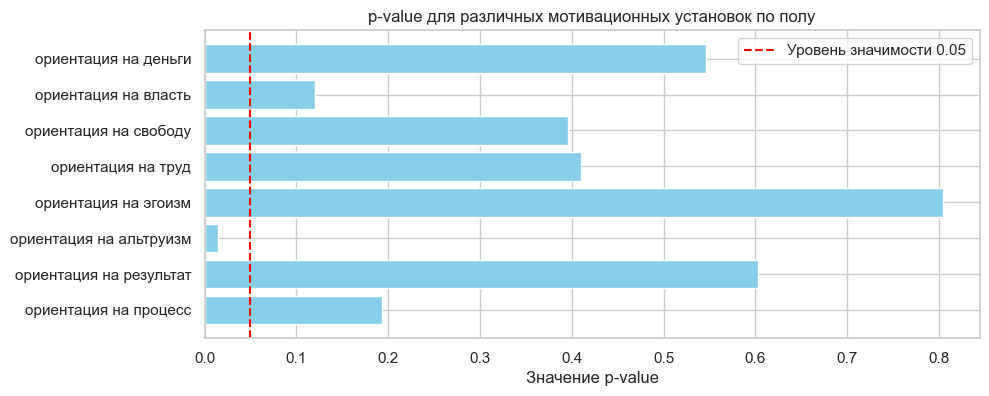

In [115]:
p_values = motivation_gender_hypothesis['p-value']
variables = motivation_gender_hypothesis['index']

plt.figure(figsize=(10,4))
plt.barh(variables, p_values, color='skyblue')
plt.xlabel('Значение p-value')
plt.title('p-value для различных мотивационных установок по полу')
plt.axvline(x=0.05, color='red', linestyle='--', label='Уровень значимости 0.05')
plt.legend()
plt.show()

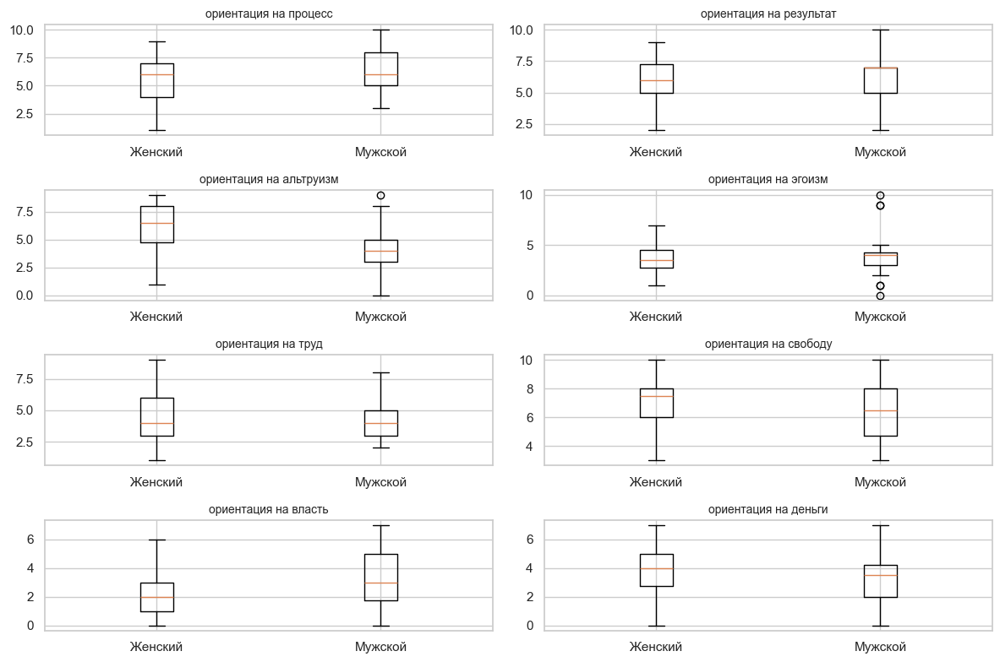

In [116]:
plt.figure(figsize=(12, 8))
for i, column in enumerate(motivation_gender.columns[1:]):
    plt.subplot(4, 2, i+1)
    plt.boxplot([motivation_gender[motivation_gender['Ваш пол'] == 'Женский'][column],
                 motivation_gender[motivation_gender['Ваш пол'] == 'Мужской'][column]], labels=['Женский', 'Мужской'])
    plt.title(column, fontsize=10)
plt.tight_layout()
plt.show()

In [117]:
motivation_gender

,Ваш пол,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,Женский,8,6,8,2,3,7,1,5
1,Мужской,6,6,8,1,5,7,3,1
2,Женский,6,5,7,6,3,4,2,4
3,Мужской,8,8,3,4,4,5,5,7
4,Мужской,5,7,4,3,3,9,0,3
5,Женский,1,5,1,7,4,7,0,6
6,Мужской,5,7,3,1,2,7,7,4
7,Женский,3,3,8,1,3,8,2,3
8,Мужской,6,3,1,4,3,7,5,4
9,Женский,4,7,5,3,6,9,1,4


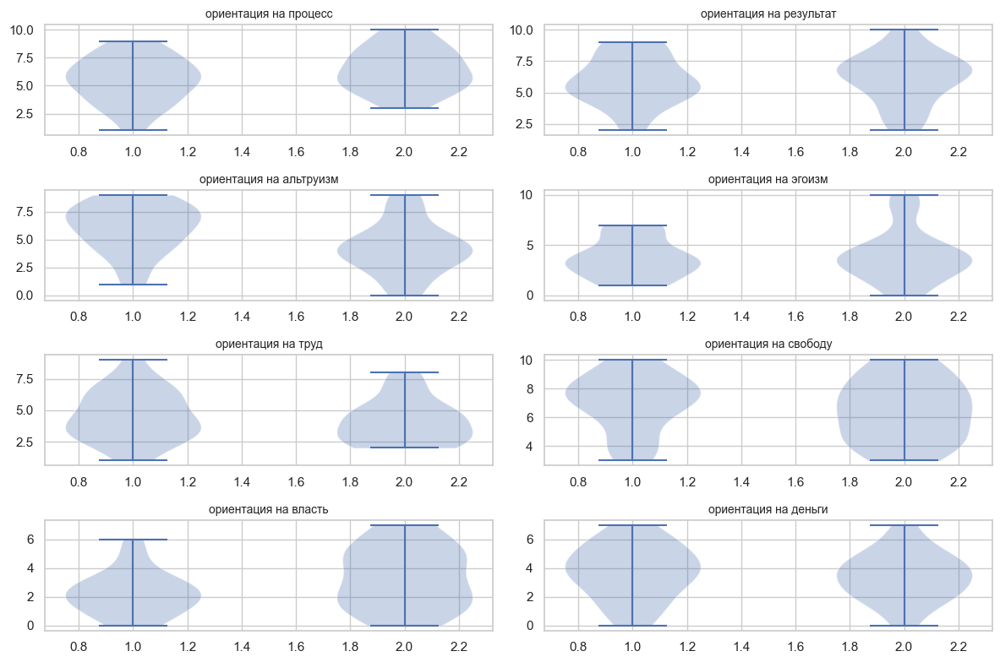

In [118]:
plt.figure(figsize=(12, 8))
for i, column in enumerate(motivation_gender.columns[1:]):
    plt.subplot(4, 2, i+1)
    plt.violinplot([motivation_gender[motivation_gender['Ваш пол'] == 'Женский'][column],
                 motivation_gender[motivation_gender['Ваш пол'] == 'Мужской'][column]], 
                   #labels=['Женский', 'Мужской']
                  )
    plt.title(column, fontsize=10)
plt.tight_layout()
plt.show()

In [119]:
motivation_gender.head()

,Ваш пол,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,Женский,8,6,8,2,3,7,1,5
1,Мужской,6,6,8,1,5,7,3,1
2,Женский,6,5,7,6,3,4,2,4
3,Мужской,8,8,3,4,4,5,5,7
4,Мужской,5,7,4,3,3,9,0,3


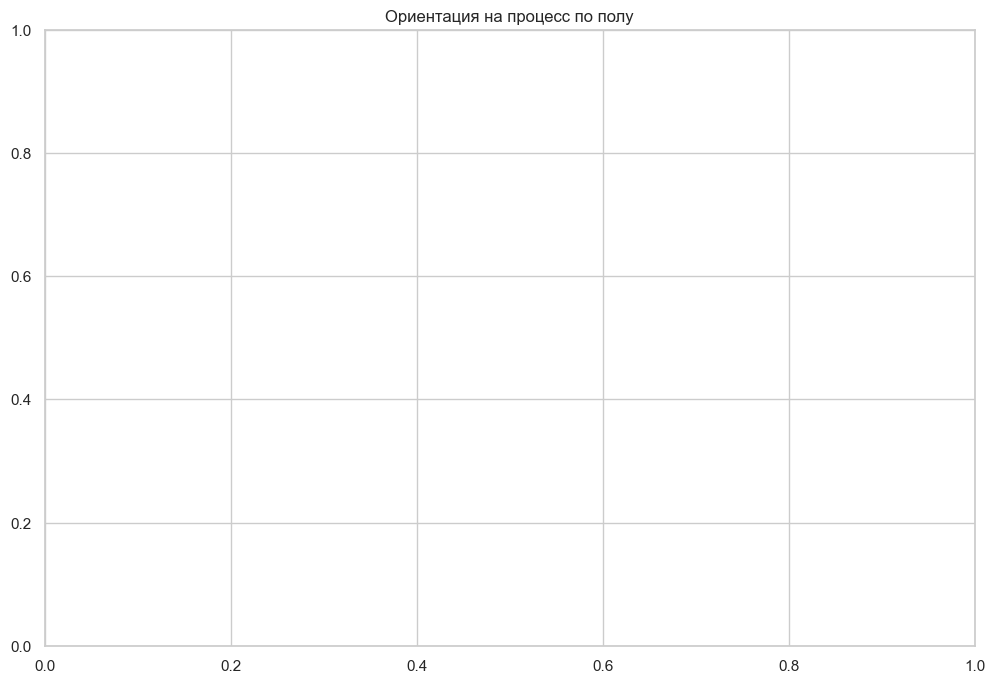

In [120]:
# Визуализация с помощью ящиков с усами
plt.figure(figsize=(12, 8))
sns.boxplot()
plt.title('Ориентация на процесс по полу')
plt.show()

Таким образом, можем сделать вывод, что существует статистически значимое различие между работающими мужчинами и женщинами.

# Диагностика копинг-стратегий

## Обработка данных

В опросе мотивационных установок 50 вопросов с 4-мя вариантами ответа.

In [121]:
coping_data.head()

,"1. Оказавшись в трудной жизненной ситуации, я сосредотачивался на том, что мне нужно было делать дальше - на следующем шаге: / Никогда","1. Оказавшись в трудной жизненной ситуации, я сосредотачивался на том, что мне нужно было делать дальше - на следующем шаге: / Редко","1. Оказавшись в трудной жизненной ситуации, я сосредотачивался на том, что мне нужно было делать дальше - на следующем шаге: / Иногда","1. Оказавшись в трудной жизненной ситуации, я сосредотачивался на том, что мне нужно было делать дальше - на следующем шаге: / Часто","2. Оказавшись в трудной жизненной ситуации, я начинал что-то делать, зная, что это все равно не будет работать, главное - делать хоть что-нибудь: / Никогда","2. Оказавшись в трудной жизненной ситуации, я начинал что-то делать, зная, что это все равно не будет работать, главное - делать хоть что-нибудь: / Редко","2. Оказавшись в трудной жизненной ситуации, я начинал что-то делать, зная, что это все равно не будет работать, главное - делать хоть что-нибудь: / Иногда","2. Оказавшись в трудной жизненной ситуации, я начинал что-то делать, зная, что это все равно не будет работать, главное - делать хоть что-нибудь: / Часто","3. Оказавшись в трудной жизненной ситуации, я пытался склонить вышестоящих к тому, чтобы они изменили свое мнение: / Никогда","3. Оказавшись в трудной жизненной ситуации, я пытался склонить вышестоящих к тому, чтобы они изменили свое мнение: / Редко",...,"48. Оказавшись в трудной жизненной ситуации, я молился: / Иногда","48. Оказавшись в трудной жизненной ситуации, я молился: / Часто","49. Оказавшись в трудной жизненной ситуации, я прокручивал в уме, что мне сказать или сделать: / Никогда","49. Оказавшись в трудной жизненной ситуации, я прокручивал в уме, что мне сказать или сделать: / Редко","49. Оказавшись в трудной жизненной ситуации, я прокручивал в уме, что мне сказать или сделать: / Иногда","49. Оказавшись в трудной жизненной ситуации, я прокручивал в уме, что мне сказать или сделать: / Часто","50. Оказавшись в трудной жизненной ситуации, я думал о том, как бы в данной ситуации действовал человек, которым я восхищаюсь и старался подражать ему: / Никогда","50. Оказавшись в трудной жизненной ситуации, я думал о том, как бы в данной ситуации действовал человек, которым я восхищаюсь и старался подражать ему: / Редко","50. Оказавшись в трудной жизненной ситуации, я думал о том, как бы в данной ситуации действовал человек, которым я восхищаюсь и старался подражать ему: / Иногда","50. Оказавшись в трудной жизненной ситуации, я думал о том, как бы в данной ситуации действовал человек, которым я восхищаюсь и старался подражать ему: / Часто"
0,NaN,NaN,NaN,Часто,NaN,Редко,NaN,NaN,NaN,Редко,...,NaN,Часто,NaN,NaN,NaN,Часто,NaN,Редко,NaN,NaN
1,NaN,NaN,Иногда,NaN,Никогда,NaN,NaN,NaN,NaN,Редко,...,NaN,NaN,NaN,NaN,Иногда,NaN,Никогда,NaN,NaN,NaN
2,NaN,NaN,NaN,Часто,NaN,Редко,NaN,NaN,NaN,Редко,...,Иногда,NaN,NaN,NaN,NaN,Часто,Никогда,NaN,NaN,NaN
3,NaN,NaN,Иногда,NaN,NaN,NaN,Иногда,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,Иногда,NaN,NaN,NaN,Иногда,NaN
4,NaN,NaN,NaN,Часто,NaN,Редко,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Часто,NaN,Редко,NaN,NaN


In [122]:
for i in range(0, 50 * 4, 4):
    block_columns = coping_data.iloc[:, i:i+4]  #  блок из 4 столбцов
    
    for column in block_columns.columns:
        match = re.match(r'([^:]+):', column) # регулярное выражение, чтобы оставить только вопрос
                                              # убрали весь текст после символа : /
        if match:
            new_column_name = match.group(1)  # Имя нового столбца
            coping_data[f'{new_column_name}'] = block_columns.apply(
                lambda row:next((val for val in row if not pd.isna(val)), 
                                np.nan),
                axis=1)

In [123]:
coping_preprocessed_answers = coping_data.iloc[:, -50:]
coping_preprocessed_answers.head()

,"1. Оказавшись в трудной жизненной ситуации, я сосредотачивался на том, что мне нужно было делать дальше - на следующем шаге","2. Оказавшись в трудной жизненной ситуации, я начинал что-то делать, зная, что это все равно не будет работать, главное - делать хоть что-нибудь","3. Оказавшись в трудной жизненной ситуации, я пытался склонить вышестоящих к тому, чтобы они изменили свое мнение","4. Оказавшись в трудной жизненной ситуации, я говорил с другими, чтобы больше узнать о ситуации","5. Оказавшись в трудной жизненной ситуации, я критиковал и укорял себя","6. Оказавшись в трудной жизненной ситуации, я пытался не сжигать за собой мосты, оставляя все, как оно есть","7. Оказавшись в трудной жизненной ситуации, я надеялся на чудо","8. Оказавшись в трудной жизненной ситуации, я смирялся с судьбой","9. Оказавшись в трудной жизненной ситуации, я вел себя, как будто ничего не произошло","10. Оказавшись в трудной жизненной ситуации, я старался не показывать своих чувств",...,"41. Оказавшись в трудной жизненной ситуации, я отказывался верить, что это действительно произошло","42. Оказавшись в трудной жизненной ситуации, я давал обещание, что в следующий раз все будет по-другому","43. Оказавшись в трудной жизненной ситуации, я находил пару других способов решения проблемы","44. Оказавшись в трудной жизненной ситуации, я старался, чтобы мои эмоции не слишком мешали мне в других делах","45. Оказавшись в трудной жизненной ситуации, я что-то менял в себе","46. Оказавшись в трудной жизненной ситуации, я хотел, чтобы все это скорее как-то образовалось или кончилось","47. Оказавшись в трудной жизненной ситуации, я представлял себе, фантазировал, как все это могло бы обернуться","48. Оказавшись в трудной жизненной ситуации, я молился","49. Оказавшись в трудной жизненной ситуации, я прокручивал в уме, что мне сказать или сделать","50. Оказавшись в трудной жизненной ситуации, я думал о том, как бы в данной ситуации действовал человек, которым я восхищаюсь и старался подражать ему"
0,Часто,Редко,Редко,Часто,Иногда,Часто,Часто,Редко,Никогда,Редко,...,Никогда,Редко,Редко,Часто,Редко,Часто,Иногда,Часто,Часто,Редко
1,Иногда,Никогда,Редко,Иногда,Редко,Иногда,Никогда,Никогда,Редко,Часто,...,Никогда,Никогда,Иногда,Часто,Редко,Иногда,Редко,Никогда,Иногда,Никогда
2,Часто,Редко,Редко,Иногда,Иногда,Иногда,Иногда,Иногда,Часто,Часто,...,Редко,Часто,Иногда,Иногда,Редко,Часто,Часто,Иногда,Часто,Никогда
3,Иногда,Иногда,Иногда,Иногда,Иногда,Иногда,Редко,Редко,Редко,Редко,...,Никогда,Часто,Иногда,Иногда,Редко,Часто,Часто,Редко,Иногда,Иногда
4,Часто,Редко,Иногда,Иногда,Часто,Редко,Редко,Редко,Иногда,Иногда,...,Редко,Часто,Иногда,Часто,Иногда,Часто,Часто,Никогда,Часто,Редко


In [124]:
coping_preprocessed_answers.to_excel('coping_preprocessed_answers.xlsx')

## Кодирование вариантов ответа

Подсчитываем баллы, сумируя по каждой субшкале:

* никогда – 0 баллов;
* редко – 1 балл;
* иногда – 2 балла;
* часто - 3 балла

In [125]:
coping_preprocessed_answers

,"1. Оказавшись в трудной жизненной ситуации, я сосредотачивался на том, что мне нужно было делать дальше - на следующем шаге","2. Оказавшись в трудной жизненной ситуации, я начинал что-то делать, зная, что это все равно не будет работать, главное - делать хоть что-нибудь","3. Оказавшись в трудной жизненной ситуации, я пытался склонить вышестоящих к тому, чтобы они изменили свое мнение","4. Оказавшись в трудной жизненной ситуации, я говорил с другими, чтобы больше узнать о ситуации","5. Оказавшись в трудной жизненной ситуации, я критиковал и укорял себя","6. Оказавшись в трудной жизненной ситуации, я пытался не сжигать за собой мосты, оставляя все, как оно есть","7. Оказавшись в трудной жизненной ситуации, я надеялся на чудо","8. Оказавшись в трудной жизненной ситуации, я смирялся с судьбой","9. Оказавшись в трудной жизненной ситуации, я вел себя, как будто ничего не произошло","10. Оказавшись в трудной жизненной ситуации, я старался не показывать своих чувств",...,"41. Оказавшись в трудной жизненной ситуации, я отказывался верить, что это действительно произошло","42. Оказавшись в трудной жизненной ситуации, я давал обещание, что в следующий раз все будет по-другому","43. Оказавшись в трудной жизненной ситуации, я находил пару других способов решения проблемы","44. Оказавшись в трудной жизненной ситуации, я старался, чтобы мои эмоции не слишком мешали мне в других делах","45. Оказавшись в трудной жизненной ситуации, я что-то менял в себе","46. Оказавшись в трудной жизненной ситуации, я хотел, чтобы все это скорее как-то образовалось или кончилось","47. Оказавшись в трудной жизненной ситуации, я представлял себе, фантазировал, как все это могло бы обернуться","48. Оказавшись в трудной жизненной ситуации, я молился","49. Оказавшись в трудной жизненной ситуации, я прокручивал в уме, что мне сказать или сделать","50. Оказавшись в трудной жизненной ситуации, я думал о том, как бы в данной ситуации действовал человек, которым я восхищаюсь и старался подражать ему"
0,Часто,Редко,Редко,Часто,Иногда,Часто,Часто,Редко,Никогда,Редко,...,Никогда,Редко,Редко,Часто,Редко,Часто,Иногда,Часто,Часто,Редко
1,Иногда,Никогда,Редко,Иногда,Редко,Иногда,Никогда,Никогда,Редко,Часто,...,Никогда,Никогда,Иногда,Часто,Редко,Иногда,Редко,Никогда,Иногда,Никогда
2,Часто,Редко,Редко,Иногда,Иногда,Иногда,Иногда,Иногда,Часто,Часто,...,Редко,Часто,Иногда,Иногда,Редко,Часто,Часто,Иногда,Часто,Никогда
3,Иногда,Иногда,Иногда,Иногда,Иногда,Иногда,Редко,Редко,Редко,Редко,...,Никогда,Часто,Иногда,Иногда,Редко,Часто,Часто,Редко,Иногда,Иногда
4,Часто,Редко,Иногда,Иногда,Часто,Редко,Редко,Редко,Иногда,Иногда,...,Редко,Часто,Иногда,Часто,Иногда,Часто,Часто,Никогда,Часто,Редко
5,Редко,Редко,Редко,Часто,Редко,Редко,Иногда,Редко,Иногда,Никогда,...,Иногда,Никогда,Редко,Иногда,Иногда,Часто,Часто,Никогда,Часто,Никогда
6,Часто,Редко,Никогда,Часто,Иногда,Редко,Редко,Редко,Иногда,Часто,...,Редко,Часто,Иногда,Часто,Иногда,Часто,Часто,Иногда,Часто,Редко
7,Иногда,Редко,Редко,Редко,Никогда,Никогда,Никогда,Иногда,Часто,Иногда,...,Иногда,Часто,Редко,Редко,Иногда,Часто,Часто,Никогда,Часто,Никогда
8,Часто,Иногда,Иногда,Часто,Иногда,Иногда,Иногда,Иногда,Никогда,Никогда,...,Иногда,Редко,Иногда,Редко,Иногда,Часто,Часто,Иногда,Часто,Иногда
9,Иногда,Редко,Редко,Редко,Часто,Редко,Никогда,Иногда,Редко,Часто,...,Иногда,Никогда,Иногда,Иногда,Часто,Иногда,Иногда,Редко,Иногда,Никогда


In [126]:
lasarus_keys = {
    "Никогда": 0,
    "Редко": 1,
    "Иногда": 2,
    "Часто": 3
}

In [127]:
coping_preprocessed_keys = coping_preprocessed_answers.replace(lasarus_keys)
coping_preprocessed_keys.head()

,"1. Оказавшись в трудной жизненной ситуации, я сосредотачивался на том, что мне нужно было делать дальше - на следующем шаге","2. Оказавшись в трудной жизненной ситуации, я начинал что-то делать, зная, что это все равно не будет работать, главное - делать хоть что-нибудь","3. Оказавшись в трудной жизненной ситуации, я пытался склонить вышестоящих к тому, чтобы они изменили свое мнение","4. Оказавшись в трудной жизненной ситуации, я говорил с другими, чтобы больше узнать о ситуации","5. Оказавшись в трудной жизненной ситуации, я критиковал и укорял себя","6. Оказавшись в трудной жизненной ситуации, я пытался не сжигать за собой мосты, оставляя все, как оно есть","7. Оказавшись в трудной жизненной ситуации, я надеялся на чудо","8. Оказавшись в трудной жизненной ситуации, я смирялся с судьбой","9. Оказавшись в трудной жизненной ситуации, я вел себя, как будто ничего не произошло","10. Оказавшись в трудной жизненной ситуации, я старался не показывать своих чувств",...,"41. Оказавшись в трудной жизненной ситуации, я отказывался верить, что это действительно произошло","42. Оказавшись в трудной жизненной ситуации, я давал обещание, что в следующий раз все будет по-другому","43. Оказавшись в трудной жизненной ситуации, я находил пару других способов решения проблемы","44. Оказавшись в трудной жизненной ситуации, я старался, чтобы мои эмоции не слишком мешали мне в других делах","45. Оказавшись в трудной жизненной ситуации, я что-то менял в себе","46. Оказавшись в трудной жизненной ситуации, я хотел, чтобы все это скорее как-то образовалось или кончилось","47. Оказавшись в трудной жизненной ситуации, я представлял себе, фантазировал, как все это могло бы обернуться","48. Оказавшись в трудной жизненной ситуации, я молился","49. Оказавшись в трудной жизненной ситуации, я прокручивал в уме, что мне сказать или сделать","50. Оказавшись в трудной жизненной ситуации, я думал о том, как бы в данной ситуации действовал человек, которым я восхищаюсь и старался подражать ему"
0,3,1,1,3,2,3,3,1,0,1,...,0,1,1,3,1,3,2,3,3,1
1,2,0,1,2,1,2,0,0,1,3,...,0,0,2,3,1,2,1,0,2,0
2,3,1,1,2,2,2,2,2,3,3,...,1,3,2,2,1,3,3,2,3,0
3,2,2,2,2,2,2,1,1,1,1,...,0,3,2,2,1,3,3,1,2,2
4,3,1,2,2,3,1,1,1,2,2,...,1,3,2,3,2,3,3,0,3,1


In [128]:
coping_preprocessed_keys.to_excel('coping_preprocessed_keys.xlsx')

## Ключ сырых баллов

Ключ сырых баллов
* Конфронтационный копинг - пункты: 2, 3, 13, 21, 26, 37.
* Дистанцирование - пункты: 8, 9, 11, 16, 32, 35.
* Самоконтроль - пункты: 6, 10, 27, 34, 44, 49, 50.
* Поиск социальной поддержки - пункты: 4, 14, 17, 24, 33, 36.
* Принятие ответственности - пункты: 5, 19, 22, 42.
* Бегство-избегание - пункты: 7, 12, 25, 31, 38, 41, 46, 47.
* Планирование решения проблемы - пункты: 1, 20, 30, 39, 40, 43.
* Положительная переоценка - пункты: 15, 18, 23, 28, 29, 45, 48.

Создадим словарь:

In [129]:
coping_strategies = {
    'Конфронтационный копинг': [2, 3, 13, 21, 26, 37],
    'Дистанцирование': [8, 9, 11, 16, 32, 35],
    'Самоконтроль': [6, 10, 27, 34, 44, 49, 50],
    'Поиск социальной поддержки': [4, 14, 17, 24, 33, 36],
    'Принятие ответственности': [5, 19, 22, 42],
    'Бегство-избегание': [7, 12, 25, 31, 38, 41, 46, 47],
    'Планирование решения проблемы': [ 1, 20, 30, 39, 40, 43],
    'Положительная переоценка': [15, 18, 23, 28, 29, 45, 48]
}

Для применения ключа расшифровки оставим в имени столбцов только номер вопроса, без текста:

In [130]:
new_column_names = {old_column: old_column.split('.')[0] for old_column in coping_preprocessed_keys.columns}

coping_preprocessed_keys_old = coping_preprocessed_keys.rename(columns=new_column_names)

In [131]:
coping_preprocessed_keys_old.head()

,1,2,3,4,5,6,7,8,9,10,...,41,42,43,44,45,46,47,48,49,50
0,3,1,1,3,2,3,3,1,0,1,...,0,1,1,3,1,3,2,3,3,1
1,2,0,1,2,1,2,0,0,1,3,...,0,0,2,3,1,2,1,0,2,0
2,3,1,1,2,2,2,2,2,3,3,...,1,3,2,2,1,3,3,2,3,0
3,2,2,2,2,2,2,1,1,1,1,...,0,3,2,2,1,3,3,1,2,2
4,3,1,2,2,3,1,1,1,2,2,...,1,3,2,3,2,3,3,0,3,1


In [132]:
for strategy, indices in coping_strategies.items():
    coping_preprocessed_keys_old[strategy] = coping_preprocessed_keys_old.iloc[:, indices].sum(axis=1)

In [133]:
coping_preprocessed_keys_old.head()

,1,2,3,4,5,6,7,8,9,10,...,49,50,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка
0,3,1,1,3,2,3,3,1,0,1,...,3,1,13,10,21,12,9,10,10,15
1,2,0,1,2,1,2,0,0,1,3,...,2,0,7,5,12,8,7,6,6,9
2,3,1,1,2,2,2,2,2,3,3,...,3,0,7,13,16,11,8,14,10,14
3,2,2,2,2,2,2,1,1,1,1,...,2,2,13,7,21,11,10,16,10,15
4,3,1,2,2,3,1,1,1,2,2,...,3,1,11,9,22,12,6,12,11,18


# ДРУГОЙ ВАРИАНТ

In [134]:
coping_preprocessed_keys.head()

,"1. Оказавшись в трудной жизненной ситуации, я сосредотачивался на том, что мне нужно было делать дальше - на следующем шаге","2. Оказавшись в трудной жизненной ситуации, я начинал что-то делать, зная, что это все равно не будет работать, главное - делать хоть что-нибудь","3. Оказавшись в трудной жизненной ситуации, я пытался склонить вышестоящих к тому, чтобы они изменили свое мнение","4. Оказавшись в трудной жизненной ситуации, я говорил с другими, чтобы больше узнать о ситуации","5. Оказавшись в трудной жизненной ситуации, я критиковал и укорял себя","6. Оказавшись в трудной жизненной ситуации, я пытался не сжигать за собой мосты, оставляя все, как оно есть","7. Оказавшись в трудной жизненной ситуации, я надеялся на чудо","8. Оказавшись в трудной жизненной ситуации, я смирялся с судьбой","9. Оказавшись в трудной жизненной ситуации, я вел себя, как будто ничего не произошло","10. Оказавшись в трудной жизненной ситуации, я старался не показывать своих чувств",...,"41. Оказавшись в трудной жизненной ситуации, я отказывался верить, что это действительно произошло","42. Оказавшись в трудной жизненной ситуации, я давал обещание, что в следующий раз все будет по-другому","43. Оказавшись в трудной жизненной ситуации, я находил пару других способов решения проблемы","44. Оказавшись в трудной жизненной ситуации, я старался, чтобы мои эмоции не слишком мешали мне в других делах","45. Оказавшись в трудной жизненной ситуации, я что-то менял в себе","46. Оказавшись в трудной жизненной ситуации, я хотел, чтобы все это скорее как-то образовалось или кончилось","47. Оказавшись в трудной жизненной ситуации, я представлял себе, фантазировал, как все это могло бы обернуться","48. Оказавшись в трудной жизненной ситуации, я молился","49. Оказавшись в трудной жизненной ситуации, я прокручивал в уме, что мне сказать или сделать","50. Оказавшись в трудной жизненной ситуации, я думал о том, как бы в данной ситуации действовал человек, которым я восхищаюсь и старался подражать ему"
0,3,1,1,3,2,3,3,1,0,1,...,0,1,1,3,1,3,2,3,3,1
1,2,0,1,2,1,2,0,0,1,3,...,0,0,2,3,1,2,1,0,2,0
2,3,1,1,2,2,2,2,2,3,3,...,1,3,2,2,1,3,3,2,3,0
3,2,2,2,2,2,2,1,1,1,1,...,0,3,2,2,1,3,3,1,2,2
4,3,1,2,2,3,1,1,1,2,2,...,1,3,2,3,2,3,3,0,3,1


In [135]:
coping_preprocessed_keys.columns

Index(['1. Оказавшись в трудной жизненной ситуации, я сосредотачивался на том, что мне нужно было делать дальше - на следующем шаге',
       '2. Оказавшись в трудной жизненной ситуации, я начинал что-то делать, зная, что это все равно не будет работать, главное - делать хоть что-нибудь',
       '3. Оказавшись в трудной жизненной ситуации, я пытался склонить вышестоящих к тому, чтобы они изменили свое мнение',
       '4. Оказавшись в трудной жизненной ситуации, я говорил с другими, чтобы больше узнать о ситуации',
       '5. Оказавшись в трудной жизненной ситуации, я критиковал и укорял себя',
       '6. Оказавшись в трудной жизненной ситуации, я пытался не сжигать за собой мосты, оставляя все, как оно есть',
       '7. Оказавшись в трудной жизненной ситуации, я надеялся на чудо',
       '8. Оказавшись в трудной жизненной ситуации, я смирялся с судьбой',
       '9. Оказавшись в трудной жизненной ситуации, я вел себя, как будто ничего не произошло',
       '10. Оказавшись в трудной жизне

Ключ расшифровки:

* Конфронтационный копинг - пункты: 2, 3, 13, 21, 26, 37.
* Дистанцирование - пункты: 8, 9, 11, 16, 32, 35.
* Самоконтроль - пункты: 6, 10, 27, 34, 44, 49, 50.
* Поиск социальной поддержки - пункты: 4, 14, 17, 24, 33, 36.
* Принятие ответственности - пункты: 5, 19, 22, 42.
* Бегство-избегание - пункты: 7, 12, 25, 31, 38, 41, 46, 47.
* Планирование решения проблемы - пункты: 1, 20, 30, 39, 40, 43.
* Положительная переоценка - пункты: 15, 18, 23, 28, 29, 45, 48.


In [136]:
new_column_names = {old_column: old_column.split('.')[0] for old_column in coping_preprocessed_keys.columns}
coping_preprocessed_keys_new = coping_preprocessed_keys.rename(columns=new_column_names)

In [137]:
coping_preprocessed_keys_new.head()

,1,2,3,4,5,6,7,8,9,10,...,41,42,43,44,45,46,47,48,49,50
0,3,1,1,3,2,3,3,1,0,1,...,0,1,1,3,1,3,2,3,3,1
1,2,0,1,2,1,2,0,0,1,3,...,0,0,2,3,1,2,1,0,2,0
2,3,1,1,2,2,2,2,2,3,3,...,1,3,2,2,1,3,3,2,3,0
3,2,2,2,2,2,2,1,1,1,1,...,0,3,2,2,1,3,3,1,2,2
4,3,1,2,2,3,1,1,1,2,2,...,1,3,2,3,2,3,3,0,3,1


In [138]:
coping_preprocessed_keys_new[['2', '3', '13', '21', '26', '37']]

,2,3,13,21,26,37
0,1,1,1,2,1,3
1,0,1,1,0,1,2
2,1,1,1,3,1,2
3,2,2,3,3,2,2
4,1,2,1,3,2,3
5,1,1,1,3,0,3
6,1,0,0,2,1,2
7,1,1,0,3,0,1
8,2,2,2,2,1,2
9,1,1,1,3,0,1


In [139]:
coping_preprocessed_keys_new[
    'Конфронтационный копинг'] = coping_preprocessed_keys_new[['2', '3', '13', '21', '26', '37']].sum(axis=1)

In [140]:
coping_preprocessed_keys_new

,1,2,3,4,5,6,7,8,9,10,...,42,43,44,45,46,47,48,49,50,Конфронтационный копинг
0,3,1,1,3,2,3,3,1,0,1,...,1,1,3,1,3,2,3,3,1,9
1,2,0,1,2,1,2,0,0,1,3,...,0,2,3,1,2,1,0,2,0,5
2,3,1,1,2,2,2,2,2,3,3,...,3,2,2,1,3,3,2,3,0,9
3,2,2,2,2,2,2,1,1,1,1,...,3,2,2,1,3,3,1,2,2,14
4,3,1,2,2,3,1,1,1,2,2,...,3,2,3,2,3,3,0,3,1,12
5,1,1,1,3,1,1,2,1,2,0,...,0,1,2,2,3,3,0,3,0,9
6,3,1,0,3,2,1,1,1,2,3,...,3,2,3,2,3,3,2,3,1,6
7,2,1,1,1,0,0,0,2,3,2,...,3,1,1,2,3,3,0,3,0,6
8,3,2,2,3,2,2,2,2,0,0,...,1,2,1,2,3,3,2,3,2,11
9,2,1,1,1,3,1,0,2,1,3,...,0,2,2,3,2,2,1,2,0,7


Ключ расшифровки:

* Конфронтационный копинг - пункты: 2, 3, 13, 21, 26, 37.
* Дистанцирование - пункты: 8, 9, 11, 16, 32, 35.
* Самоконтроль - пункты: 6, 10, 27, 34, 44, 49, 50.
* Поиск социальной поддержки - пункты: 4, 14, 17, 24, 33, 36.
* Принятие ответственности - пункты: 5, 19, 22, 42.
* Бегство-избегание - пункты: 7, 12, 25, 31, 38, 41, 46, 47.
* Планирование решения проблемы - пункты: 1, 20, 30, 39, 40, 43.
* Положительная переоценка - пункты: 15, 18, 23, 28, 29, 45, 48.

In [141]:
coping_preprocessed_keys_new['Конфронтационный копинг'] = coping_preprocessed_keys_new[
    ['2', '3', '13', '21', '26', '37']].sum(axis=1)

coping_preprocessed_keys_new['Дистанцирование'] = coping_preprocessed_keys_new[
    ['8', '9', '11', '16', '32', '35']].sum(axis=1)

coping_preprocessed_keys_new['Самоконтроль'] = coping_preprocessed_keys_new[
    ['6', '10', '27', '34', '44', '49', '50']].sum(axis=1)

coping_preprocessed_keys_new['Поиск социальной поддержки'] = coping_preprocessed_keys_new[
    ['4', '14', '17', '24', '33', '36']].sum(axis=1)

coping_preprocessed_keys_new['Принятие ответственности'] = coping_preprocessed_keys_new[
    ['5', '19', '22', '42']].sum(axis=1)

coping_preprocessed_keys_new['Бегство-избегание'] = coping_preprocessed_keys_new[
    ['7', '12', '25', '31', '38', '41', '46', '47']].sum(axis=1)

coping_preprocessed_keys_new['Планирование решения проблемы'] = coping_preprocessed_keys_new[
    ['1', '20', '30', '39', '40', '43']].sum(axis=1)

coping_preprocessed_keys_new['Положительная переоценка'] = coping_preprocessed_keys_new[
    ['15', '18', '23', '28', '29', '45', '48']].sum(axis=1)

In [142]:
# это правильно:
coping_preprocessed_keys_new.iloc[:, -8:]

,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка
0,9,2,13,17,7,16,12,14
1,5,7,14,3,4,5,10,7
2,9,12,14,13,8,12,11,10
3,14,5,12,13,9,13,15,11
4,12,12,13,12,10,12,10,12
5,9,8,7,17,3,17,8,8
6,6,12,14,10,8,10,13,13
7,6,8,11,9,6,16,8,5
8,11,3,11,14,7,16,10,14
9,7,11,12,7,6,12,10,16


In [143]:
# это неправильно, потому что ключ расшифровки считал названия столбцов интами

coping_preprocessed_keys_old.iloc[:, -8:]

,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка
0,13,10,21,12,9,10,10,15
1,7,5,12,8,7,6,6,9
2,7,13,16,11,8,14,10,14
3,13,7,21,11,10,16,10,15
4,11,9,22,12,6,12,11,18
5,10,13,16,9,5,8,9,16
6,6,9,16,10,7,15,10,16
7,8,13,10,6,5,10,11,12
8,12,7,21,10,8,12,10,15
9,7,9,18,11,8,8,11,14


In [235]:
# выбираем верный вариант обработнного датасета:

coping_preprocessed_keys = coping_preprocessed_keys_new

In [236]:
coping_preprocessed_keys

,1,2,3,4,5,6,7,8,9,10,...,49,50,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка
0,3,1,1,3,2,3,3,1,0,1,...,3,1,9,2,13,17,7,16,12,14
1,2,0,1,2,1,2,0,0,1,3,...,2,0,5,7,14,3,4,5,10,7
2,3,1,1,2,2,2,2,2,3,3,...,3,0,9,12,14,13,8,12,11,10
3,2,2,2,2,2,2,1,1,1,1,...,2,2,14,5,12,13,9,13,15,11
4,3,1,2,2,3,1,1,1,2,2,...,3,1,12,12,13,12,10,12,10,12
5,1,1,1,3,1,1,2,1,2,0,...,3,0,9,8,7,17,3,17,8,8
6,3,1,0,3,2,1,1,1,2,3,...,3,1,6,12,14,10,8,10,13,13
7,2,1,1,1,0,0,0,2,3,2,...,3,0,6,8,11,9,6,16,8,5
8,3,2,2,3,2,2,2,2,0,0,...,3,2,11,3,11,14,7,16,10,14
9,2,1,1,1,3,1,0,2,1,3,...,2,0,7,11,12,7,6,12,10,16


In [145]:
coping_aggregated = coping_preprocessed_keys.iloc[:, -8:]
coping_aggregated.head()

,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка
0,9,2,13,17,7,16,12,14
1,5,7,14,3,4,5,10,7
2,9,12,14,13,8,12,11,10
3,14,5,12,13,9,13,15,11
4,12,12,13,12,10,12,10,12


In [237]:
coping_aggregated = coping_preprocessed_keys

In [146]:
coping_aggregated.to_excel('coping_aggregated.xlsx')

## Копинг-стратегии в зависимости от пола

In [240]:
data = pd.read_excel('D:/psy_data.xlsx', sheet_name='poll')

In [241]:
gender_data = data[['Ваш пол']]

In [242]:
coping_gender = pd.merge(gender_data, 
                              coping_aggregated,
                              left_index=True,
                              right_index=True,
                              how='inner')
coping_gender.head()

,Ваш пол,1,2,3,4,5,6,7,8,9,...,49,50,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка
0,Женский,3,1,1,3,2,3,3,1,0,...,3,1,9,2,13,17,7,16,12,14
1,Мужской,2,0,1,2,1,2,0,0,1,...,2,0,5,7,14,3,4,5,10,7
2,Женский,3,1,1,2,2,2,2,2,3,...,3,0,9,12,14,13,8,12,11,10
3,Мужской,2,2,2,2,2,2,1,1,1,...,2,2,14,5,12,13,9,13,15,11
4,Мужской,3,1,2,2,3,1,1,1,2,...,3,1,12,12,13,12,10,12,10,12


In [243]:
coping_gender

,Ваш пол,1,2,3,4,5,6,7,8,9,...,49,50,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка
0,Женский,3,1,1,3,2,3,3,1,0,...,3,1,9,2,13,17,7,16,12,14
1,Мужской,2,0,1,2,1,2,0,0,1,...,2,0,5,7,14,3,4,5,10,7
2,Женский,3,1,1,2,2,2,2,2,3,...,3,0,9,12,14,13,8,12,11,10
3,Мужской,2,2,2,2,2,2,1,1,1,...,2,2,14,5,12,13,9,13,15,11
4,Мужской,3,1,2,2,3,1,1,1,2,...,3,1,12,12,13,12,10,12,10,12
5,Женский,1,1,1,3,1,1,2,1,2,...,3,0,9,8,7,17,3,17,8,8
6,Мужской,3,1,0,3,2,1,1,1,2,...,3,1,6,12,14,10,8,10,13,13
7,Женский,2,1,1,1,0,0,0,2,3,...,3,0,6,8,11,9,6,16,8,5
8,Мужской,3,2,2,3,2,2,2,2,0,...,3,2,11,3,11,14,7,16,10,14
9,Женский,2,1,1,1,3,1,0,2,1,...,2,0,7,11,12,7,6,12,10,16


In [245]:
coping_gender.to_excel('coping_gender_table.xlsx')

In [149]:
coping_by_gender = coping_gender.groupby('Ваш пол').mean().T.reset_index()
#coping_by_gender['Разница'] = coping_by_gender['Женский'] - coping_by_gender['Мужской']
coping_by_gender

Ваш пол,index,Женский,Мужской
0,Конфронтационный копинг,8.90,8.80
1,Дистанцирование,8.35,8.05
2,Самоконтроль,12.15,13.60
3,Поиск социальной поддержки,13.20,9.95
4,Принятие ответственности,8.05,7.40
5,Бегство-избегание,13.25,12.05
6,Планирование решения проблемы,12.75,12.95
7,Положительная переоценка,13.00,11.75


In [150]:
coping_by_gender_std = coping_gender.groupby('Ваш пол').std().T.reset_index()
#coping_by_gender['Разница'] = coping_by_gender['Женский'] - coping_by_gender['Мужской']
coping_by_gender_std

Ваш пол,index,Женский,Мужской
0,Конфронтационный копинг,2.51,2.61
1,Дистанцирование,3.12,3.20
2,Самоконтроль,3.50,2.98
3,Поиск социальной поддержки,3.64,3.83
4,Принятие ответственности,2.37,1.98
5,Бегство-избегание,4.14,3.91
6,Планирование решения проблемы,3.11,3.30
7,Положительная переоценка,3.32,3.99


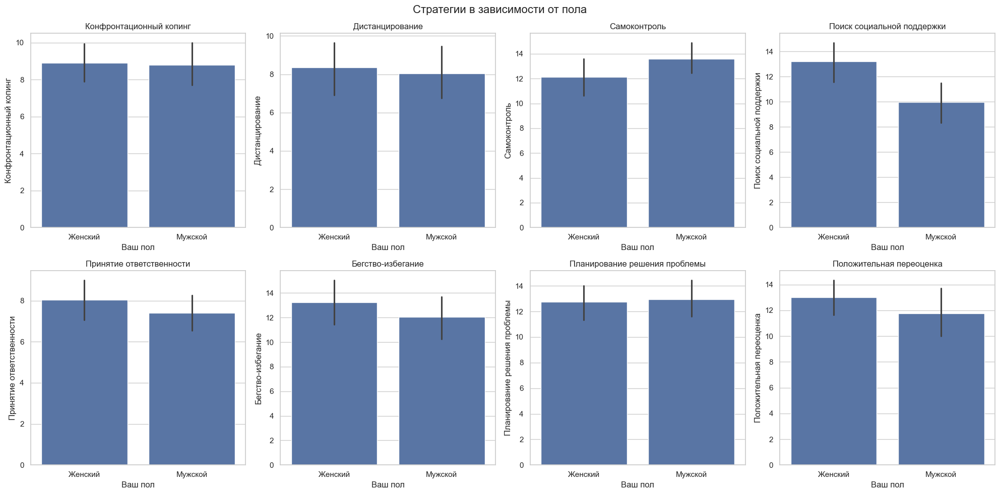

In [151]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle('Стратегии в зависимости от пола', fontsize=16)

for i, strategy in enumerate(coping_gender.columns[1:]):
    sns.barplot(x="Ваш пол", y=strategy, data=coping_gender, ax=axes[i//4, i%4])
    axes[i//4, i%4].set_title(strategy)

plt.tight_layout()
plt.show()

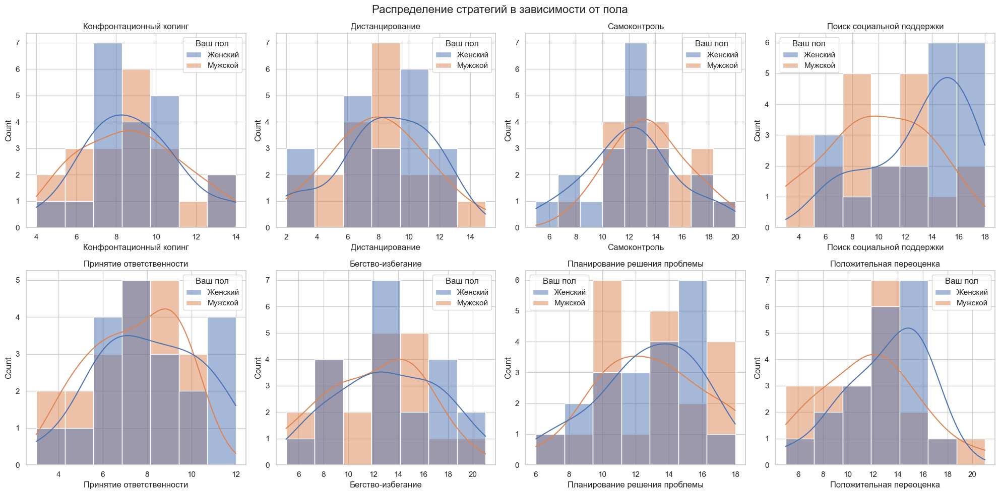

In [152]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle('Распределение стратегий в зависимости от пола', fontsize=16)

for i, strategy in enumerate(coping_gender.columns[1:]):
    sns.histplot(x=strategy, hue="Ваш пол", data=coping_gender, ax=axes[i//4, i%4], kde=True)
    axes[i//4, i%4].set_title(strategy)
    
plt.tight_layout()
plt.show()

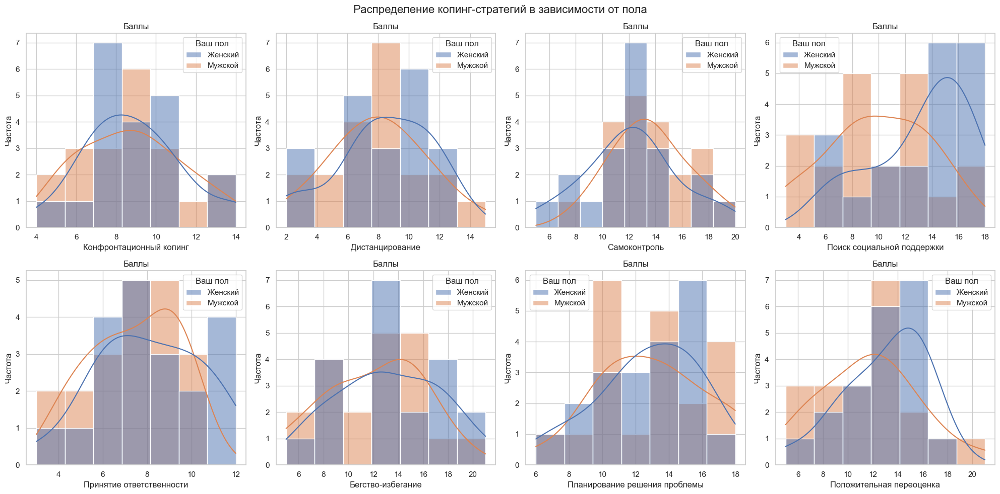

In [153]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle('Распределение копинг-стратегий в зависимости от пола', fontsize=16)

# Визуализация данных
for i, strategy in enumerate(coping_gender.columns[1:]):
    sns.histplot(x=strategy, hue="Ваш пол", data=coping_gender, ax=axes[i//4, i%4], kde=True)
    axes[i//4, i%4].set_title('Баллы')
    axes[i//4, i%4].set_ylabel('Частота')

plt.tight_layout()
plt.show()

In [154]:
df_eng = coping_gender
df_eng = df_eng.rename(columns={'Ваш пол': 'Gender'})
df_eng['Gender'] = df_eng['Gender'].replace({'Мужской': 'Male', 'Женский': 'Female'})

In [155]:
df_eng.head()

,Gender,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка
0,Female,9,2,13,17,7,16,12,14
1,Male,5,7,14,3,4,5,10,7
2,Female,9,12,14,13,8,12,11,10
3,Male,14,5,12,13,9,13,15,11
4,Male,12,12,13,12,10,12,10,12


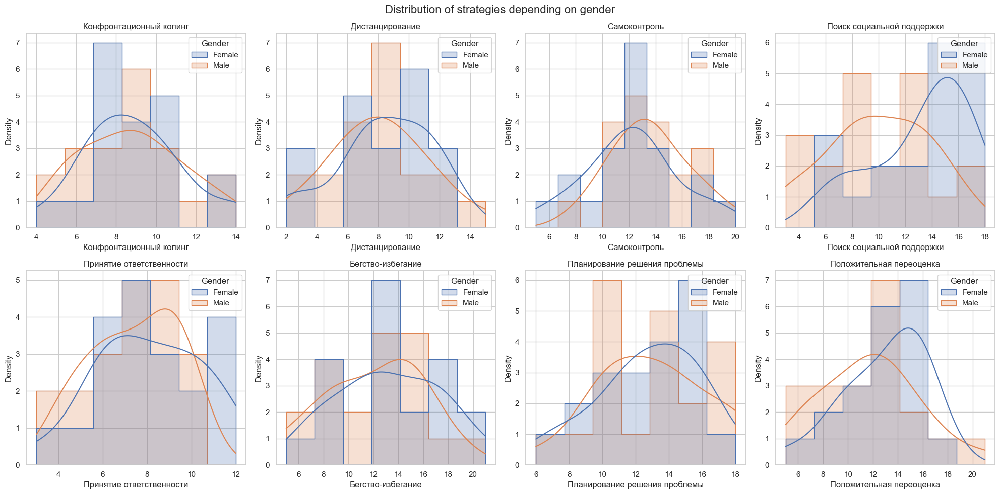

In [156]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle('Distribution of strategies depending on gender', fontsize=16)


for i, strategy in enumerate(coping_gender.columns[1:]):
    sns.histplot(x=strategy, hue="Gender", 
                 data=df_eng, 
                 ax=axes[i//4, i%4], kde=True, element='step')
    
    axes[i//4, i%4].set_title(strategy)
    axes[i//4, i%4].set_ylabel('Density')

plt.tight_layout()
plt.show()

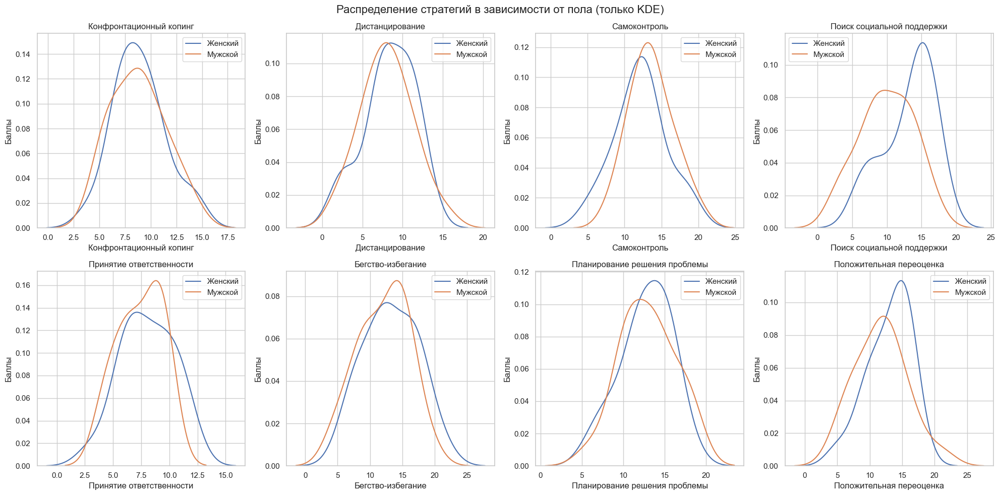

In [157]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle('Распределение стратегий в зависимости от пола (только KDE)', fontsize=16)

# Визуализация данных
for i, strategy in enumerate(coping_gender.columns[1:]):
    for gender in coping_gender['Ваш пол'].unique():
        sns.kdeplot(coping_gender[coping_gender['Ваш пол'] == gender][strategy], ax=axes[i//4, i%4], label=gender)
    axes[i//4, i%4].set_title(strategy)
    axes[i//4, i%4].set_ylabel('Плотность')
    axes[i//4, i%4].set_ylabel('Баллы')
    axes[i//4, i%4].legend()

plt.tight_layout()
plt.show()

## Тестирование гипотезы

**H0 (нулевая гипотеза)**: средние значения по копинг-стратегиям равны среди мужчинам и женщин, нет отличий между группами внутри выборки по признаку пола

**HA (альтернативная гипотеза)**: есть статистически значимые отличия, копинг-стратегии внутри групп по признаку пола различается.

Разделим выборку на мужскую и женскую:

In [158]:
values_female = coping_gender[coping_gender['Ваш пол'] == 'Женский'].drop(columns=['Ваш пол'])
values_male = coping_gender[coping_gender['Ваш пол'] == 'Мужской'].drop(columns=['Ваш пол'])

Применяем критерий Манна-Уитни

In [159]:
p_values = {}
statistics = {}

for column in values_female.columns:
    statistic, p_value = mannwhitneyu(values_female[column], values_male[column])
    p_values[column] = p_value
    statistics[column] = statistic

coping_gender_hypothesis = pd.DataFrame({'Копинг-стратегия': p_values.keys(), 
                       'p-value': p_values.values(), 
                       'U-статистика': statistics.values()})

coping_gender_hypothesis

,Копинг-стратегия,p-value,U-статистика
0,Конфронтационный копинг,0.88,206.00
1,Дистанцирование,0.64,217.50
2,Самоконтроль,0.17,149.50
3,Поиск социальной поддержки,0.01,295.50
4,Принятие ответственности,0.37,233.00
5,Бегство-избегание,0.41,230.50
6,Планирование решения проблемы,0.99,201.00
7,Положительная переоценка,0.21,246.50


Проиллюстрируем различие в применении копинг-стратегий среди мужчин и женщин с помощью ящиков с усами:

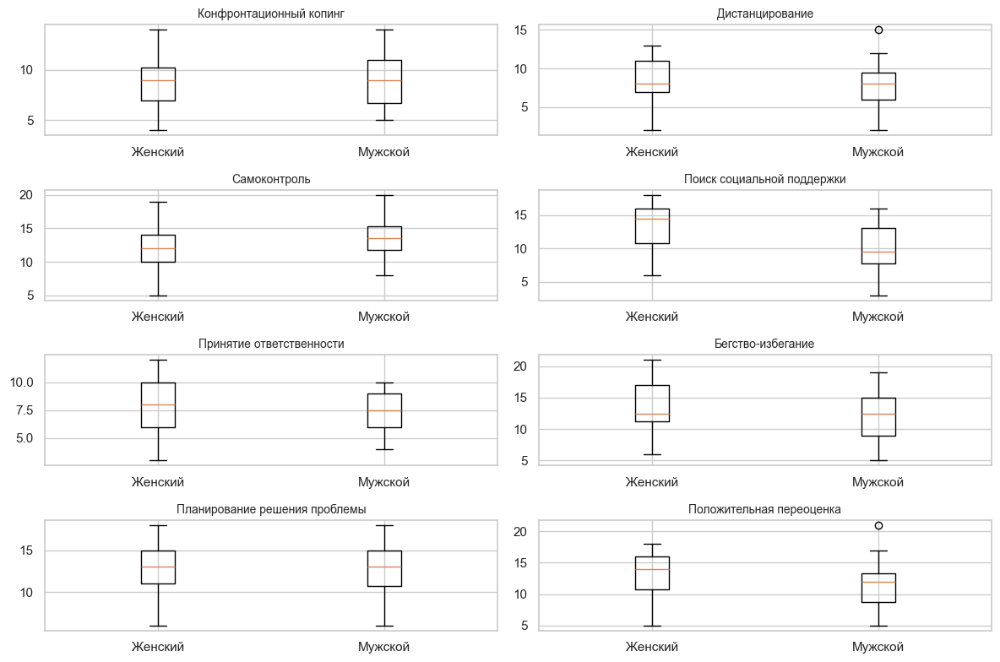

In [160]:
plt.figure(figsize=(12, 8))
for i, column in enumerate(coping_gender.columns[1:]):
    plt.subplot(4, 2, i+1)
    plt.boxplot([coping_gender[coping_gender['Ваш пол'] == 'Женский'][column],
                 coping_gender[coping_gender['Ваш пол'] == 'Мужской'][column]], labels=['Женский', 'Мужской'])
    plt.title(column, fontsize=10)
plt.tight_layout()
plt.show()

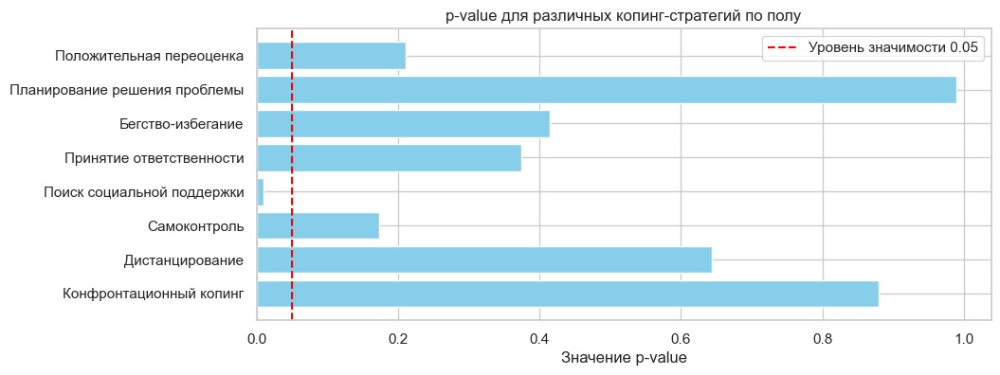

In [161]:
p_values = coping_gender_hypothesis['p-value']
variables = coping_gender_hypothesis['Копинг-стратегия']

plt.figure(figsize=(10,4))
plt.barh(variables, p_values, color='skyblue')
plt.xlabel('Значение p-value')
plt.title('p-value для различных копинг-стратегий по полу')
plt.axvline(x=0.05, color='red', linestyle='--', label='Уровень значимости 0.05')
plt.legend()
plt.show()

# Корреляционный анализ

## Аггрегированные данные

In [162]:
# ценности Леевик
values_aggregated.head()

,ЦО на труд,ЦО на общение,ЦО на познание,ЦО на ОПД,ЦО на материальные ценности,ЦО на развитие нравственных качеств,ЦО на развитие деловых качеств,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств
0,31,28,28,12,29,27,30,28,23
1,33,30,27,17,36,26,30,28,23
2,31,31,24,15,37,22,27,28,27
3,34,35,28,21,39,25,34,29,25
4,30,29,26,17,29,27,30,30,27


In [163]:
# мотивация Потемкина
motivation_aggregated.head()

,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,8,6,8,2,3,7,1,5
1,6,6,8,1,5,7,3,1
2,6,5,7,6,3,4,2,4
3,8,8,3,4,4,5,5,7
4,5,7,4,3,3,9,0,3


In [164]:
# копинги Лазарус 
coping_aggregated.head()

,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка
0,9,2,13,17,7,16,12,14
1,5,7,14,3,4,5,10,7
2,9,12,14,13,8,12,11,10
3,14,5,12,13,9,13,15,11
4,12,12,13,12,10,12,10,12


In [165]:
#gender_data

## Взаимосвязь копинг-стратегий и ценностных установок

### Общий анализ

In [166]:
values_coping = pd.merge(coping_aggregated, 
                         values_aggregated,
                         left_index=True, 
                         right_index=True)

values_coping.head()

,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,ЦО на общение,ЦО на познание,ЦО на ОПД,ЦО на материальные ценности,ЦО на развитие нравственных качеств,ЦО на развитие деловых качеств,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств
0,9,2,13,17,7,16,12,14,31,28,28,12,29,27,30,28,23
1,5,7,14,3,4,5,10,7,33,30,27,17,36,26,30,28,23
2,9,12,14,13,8,12,11,10,31,31,24,15,37,22,27,28,27
3,14,5,12,13,9,13,15,11,34,35,28,21,39,25,34,29,25
4,12,12,13,12,10,12,10,12,30,29,26,17,29,27,30,30,27


In [167]:
values_coping_corr = values_coping.corr(method='spearman', 
                                        numeric_only=True)
values_coping_corr

,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,ЦО на общение,ЦО на познание,ЦО на ОПД,ЦО на материальные ценности,ЦО на развитие нравственных качеств,ЦО на развитие деловых качеств,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств
Конфронтационный копинг,1.00,0.20,0.36,0.42,0.34,0.75,0.32,0.35,0.26,0.24,-0.06,0.03,0.27,-0.06,0.05,0.05,0.09
Дистанцирование,0.20,1.00,0.41,-0.09,0.06,0.15,-0.11,0.11,0.10,0.01,-0.33,0.12,0.10,-0.08,-0.14,0.10,0.01
Самоконтроль,0.36,0.41,1.00,-0.10,-0.01,0.22,0.05,0.15,0.23,0.19,-0.16,0.27,0.26,-0.03,0.24,0.17,0.12
Поиск социальной поддержки,0.42,-0.09,-0.10,1.00,0.58,0.52,0.32,0.47,0.20,0.15,-0.01,-0.07,-0.01,0.13,-0.01,0.05,0.10
Принятие ответственности,0.34,0.06,-0.01,0.58,1.00,0.26,0.24,0.37,0.21,0.11,0.14,0.13,-0.02,0.09,0.06,0.28,0.20
Бегство-избегание,0.75,0.15,0.22,0.52,0.26,1.00,0.12,0.22,0.26,0.08,-0.07,-0.00,0.31,-0.05,0.04,-0.12,-0.10
Планирование решения проблемы,0.32,-0.11,0.05,0.32,0.24,0.12,1.00,0.58,0.04,-0.08,0.20,-0.30,-0.09,-0.22,0.25,0.05,-0.15
Положительная переоценка,0.35,0.11,0.15,0.47,0.37,0.22,0.58,1.00,0.27,-0.08,0.23,-0.04,0.15,0.14,0.30,0.32,0.15
ЦО на труд,0.26,0.10,0.23,0.20,0.21,0.26,0.04,0.27,1.00,0.40,0.29,0.26,0.35,0.53,0.35,0.46,0.44
ЦО на общение,0.24,0.01,0.19,0.15,0.11,0.08,-0.08,-0.08,0.40,1.00,0.02,0.47,0.52,0.40,0.18,0.25,0.38


Корреляция:
* 0.1 - 0.3 - очень слабая
* 0.3 - 0.5 - слабая
* 0.5 - 0.7 - умеренная (средняя
* 0.7 - 0.9 - сильная
* 0.9 - 1.0 - очень сильная

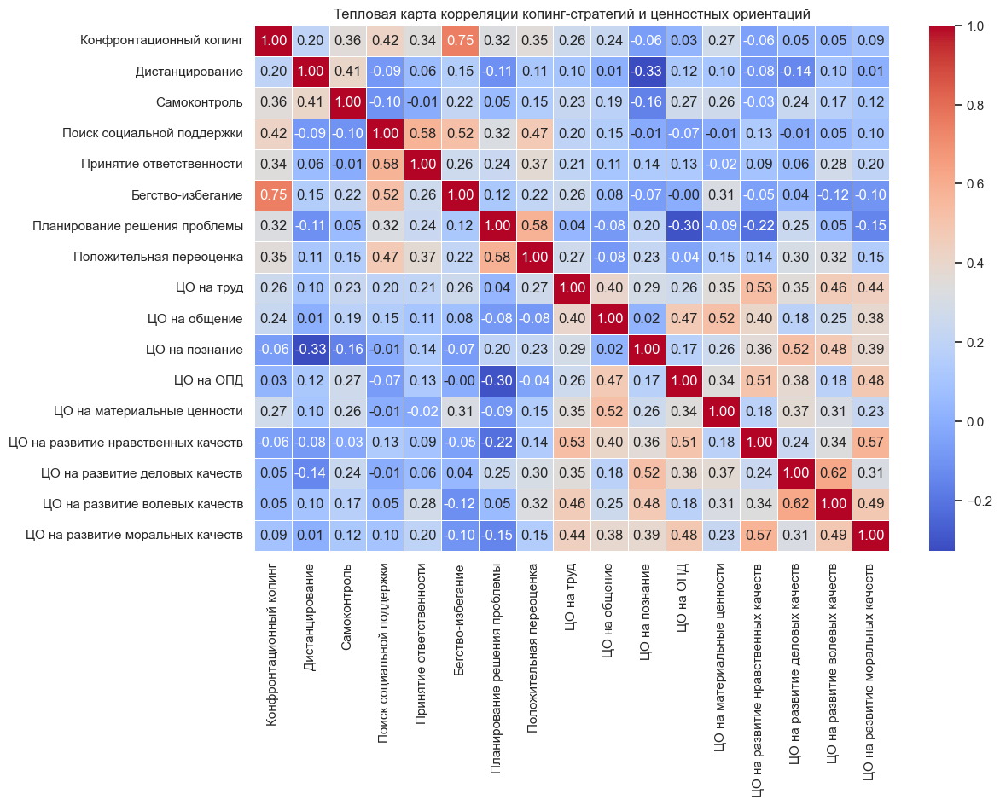

In [168]:
plt.figure(figsize=(12, 8))
sns.heatmap(values_coping_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Тепловая карта корреляции копинг-стратегий и ценностных ориентаций')
plt.show()

### Анализ с разбивкой по полу

In [169]:
gender_data.head()

,Ваш пол
0,Женский
1,Мужской
2,Женский
3,Мужской
4,Мужской


In [170]:
values_coping_by_gender = pd.merge(gender_data,
                                   values_coping, 
                                   left_index=True, 
                                   right_index=True)

values_coping_by_gender.head()

,Ваш пол,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,ЦО на общение,ЦО на познание,ЦО на ОПД,ЦО на материальные ценности,ЦО на развитие нравственных качеств,ЦО на развитие деловых качеств,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств
0,Женский,9,2,13,17,7,16,12,14,31,28,28,12,29,27,30,28,23
1,Мужской,5,7,14,3,4,5,10,7,33,30,27,17,36,26,30,28,23
2,Женский,9,12,14,13,8,12,11,10,31,31,24,15,37,22,27,28,27
3,Мужской,14,5,12,13,9,13,15,11,34,35,28,21,39,25,34,29,25
4,Мужской,12,12,13,12,10,12,10,12,30,29,26,17,29,27,30,30,27


### Женщины

In [171]:
values_coping_female = values_coping_by_gender[values_coping_by_gender['Ваш пол'] == 'Женский']
values_coping_female.head()

,Ваш пол,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,ЦО на общение,ЦО на познание,ЦО на ОПД,ЦО на материальные ценности,ЦО на развитие нравственных качеств,ЦО на развитие деловых качеств,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств
0,Женский,9,2,13,17,7,16,12,14,31,28,28,12,29,27,30,28,23
2,Женский,9,12,14,13,8,12,11,10,31,31,24,15,37,22,27,28,27
5,Женский,9,8,7,17,3,17,8,8,32,34,25,14,42,26,28,25,20
7,Женский,6,8,11,9,6,16,8,5,33,29,29,16,40,29,32,27,25
9,Женский,7,11,12,7,6,12,10,16,39,25,29,11,37,28,31,31,21


In [172]:
values_coping_corr_female = values_coping_female.corr(method='spearman', 
                                        numeric_only=True)
values_coping_corr_female

,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,ЦО на общение,ЦО на познание,ЦО на ОПД,ЦО на материальные ценности,ЦО на развитие нравственных качеств,ЦО на развитие деловых качеств,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств
Конфронтационный копинг,1.00,0.26,0.54,0.39,0.29,0.75,0.32,0.03,0.39,0.48,-0.22,-0.10,0.06,-0.10,-0.32,-0.06,0.05
Дистанцирование,0.26,1.00,0.45,-0.21,-0.18,0.10,-0.20,-0.16,0.28,0.14,-0.45,0.02,0.01,-0.21,-0.41,-0.04,-0.03
Самоконтроль,0.54,0.45,1.00,0.09,0.27,0.27,0.10,0.20,0.34,0.42,-0.07,0.06,0.16,-0.02,-0.08,0.28,0.34
Поиск социальной поддержки,0.39,-0.21,0.09,1.00,0.36,0.37,0.37,0.24,0.00,0.22,-0.21,-0.15,-0.14,0.16,-0.12,-0.07,-0.05
Принятие ответственности,0.29,-0.18,0.27,0.36,1.00,0.16,0.39,0.23,0.15,0.23,0.07,0.01,-0.05,0.02,0.11,0.26,0.17
Бегство-избегание,0.75,0.10,0.27,0.37,0.16,1.00,-0.06,-0.27,0.35,0.34,-0.15,-0.03,0.28,0.05,-0.16,-0.24,-0.16
Планирование решения проблемы,0.32,-0.20,0.10,0.37,0.39,-0.06,1.00,0.65,-0.02,-0.08,0.02,-0.31,-0.33,-0.12,-0.01,0.11,0.10
Положительная переоценка,0.03,-0.16,0.20,0.24,0.23,-0.27,0.65,1.00,0.15,-0.19,0.25,-0.06,-0.11,0.32,0.15,0.32,0.28
ЦО на труд,0.39,0.28,0.34,0.00,0.15,0.35,-0.02,0.15,1.00,0.45,0.43,0.17,0.41,0.46,0.37,0.57,0.42
ЦО на общение,0.48,0.14,0.42,0.22,0.23,0.34,-0.08,-0.19,0.45,1.00,0.16,0.38,0.60,0.10,0.12,0.29,0.45


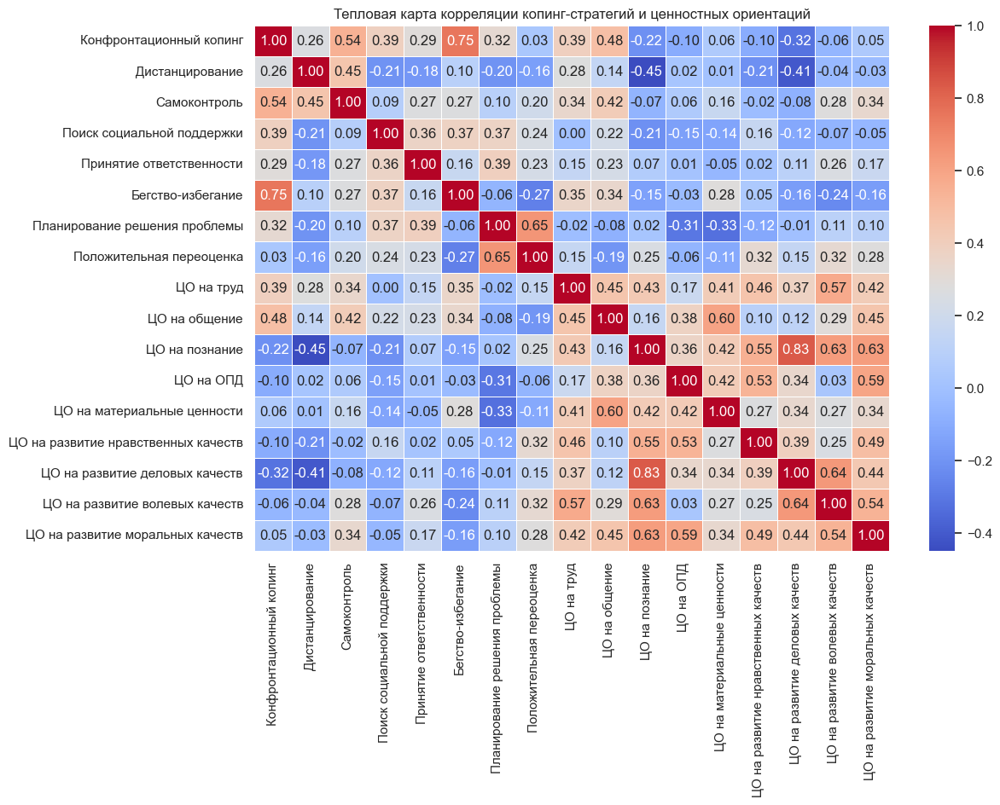

In [173]:
plt.figure(figsize=(12, 8))
sns.heatmap(values_coping_corr_female, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Тепловая карта корреляции копинг-стратегий и ценностных ориентаций')
plt.show()

### Мужчины

In [174]:
values_coping_male = values_coping_by_gender[values_coping_by_gender['Ваш пол'] == 'Мужской']
values_coping_male.head()

,Ваш пол,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,ЦО на общение,ЦО на познание,ЦО на ОПД,ЦО на материальные ценности,ЦО на развитие нравственных качеств,ЦО на развитие деловых качеств,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств
1,Мужской,5,7,14,3,4,5,10,7,33,30,27,17,36,26,30,28,23
3,Мужской,14,5,12,13,9,13,15,11,34,35,28,21,39,25,34,29,25
4,Мужской,12,12,13,12,10,12,10,12,30,29,26,17,29,27,30,30,27
6,Мужской,6,12,14,10,8,10,13,13,34,23,27,13,32,20,33,31,24
8,Мужской,11,3,11,14,7,16,10,14,36,31,27,11,35,26,30,29,27


In [175]:
values_coping_corr_male = values_coping_male.corr(method='spearman', 
                                        numeric_only=True)
values_coping_corr_male

,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,ЦО на общение,ЦО на познание,ЦО на ОПД,ЦО на материальные ценности,ЦО на развитие нравственных качеств,ЦО на развитие деловых качеств,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств
Конфронтационный копинг,1.00,0.10,0.22,0.52,0.45,0.76,0.29,0.60,0.22,0.05,0.06,0.09,0.44,-0.07,0.37,0.16,0.18
Дистанцирование,0.10,1.00,0.40,-0.07,0.27,0.18,-0.10,0.27,-0.05,-0.09,-0.23,0.23,0.14,0.02,0.03,0.24,0.03
Самоконтроль,0.22,0.40,1.00,-0.24,-0.28,0.31,0.05,0.23,0.21,0.03,-0.29,0.41,0.42,0.02,0.50,0.10,-0.01
Поиск социальной поддержки,0.52,-0.07,-0.24,1.00,0.76,0.64,0.27,0.57,0.31,-0.03,0.21,0.05,-0.08,0.00,0.22,0.21,0.12
Принятие ответственности,0.45,0.27,-0.28,0.76,1.00,0.39,0.04,0.42,0.27,-0.00,0.16,0.21,-0.01,0.14,-0.04,0.28,0.17
Бегство-избегание,0.76,0.18,0.31,0.64,0.39,1.00,0.27,0.66,0.27,-0.18,-0.02,0.03,0.33,-0.25,0.30,0.02,-0.02
Планирование решения проблемы,0.29,-0.10,0.05,0.27,0.04,0.27,1.00,0.48,0.03,-0.07,0.43,-0.37,0.13,-0.31,0.43,0.01,-0.42
Положительная переоценка,0.60,0.27,0.23,0.57,0.42,0.66,0.48,1.00,0.46,0.04,0.24,-0.04,0.39,0.07,0.51,0.43,0.19
ЦО на труд,0.22,-0.05,0.21,0.31,0.27,0.27,0.03,0.46,1.00,0.34,0.09,0.35,0.27,0.57,0.25,0.29,0.50
ЦО на общение,0.05,-0.09,0.03,-0.03,-0.00,-0.18,-0.07,0.04,0.34,1.00,-0.04,0.59,0.42,0.62,0.23,0.27,0.35


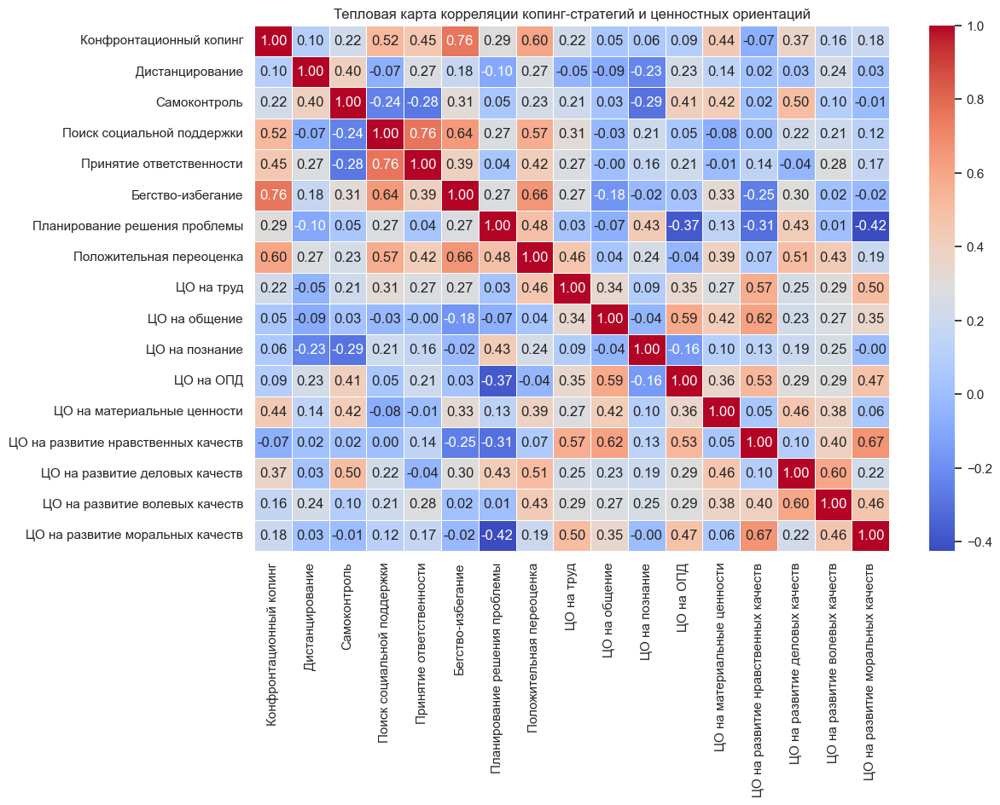

In [176]:
plt.figure(figsize=(12, 8))
sns.heatmap(values_coping_corr_male, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Тепловая карта корреляции копинг-стратегий и ценностных ориентаций')
plt.show()

## Взаимосвязь копинг-стратегий и мотивационных установок

### Общий анализ

In [177]:
motivation_coping = pd.merge(coping_aggregated, 
                             motivation_aggregated,
                             left_index=True, 
                             right_index=True)

motivation_coping.head()

,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,9,2,13,17,7,16,12,14,8,6,8,2,3,7,1,5
1,5,7,14,3,4,5,10,7,6,6,8,1,5,7,3,1
2,9,12,14,13,8,12,11,10,6,5,7,6,3,4,2,4
3,14,5,12,13,9,13,15,11,8,8,3,4,4,5,5,7
4,12,12,13,12,10,12,10,12,5,7,4,3,3,9,0,3


In [178]:
motivation_coping_corr = motivation_coping.corr(method='spearman', 
                                        numeric_only=True)
motivation_coping_corr

,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
Конфронтационный копинг,1.00,0.20,0.36,0.42,0.34,0.75,0.32,0.35,0.26,0.06,-0.26,0.48,0.24,0.16,0.12,0.37
Дистанцирование,0.20,1.00,0.41,-0.09,0.06,0.15,-0.11,0.11,-0.01,-0.00,-0.18,0.01,0.04,0.02,0.03,0.16
Самоконтроль,0.36,0.41,1.00,-0.10,-0.01,0.22,0.05,0.15,0.30,0.13,0.06,0.13,0.10,-0.02,0.29,0.04
Поиск социальной поддержки,0.42,-0.09,-0.10,1.00,0.58,0.52,0.32,0.47,0.25,-0.14,0.05,0.07,0.04,-0.07,-0.12,0.23
Принятие ответственности,0.34,0.06,-0.01,0.58,1.00,0.26,0.24,0.37,0.16,-0.16,0.07,-0.03,-0.07,-0.28,-0.09,0.04
Бегство-избегание,0.75,0.15,0.22,0.52,0.26,1.00,0.12,0.22,0.22,-0.23,-0.26,0.39,0.13,0.11,-0.05,0.28
Планирование решения проблемы,0.32,-0.11,0.05,0.32,0.24,0.12,1.00,0.58,0.30,0.53,-0.06,0.30,0.33,0.16,0.30,0.11
Положительная переоценка,0.35,0.11,0.15,0.47,0.37,0.22,0.58,1.00,0.15,0.39,0.08,0.10,0.38,0.16,0.26,0.24
ориентация на процесс,0.26,-0.01,0.30,0.25,0.16,0.22,0.30,0.15,1.00,-0.04,0.10,0.12,0.00,0.04,0.13,-0.13
ориентация на результат,0.06,-0.00,0.13,-0.14,-0.16,-0.23,0.53,0.39,-0.04,1.00,-0.07,0.11,0.29,0.30,0.30,0.13


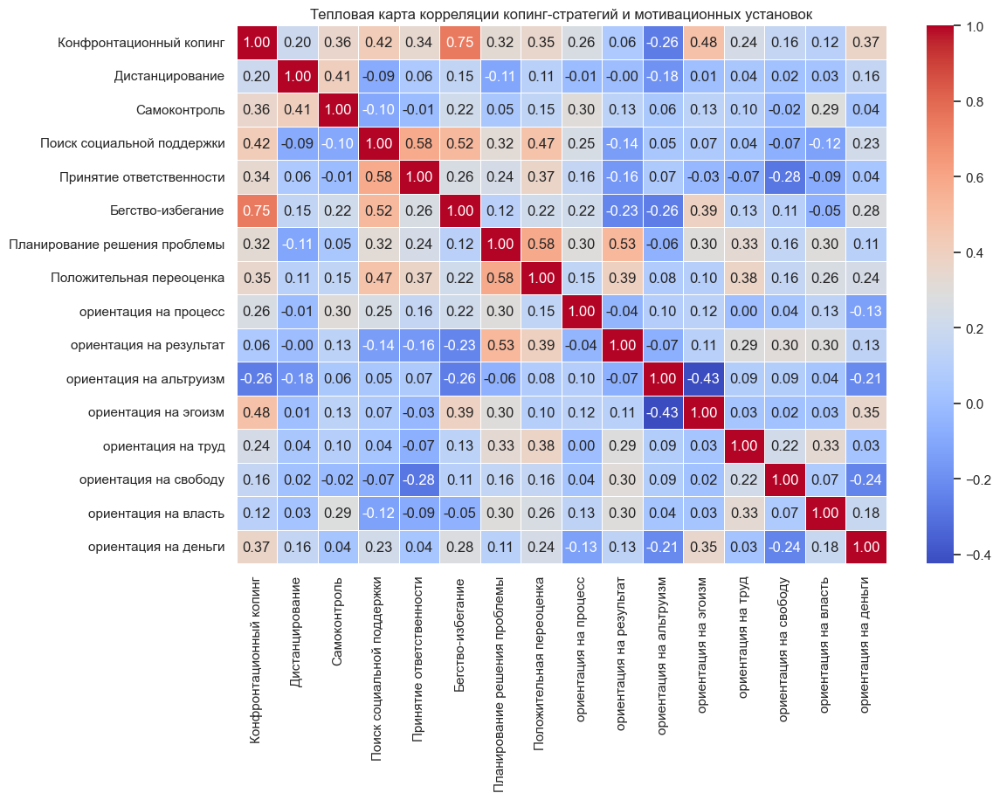

In [179]:
plt.figure(figsize=(12, 8))
sns.heatmap(motivation_coping_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Тепловая карта корреляции копинг-стратегий и мотивационных установок')
plt.show()

### Анализ с разбивкой по полу

In [180]:
motivation_coping_by_gender = pd.merge(gender_data,
                                   motivation_coping, 
                                   left_index=True, 
                                   right_index=True)

motivation_coping_by_gender.head()

,Ваш пол,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,Женский,9,2,13,17,7,16,12,14,8,6,8,2,3,7,1,5
1,Мужской,5,7,14,3,4,5,10,7,6,6,8,1,5,7,3,1
2,Женский,9,12,14,13,8,12,11,10,6,5,7,6,3,4,2,4
3,Мужской,14,5,12,13,9,13,15,11,8,8,3,4,4,5,5,7
4,Мужской,12,12,13,12,10,12,10,12,5,7,4,3,3,9,0,3


#### Женщины

In [181]:
motivation_coping_female = motivation_coping_by_gender[motivation_coping_by_gender['Ваш пол'] == 'Женский']
motivation_coping_female.head()

,Ваш пол,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,Женский,9,2,13,17,7,16,12,14,8,6,8,2,3,7,1,5
2,Женский,9,12,14,13,8,12,11,10,6,5,7,6,3,4,2,4
5,Женский,9,8,7,17,3,17,8,8,1,5,1,7,4,7,0,6
7,Женский,6,8,11,9,6,16,8,5,3,3,8,1,3,8,2,3
9,Женский,7,11,12,7,6,12,10,16,4,7,5,3,6,9,1,4


In [182]:
motivation_coping_corr_female = motivation_coping_female.corr(method='spearman', 
                                        numeric_only=True)
motivation_coping_corr_female

,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
Конфронтационный копинг,1.00,0.26,0.54,0.39,0.29,0.75,0.32,0.03,0.38,-0.22,-0.17,0.46,0.12,0.06,0.04,0.39
Дистанцирование,0.26,1.00,0.45,-0.21,-0.18,0.10,-0.20,-0.16,0.23,-0.30,-0.25,0.10,-0.08,0.24,0.09,-0.00
Самоконтроль,0.54,0.45,1.00,0.09,0.27,0.27,0.10,0.20,0.49,-0.24,0.27,0.03,-0.23,-0.05,0.21,0.17
Поиск социальной поддержки,0.39,-0.21,0.09,1.00,0.36,0.37,0.37,0.24,0.48,-0.06,-0.18,0.12,0.04,-0.40,-0.27,0.25
Принятие ответственности,0.29,-0.18,0.27,0.36,1.00,0.16,0.39,0.23,0.35,-0.11,-0.03,0.08,-0.05,-0.52,0.05,-0.27
Бегство-избегание,0.75,0.10,0.27,0.37,0.16,1.00,-0.06,-0.27,0.20,-0.58,-0.29,0.34,-0.07,-0.07,-0.29,0.26
Планирование решения проблемы,0.32,-0.20,0.10,0.37,0.39,-0.06,1.00,0.65,0.39,0.58,0.02,0.28,0.37,0.10,0.27,0.26
Положительная переоценка,0.03,-0.16,0.20,0.24,0.23,-0.27,0.65,1.00,0.23,0.53,0.09,-0.06,0.45,0.04,0.34,0.32
ориентация на процесс,0.38,0.23,0.49,0.48,0.35,0.20,0.39,0.23,1.00,-0.15,-0.04,-0.01,-0.07,-0.18,-0.22,-0.12
ориентация на результат,-0.22,-0.30,-0.24,-0.06,-0.11,-0.58,0.58,0.53,-0.15,1.00,0.14,0.06,0.33,0.31,0.31,0.24


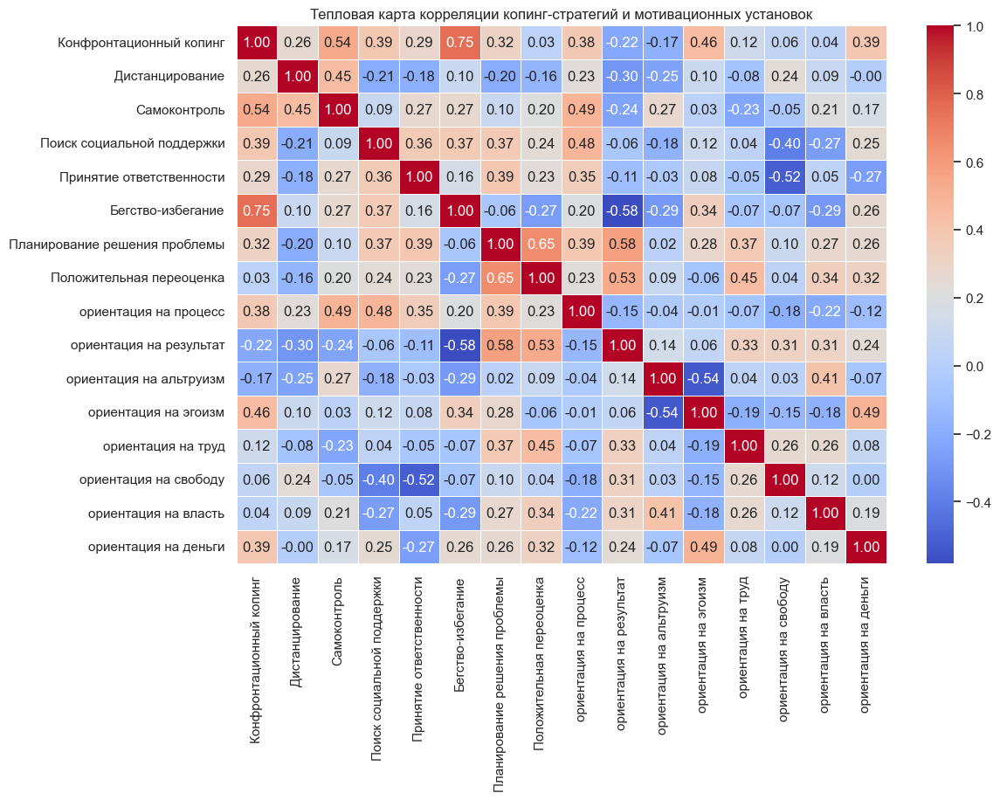

In [183]:
plt.figure(figsize=(12, 8))
sns.heatmap(motivation_coping_corr_female, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Тепловая карта корреляции копинг-стратегий и мотивационных установок')
plt.show()

#### Мужчины

In [184]:
motivation_coping_male = motivation_coping_by_gender[motivation_coping_by_gender['Ваш пол'] == 'Мужской']
motivation_coping_male.head()

,Ваш пол,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
1,Мужской,5,7,14,3,4,5,10,7,6,6,8,1,5,7,3,1
3,Мужской,14,5,12,13,9,13,15,11,8,8,3,4,4,5,5,7
4,Мужской,12,12,13,12,10,12,10,12,5,7,4,3,3,9,0,3
6,Мужской,6,12,14,10,8,10,13,13,5,7,3,1,2,7,7,4
8,Мужской,11,3,11,14,7,16,10,14,6,3,1,4,3,7,5,4


In [185]:
motivation_coping_corr_male = motivation_coping_male.corr(method='spearman', 
                                        numeric_only=True)
motivation_coping_corr_male

,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
Конфронтационный копинг,1.00,0.10,0.22,0.52,0.45,0.76,0.29,0.60,0.21,0.39,-0.37,0.50,0.35,0.19,0.21,0.37
Дистанцирование,0.10,1.00,0.40,-0.07,0.27,0.18,-0.10,0.27,-0.21,0.27,-0.16,-0.05,0.10,-0.18,0.02,0.36
Самоконтроль,0.22,0.40,1.00,-0.24,-0.28,0.31,0.05,0.23,0.08,0.45,0.02,0.24,0.59,0.07,0.32,-0.06
Поиск социальной поддержки,0.52,-0.07,-0.24,1.00,0.76,0.64,0.27,0.57,0.26,-0.03,-0.12,-0.01,-0.11,0.13,0.12,0.22
Принятие ответственности,0.45,0.27,-0.28,0.76,1.00,0.39,0.04,0.42,0.04,-0.17,0.03,-0.15,-0.12,-0.10,-0.16,0.38
Бегство-избегание,0.76,0.18,0.31,0.64,0.39,1.00,0.27,0.66,0.26,0.24,-0.34,0.51,0.30,0.19,0.25,0.26
Планирование решения проблемы,0.29,-0.10,0.05,0.27,0.04,0.27,1.00,0.48,0.20,0.56,-0.15,0.33,0.24,0.21,0.38,0.02
Положительная переоценка,0.60,0.27,0.23,0.57,0.42,0.66,0.48,1.00,0.12,0.34,-0.13,0.21,0.24,0.25,0.34,0.19
ориентация на процесс,0.21,-0.21,0.08,0.26,0.04,0.26,0.20,0.12,1.00,0.07,0.46,0.21,0.14,0.30,0.36,-0.13
ориентация на результат,0.39,0.27,0.45,-0.03,-0.17,0.24,0.56,0.34,0.07,1.00,-0.34,0.22,0.30,0.36,0.32,0.08


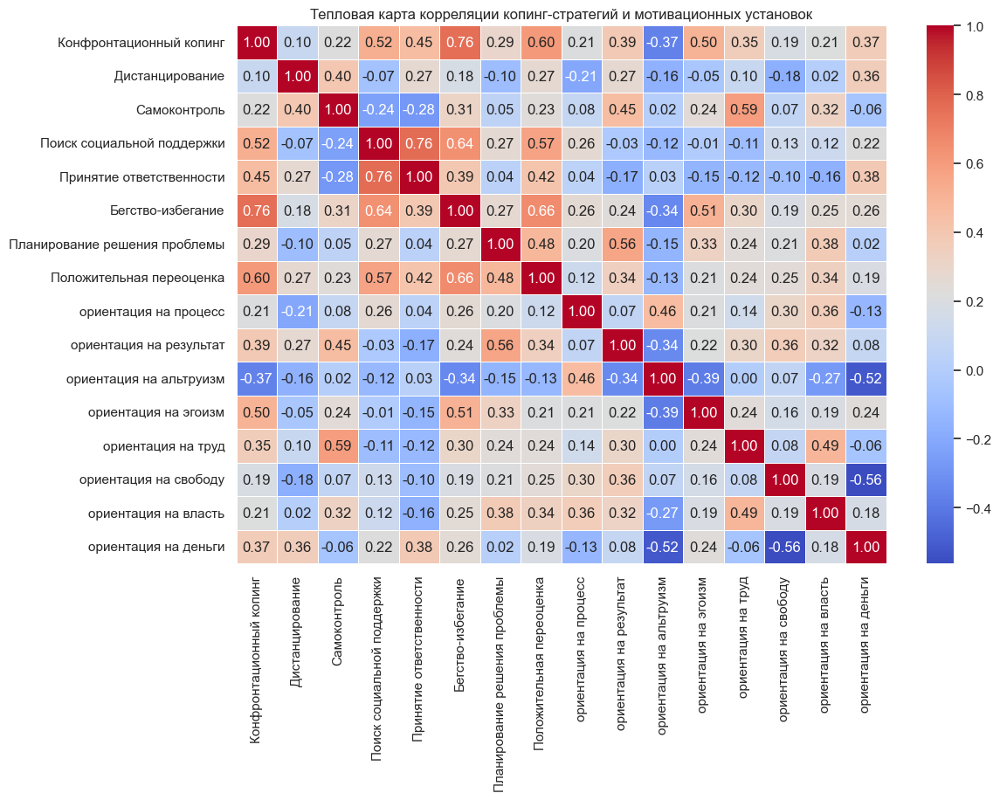

In [186]:
plt.figure(figsize=(12, 8))
sns.heatmap(motivation_coping_corr_male, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Тепловая карта корреляции копинг-стратегий и мотивационных установок')
plt.show()

# Корреляционный анализ трех опросов

In [187]:
all_polls_data = pd.merge(values_coping_by_gender,
                                   motivation_aggregated, 
                                   left_index=True, 
                                   right_index=True)

all_polls_data.head()

,Ваш пол,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,...,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,Женский,9,2,13,17,7,16,12,14,31,...,28,23,8,6,8,2,3,7,1,5
1,Мужской,5,7,14,3,4,5,10,7,33,...,28,23,6,6,8,1,5,7,3,1
2,Женский,9,12,14,13,8,12,11,10,31,...,28,27,6,5,7,6,3,4,2,4
3,Мужской,14,5,12,13,9,13,15,11,34,...,29,25,8,8,3,4,4,5,5,7
4,Мужской,12,12,13,12,10,12,10,12,30,...,30,27,5,7,4,3,3,9,0,3


In [188]:
all_polls_data

,Ваш пол,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,...,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,Женский,9,2,13,17,7,16,12,14,31,...,28,23,8,6,8,2,3,7,1,5
1,Мужской,5,7,14,3,4,5,10,7,33,...,28,23,6,6,8,1,5,7,3,1
2,Женский,9,12,14,13,8,12,11,10,31,...,28,27,6,5,7,6,3,4,2,4
3,Мужской,14,5,12,13,9,13,15,11,34,...,29,25,8,8,3,4,4,5,5,7
4,Мужской,12,12,13,12,10,12,10,12,30,...,30,27,5,7,4,3,3,9,0,3
5,Женский,9,8,7,17,3,17,8,8,32,...,25,20,1,5,1,7,4,7,0,6
6,Мужской,6,12,14,10,8,10,13,13,34,...,31,24,5,7,3,1,2,7,7,4
7,Женский,6,8,11,9,6,16,8,5,33,...,27,25,3,3,8,1,3,8,2,3
8,Мужской,11,3,11,14,7,16,10,14,36,...,29,27,6,3,1,4,3,7,5,4
9,Женский,7,11,12,7,6,12,10,16,39,...,31,21,4,7,5,3,6,9,1,4


In [189]:
all_polls_data_female = all_polls_data[all_polls_data['Ваш пол'] == 'Женский']
all_polls_data_female_corr = all_polls_data_female.corr(method='spearman', numeric_only=True)

all_polls_data_male = all_polls_data[all_polls_data['Ваш пол'] == 'Мужской']
all_polls_data_male_corr = all_polls_data_male.corr(method='spearman', numeric_only=True)

In [190]:
all_polls_data_corr = all_polls_data.corr(method='spearman', numeric_only=True)
all_polls_data_corr

,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,ЦО на общение,...,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
Конфронтационный копинг,1.00,0.20,0.36,0.42,0.34,0.75,0.32,0.35,0.26,0.24,...,0.05,0.09,0.26,0.06,-0.26,0.48,0.24,0.16,0.12,0.37
Дистанцирование,0.20,1.00,0.41,-0.09,0.06,0.15,-0.11,0.11,0.10,0.01,...,0.10,0.01,-0.01,-0.00,-0.18,0.01,0.04,0.02,0.03,0.16
Самоконтроль,0.36,0.41,1.00,-0.10,-0.01,0.22,0.05,0.15,0.23,0.19,...,0.17,0.12,0.30,0.13,0.06,0.13,0.10,-0.02,0.29,0.04
Поиск социальной поддержки,0.42,-0.09,-0.10,1.00,0.58,0.52,0.32,0.47,0.20,0.15,...,0.05,0.10,0.25,-0.14,0.05,0.07,0.04,-0.07,-0.12,0.23
Принятие ответственности,0.34,0.06,-0.01,0.58,1.00,0.26,0.24,0.37,0.21,0.11,...,0.28,0.20,0.16,-0.16,0.07,-0.03,-0.07,-0.28,-0.09,0.04
Бегство-избегание,0.75,0.15,0.22,0.52,0.26,1.00,0.12,0.22,0.26,0.08,...,-0.12,-0.10,0.22,-0.23,-0.26,0.39,0.13,0.11,-0.05,0.28
Планирование решения проблемы,0.32,-0.11,0.05,0.32,0.24,0.12,1.00,0.58,0.04,-0.08,...,0.05,-0.15,0.30,0.53,-0.06,0.30,0.33,0.16,0.30,0.11
Положительная переоценка,0.35,0.11,0.15,0.47,0.37,0.22,0.58,1.00,0.27,-0.08,...,0.32,0.15,0.15,0.39,0.08,0.10,0.38,0.16,0.26,0.24
ЦО на труд,0.26,0.10,0.23,0.20,0.21,0.26,0.04,0.27,1.00,0.40,...,0.46,0.44,0.12,-0.15,0.21,-0.22,0.28,-0.02,0.08,0.02
ЦО на общение,0.24,0.01,0.19,0.15,0.11,0.08,-0.08,-0.08,0.40,1.00,...,0.25,0.38,0.04,-0.14,0.15,0.03,0.14,-0.33,0.10,0.25


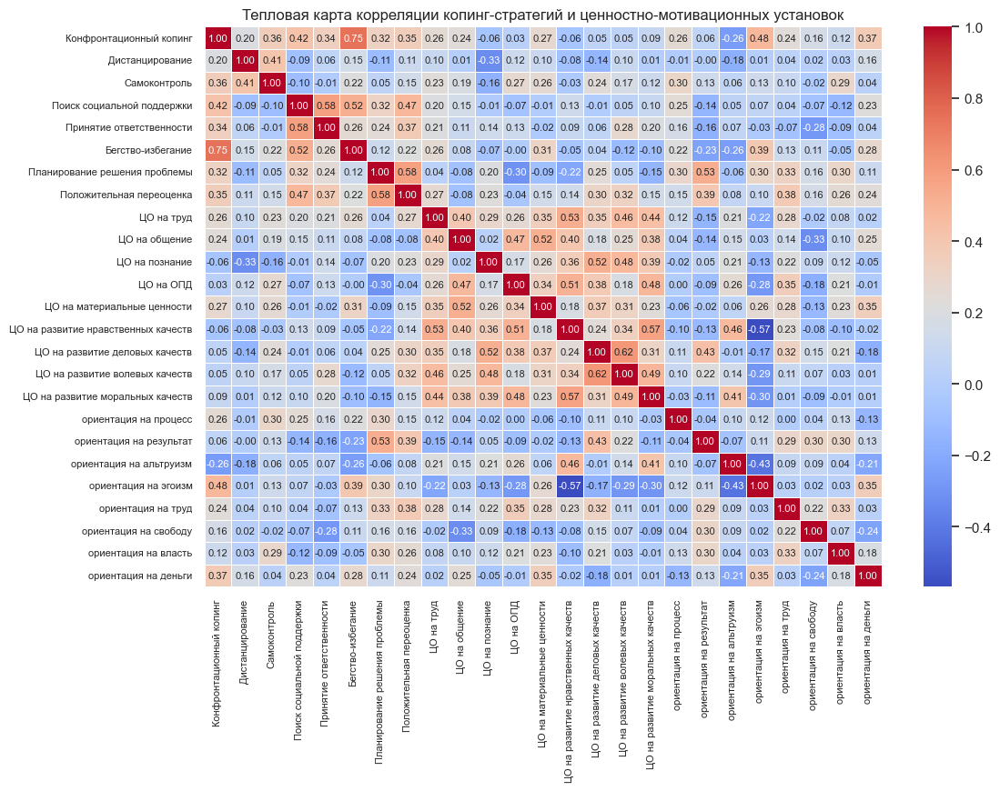

In [191]:
plt.figure(figsize=(12, 8))
heatmap = sns.heatmap(all_polls_data_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, annot_kws={"fontsize": 8})
# Установка размера шрифта для меток осей
heatmap.tick_params(axis='both', which='both', labelsize=8)
plt.title('Тепловая карта корреляции копинг-стратегий и ценностно-мотивационных установок')
plt.show()

In [192]:
all_polls_data_female = all_polls_data[all_polls_data['Ваш пол'] == 'Женский']
all_polls_data_female_corr = all_polls_data_female.corr(method='spearman', numeric_only=True)

all_polls_data_male = all_polls_data[all_polls_data['Ваш пол'] == 'Мужской']
all_polls_data_male_corr = all_polls_data_male.corr(method='spearman', numeric_only=True)

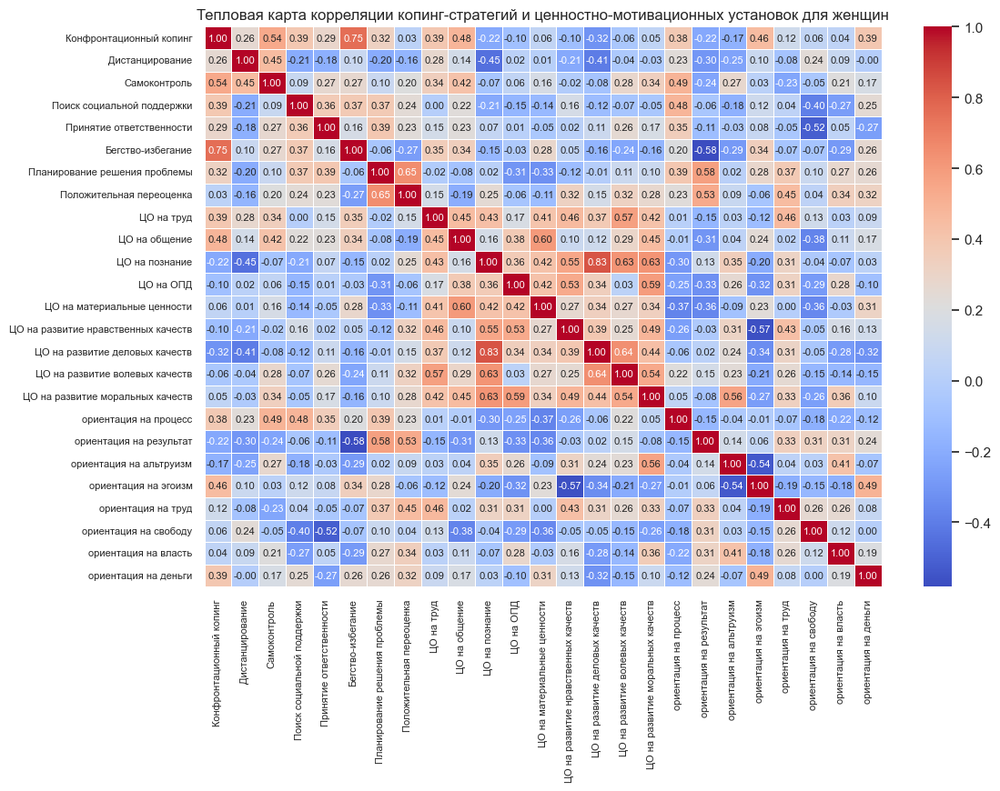

In [193]:
plt.figure(figsize=(12, 8))
heatmap = sns.heatmap(all_polls_data_female_corr, annot=True, cmap='coolwarm', fmt=".2f", 
                      linewidths=.5, annot_kws={"fontsize": 8})
# Установка размера шрифта для меток осей
heatmap.tick_params(axis='both', which='both', labelsize=8)
plt.title('Тепловая карта корреляции копинг-стратегий и ценностно-мотивационных установок для женщин')
plt.show()

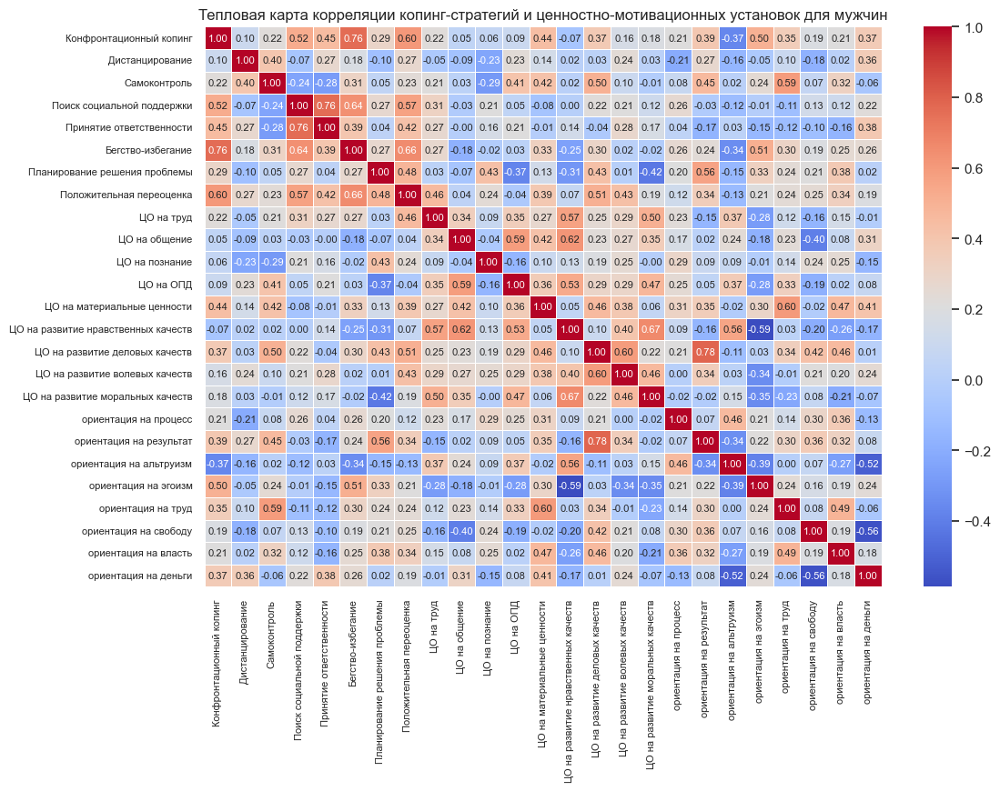

In [194]:
plt.figure(figsize=(12, 8))
heatmap = sns.heatmap(all_polls_data_male_corr, annot=True, cmap='coolwarm', fmt=".2f", 
                      linewidths=.5, annot_kws={"fontsize": 8})
# Установка размера шрифта для меток осей
heatmap.tick_params(axis='both', which='both', labelsize=8)
plt.title('Тепловая карта корреляции копинг-стратегий и ценностно-мотивационных установок для мужчин')
plt.show()

# Регрессионный анализ

In [195]:
values_coping_by_gender.head()

,Ваш пол,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,ЦО на общение,ЦО на познание,ЦО на ОПД,ЦО на материальные ценности,ЦО на развитие нравственных качеств,ЦО на развитие деловых качеств,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств
0,Женский,9,2,13,17,7,16,12,14,31,28,28,12,29,27,30,28,23
1,Мужской,5,7,14,3,4,5,10,7,33,30,27,17,36,26,30,28,23
2,Женский,9,12,14,13,8,12,11,10,31,31,24,15,37,22,27,28,27
3,Мужской,14,5,12,13,9,13,15,11,34,35,28,21,39,25,34,29,25
4,Мужской,12,12,13,12,10,12,10,12,30,29,26,17,29,27,30,30,27


Чтобы собрать все данные вместе, нужно в этот датасет добавить еще данные по мотивации:

In [196]:
motivation_aggregated.head()

,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,8,6,8,2,3,7,1,5
1,6,6,8,1,5,7,3,1
2,6,5,7,6,3,4,2,4
3,8,8,3,4,4,5,5,7
4,5,7,4,3,3,9,0,3


In [197]:
all_polls_data = pd.merge(values_coping_by_gender,
                                   motivation_aggregated, 
                                   left_index=True, 
                                   right_index=True)

all_polls_data.head()

,Ваш пол,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,...,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,Женский,9,2,13,17,7,16,12,14,31,...,28,23,8,6,8,2,3,7,1,5
1,Мужской,5,7,14,3,4,5,10,7,33,...,28,23,6,6,8,1,5,7,3,1
2,Женский,9,12,14,13,8,12,11,10,31,...,28,27,6,5,7,6,3,4,2,4
3,Мужской,14,5,12,13,9,13,15,11,34,...,29,25,8,8,3,4,4,5,5,7
4,Мужской,12,12,13,12,10,12,10,12,30,...,30,27,5,7,4,3,3,9,0,3


In [198]:
dependent_variables = [
    'Конфронтационный копинг', 'Дистанцирование', 'Самоконтроль', 'Поиск социальной поддержки',
    'Принятие ответственности', 'Бегство-избегание', 'Планирование решения проблемы', 'Положительная переоценка'
]


In [199]:
# Независимые переменные
independent_variables = [
    'ЦО на труд', 'ЦО на общение', 'ЦО на познание', 'ЦО на ОПД',
    'ЦО на материальные ценности', 'ЦО на развитие нравственных качеств', 'ЦО на развитие деловых качеств',
    'ЦО на развитие волевых качеств', 'ЦО на развитие моральных качеств',
    'ориентация на процесс', 'ориентация на результат', 'ориентация на альтруизм', 'ориентация на эгоизм',
    'ориентация на труд', 'ориентация на свободу', 'ориентация на власть', 'ориентация на деньги'
]

In [200]:
# Создание матрицы признаков (X) и вектора целей (y)
X = all_polls_data[independent_variables]
y = all_polls_data[dependent_variables]

In [201]:
# Добавление константы к матрице признаков
X = sm.add_constant(X)

In [202]:
for coping_strategy in dependent_variables:
    model = sm.OLS(y[coping_strategy], X).fit()
    print(f"Результаты для копинг-стратегии: {coping_strategy}")
    print(model.summary())
    print("\n")

Результаты для копинг-стратегии: Конфронтационный копинг
                               OLS Regression Results                              
Dep. Variable:     Конфронтационный копинг   R-squared:                       0.590
Model:                                 OLS   Adj. R-squared:                  0.273
Method:                      Least Squares   F-statistic:                     1.863
Date:                     Tue, 07 May 2024   Prob (F-statistic):             0.0850
Time:                             15:30:59   Log-Likelihood:                -75.499
No. Observations:                       40   AIC:                             187.0
Df Residuals:                           22   BIC:                             217.4
Df Model:                               17                                         
Covariance Type:                 nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]

Результаты для копинг-стратегии: Бегство-избегание
                            OLS Regression Results                            
Dep. Variable:      Бегство-избегание   R-squared:                       0.572
Model:                            OLS   Adj. R-squared:                  0.242
Method:                 Least Squares   F-statistic:                     1.732
Date:                Tue, 07 May 2024   Prob (F-statistic):              0.113
Time:                        15:31:00   Log-Likelihood:                -94.942
No. Observations:                  40   AIC:                             225.9
Df Residuals:                      22   BIC:                             256.3
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------

In [203]:
# Создание списка для результатов регрессионного анализа
results = []

# Выполнение отдельных регрессионных анализов для каждой копинг-стратегии
for coping_strategy in dependent_variables:
    X = sm.add_constant(all_polls_data[independent_variables])
    model = sm.OLS(all_polls_data[coping_strategy], X).fit()

    # Сохранение результатов в список
    results.append({
        'Копинг-стратегия': coping_strategy,
        'R-squared': model.rsquared,
        'Adj. R-squared': model.rsquared_adj,
        'F-statistic': model.fvalue,
        'Prob (F-statistic)': model.f_pvalue
    })

# Создание DataFrame из списка результатов
results_table = pd.DataFrame(results)

# Вывод таблицы с результатами
results_table

,Копинг-стратегия,R-squared,Adj. R-squared,F-statistic,Prob (F-statistic)
0,Конфронтационный копинг,0.59,0.27,1.86,0.09
1,Дистанцирование,0.42,-0.03,0.94,0.55
2,Самоконтроль,0.45,0.02,1.06,0.44
3,Поиск социальной поддержки,0.35,-0.15,0.70,0.78
4,Принятие ответственности,0.37,-0.11,0.78,0.70
5,Бегство-избегание,0.57,0.24,1.73,0.11
6,Планирование решения проблемы,0.78,0.61,4.57,0.00
7,Положительная переоценка,0.61,0.30,2.00,0.06


Столбец Prob (F-statistic) показывает, есть ли статистическая значимость.

- Конфронтационный копинг: Модель не показала статистически значимых результатов для этой стратегии. Ни одна из рассматриваемых переменных не оказывает значимого влияния на выбор этой стратегии.
- Дистанцирование: Коэффициент детерминации (R-squared) составляет 0.54, что означает, что модель объясняет примерно 54% дисперсии выбора данной стратегии. Однако статистическая значимость этой модели не достигнута.
- Самоконтроль: Аналогично дистанцированию, модель не достигает статистической значимости, хотя коэффициент детерминации равен 0.51.
- Поиск социальной поддержки: Ни одна из переменных не оказывает статистически значимого влияния на эту стратегию.
- Принятие ответственности: Эта копинг-стратегия имеет наибольший коэффициент детерминации среди всех, равный 0.66, и статистически значимая модель (p-value = 0.02), что может указывать на то, что некоторые из рассматриваемых переменных действительно влияют на выбор этой стратегии.
- Бегство-избегание: Хотя модель имеет относительно высокий коэффициент детерминации (0.55), она не достигает статистической значимости.
- Планирование решения проблемы: Как и в случае других стратегий, модель не достигает статистической значимости.
- Положительная переоценка: Эта стратегия также не оказывает статистически значимого влияния на рассматриваемые переменные.

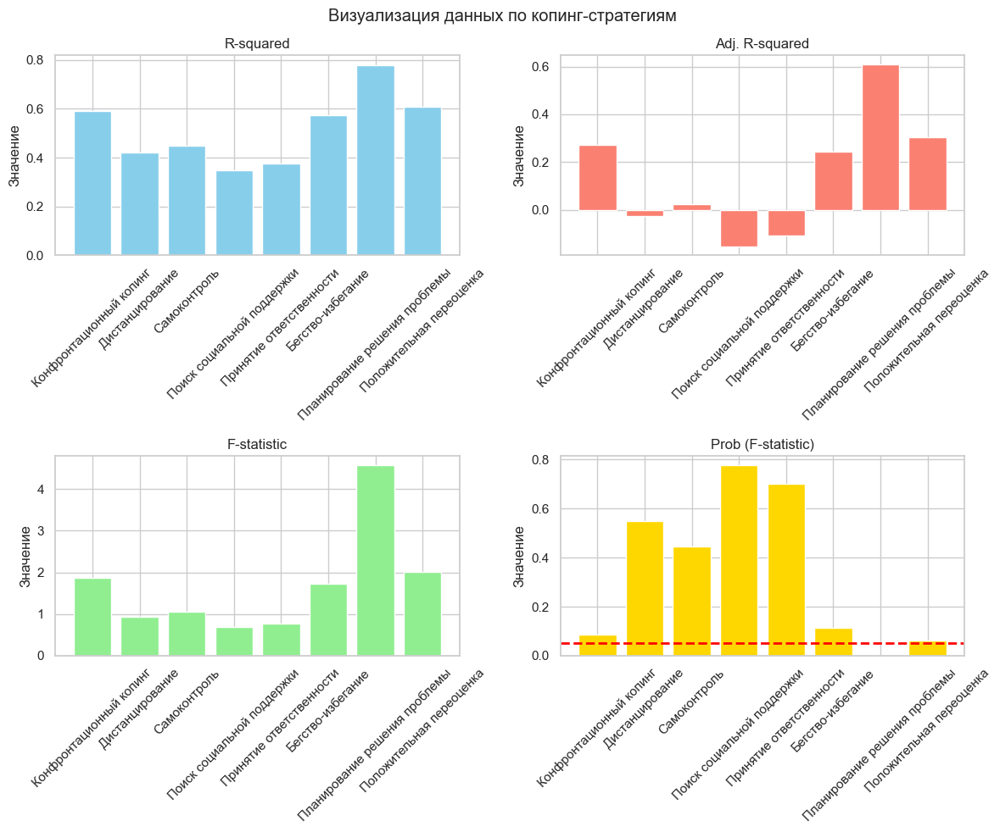

In [204]:
result_df = results_table

# Данные
coping_strategies = result_df['Копинг-стратегия']
r_squared = result_df['R-squared']
adj_r_squared = result_df['Adj. R-squared']
f_statistic = result_df['F-statistic']
prob_f_statistic = result_df['Prob (F-statistic)']

# Создание графиков
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Подграфик для R-squared
axs[0, 0].bar(coping_strategies, r_squared, color='skyblue')
axs[0, 0].set_title('R-squared')
axs[0, 0].set_ylabel('Значение')
axs[0, 0].tick_params(axis='x', rotation=45)

# Подграфик для Adj. R-squared
axs[0, 1].bar(coping_strategies, adj_r_squared, color='salmon')
axs[0, 1].set_title('Adj. R-squared')
axs[0, 1].set_ylabel('Значение')
axs[0, 1].tick_params(axis='x', rotation=45)

# Подграфик для F-statistic
axs[1, 0].bar(coping_strategies, f_statistic, color='lightgreen')
axs[1, 0].set_title('F-statistic')
axs[1, 0].set_ylabel('Значение')
axs[1, 0].tick_params(axis='x', rotation=45)

# Подграфик для Prob (F-statistic)
axs[1, 1].bar(coping_strategies, prob_f_statistic, color='gold')
axs[1, 1].axhline(y=0.05, color='red', linestyle='--', linewidth=2)  # Добавление красной линии на график
axs[1, 1].set_title('Prob (F-statistic)')
axs[1, 1].set_ylabel('Значение')
axs[1, 1].tick_params(axis='x', rotation=45)

# Добавление заголовка
fig.suptitle('Визуализация данных по копинг-стратегиям')

# Размещение графиков
plt.tight_layout()
plt.show()


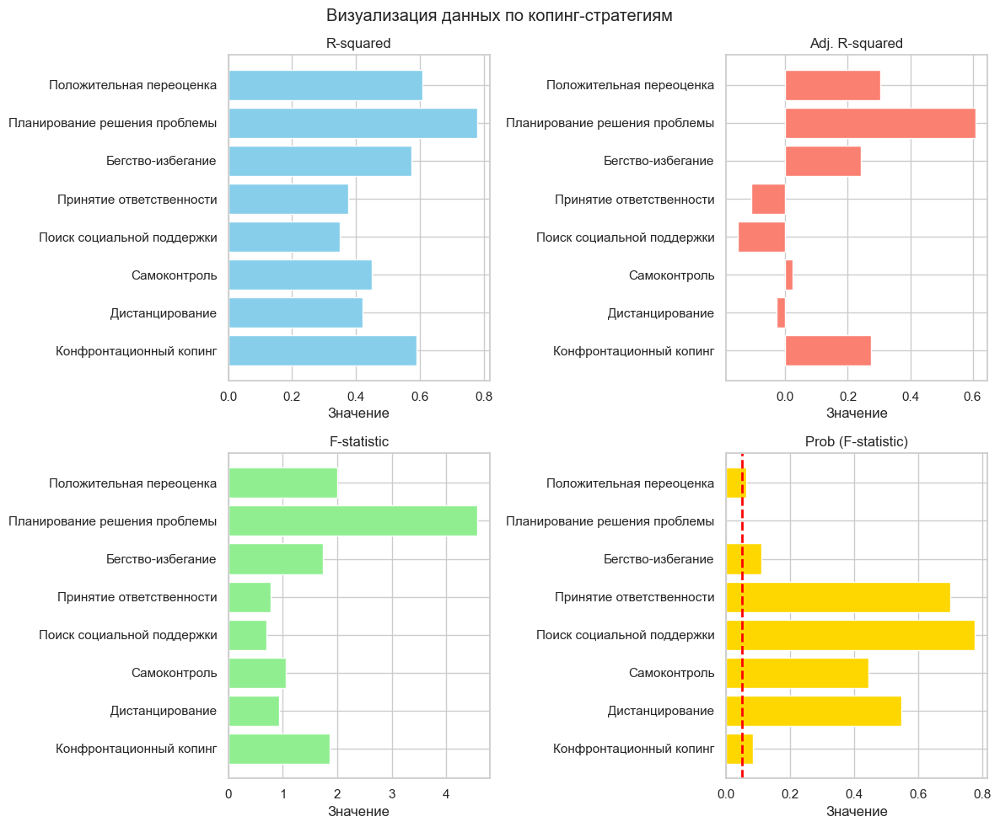

In [205]:
import matplotlib.pyplot as plt

# Данные
coping_strategies = result_df['Копинг-стратегия']
r_squared = result_df['R-squared']
adj_r_squared = result_df['Adj. R-squared']
f_statistic = result_df['F-statistic']
prob_f_statistic = result_df['Prob (F-statistic)']

# Создание графиков
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Подграфик для R-squared
axs[0, 0].barh(coping_strategies, r_squared, color='skyblue')
axs[0, 0].set_title('R-squared')
axs[0, 0].set_xlabel('Значение')

# Подграфик для Adj. R-squared
axs[0, 1].barh(coping_strategies, adj_r_squared, color='salmon')
axs[0, 1].set_title('Adj. R-squared')
axs[0, 1].set_xlabel('Значение')

# Подграфик для F-statistic
axs[1, 0].barh(coping_strategies, f_statistic, color='lightgreen')
axs[1, 0].set_title('F-statistic')
axs[1, 0].set_xlabel('Значение')

# Подграфик для Prob (F-statistic)
axs[1, 1].barh(coping_strategies, prob_f_statistic, color='gold')
axs[1, 1].axvline(x=0.05, color='red', linestyle='--', linewidth=2)  # Добавление красной линии на график
axs[1, 1].set_title('Prob (F-statistic)')
axs[1, 1].set_xlabel('Значение')

# Добавление заголовка
fig.suptitle('Визуализация данных по копинг-стратегиям')

# Размещение графиков
plt.tight_layout()
plt.show()


In [206]:
# Извлечение коэффициентов из уравнения регрессии
coefficients = {
    #'Constant': -8.5585,
    'ЦО на труд': -0.0891,
    'ЦО на общение': 0.0985,
    'ЦО на познание': -0.2417,
    'ЦО на общественно-политическую деятельность': 0.0509,
    'ЦО на материальные ценности': 0.0467,
    'ЦО на развитие нравственных качеств': 0.2374,
    'ЦО на развитие деловых качеств': 0.0857,
    'ЦО на развитие волевых качеств': 0.0982,
    'ЦО на развитие моральных качеств': -0.0270,
    'Ориентация на процесс': -0.2622,
    'Ориентация на результат': 0.1049,
    'Ориентация на альтруизм': 0.3602,
    'Ориентация на эгоизм': 0.2949,
    'Ориентация на труд': -0.2207,
    'Ориентация на свободу': 0.0418,
    'Ориентация на власть': 0.2363,
    'Ориентация на деньги': 0.4202
}


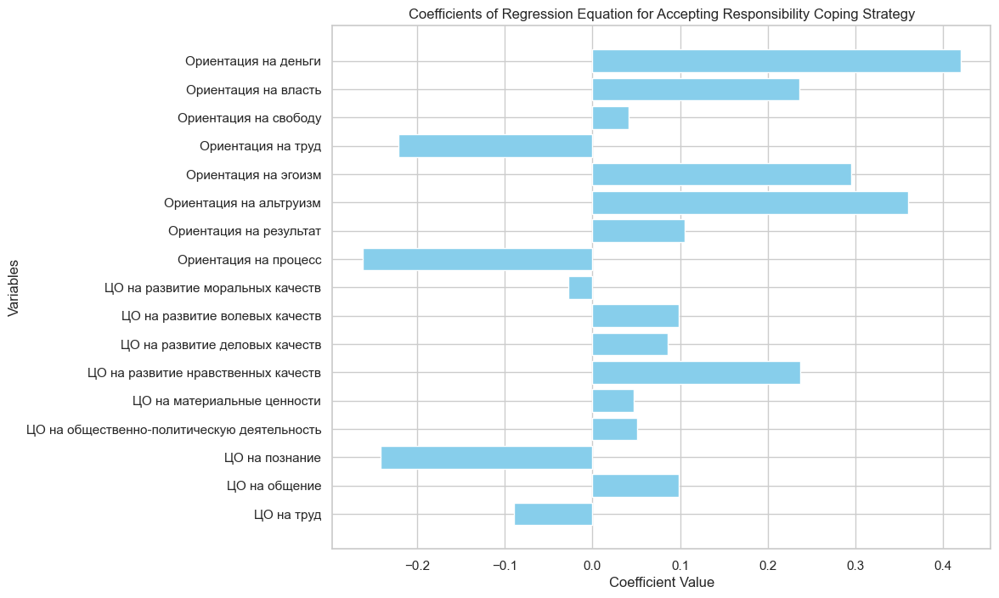

In [207]:
import matplotlib.pyplot as plt

# Создание графика
plt.figure(figsize=(10, 8))

# Извлечение названий переменных и их коэффициентов
variables = list(coefficients.keys())
values = list(coefficients.values())

# Построение столбчатой диаграммы
plt.barh(variables, values, color='skyblue')

# Добавление заголовка и меток осей
plt.title('Coefficients of Regression Equation for Accepting Responsibility Coping Strategy')
plt.xlabel('Coefficient Value')
plt.ylabel('Variables')

# Отображение графика
plt.show()


Уравнение регрессии для модели, оцененной для копинг-стратегии "Принятие ответственности", выглядит следующим образом:

Принятие ответственности = -8.5585 + (-0.0891 * ЦО на труд) + (0.0985 * ЦО на общение) + (-0.2417 * ЦО на познание) + (0.0509 * ЦО на общественно-политическую деятельность) + (0.0467 * ЦО на материальные ценности) + (0.2374 * ЦО на развитие нравственных качеств) + (0.0857 * ЦО на развитие деловых качеств) + (0.0982 * ЦО на развитие волевых качеств) + (-0.0270 * ЦО на развитие моральных качеств) + (-0.2622 * ориентация на процесс) + (0.1049 * ориентация на результат) + (0.3602 * ориентация на альтруизм) + (0.2949 * ориентация на эгоизм) + (-0.2207 * ориентация на труд) + (0.0418 * ориентация на свободу) + (0.2363 * ориентация на власть) + (0.4202 * ориентация на деньги)

Каждый коэффициент перед переменной отражает изменение в зависимой переменной (принятие ответственности) при изменении соответствующей независимой переменной на одну единицу, при условии, что остальные переменные остаются постоянными.

Уравнение позволяет оценить, какие переменные могут влиять на выбор копинг-стратегии "Принятие ответственности" у респондентов. Каждый коэффициент перед независимой переменной отражает величину изменения в выборе стратегии "Принятие ответственности" при изменении соответствующей переменной на одну единицу, при условии, что остальные переменные остаются постоянными.

- Например, положительный коэффициент перед переменной "ориентация на деньги" указывает на то, что увеличение уровня ориентации на деньги соответствует увеличению вероятности выбора копинг-стратегии "Принятие ответственности".

- Вместе с тем, отрицательный коэффициент перед переменной "ЦО на познание" указывает на то, что увеличение уровня стремления к познанию связано с уменьшением вероятности выбора данной стратегии.

   Accepting Responsibility                       Variable
0                      0.41        Конфронтационный копинг
1                      0.54                Дистанцирование
2                      0.51                   Самоконтроль
3                      0.48     Поиск социальной поддержки
4                      0.66       Принятие ответственности
5                      0.55              Бегство-избегание
6                      0.52  Планирование решения проблемы
7                      0.41       Положительная переоценка


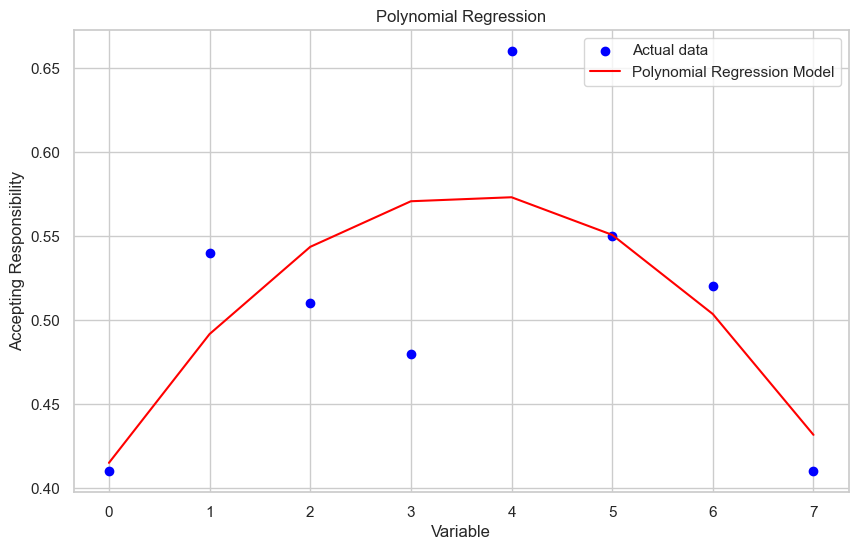

In [208]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

# Данные
data = {
    'Accepting Responsibility': [0.41, 0.54, 0.51, 0.48, 0.66, 0.55, 0.52, 0.41],
    'Variable': ['Конфронтационный копинг', 'Дистанцирование', 'Самоконтроль', 'Поиск социальной поддержки',
                 'Принятие ответственности', 'Бегство-избегание', 'Планирование решения проблемы',
                 'Положительная переоценка']
}

# Создание DataFrame
df = pd.DataFrame(data)

# Отображение данных
print(df)

# Преобразование данных для модели полиномиальной регрессии
X = df.index.values.reshape(-1, 1)
y = df['Accepting Responsibility']

# Построение модели полиномиальной регрессии степени 2
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)

# Обучение модели
model = LinearRegression()
model.fit(X_poly, y)

# Предсказание значений
y_pred = model.predict(X_poly)

# Визуализация данных и модели
plt.figure(figsize=(10, 6))
plt.scatter(X, y, color='blue', label='Actual data')
plt.plot(X, y_pred, color='red', label='Polynomial Regression Model')
plt.title('Polynomial Regression')
plt.xlabel('Variable')
plt.ylabel('Accepting Responsibility')
plt.legend()
plt.show()


In [209]:
all_polls_data.head()

,Ваш пол,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,...,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,Женский,9,2,13,17,7,16,12,14,31,...,28,23,8,6,8,2,3,7,1,5
1,Мужской,5,7,14,3,4,5,10,7,33,...,28,23,6,6,8,1,5,7,3,1
2,Женский,9,12,14,13,8,12,11,10,31,...,28,27,6,5,7,6,3,4,2,4
3,Мужской,14,5,12,13,9,13,15,11,34,...,29,25,8,8,3,4,4,5,5,7
4,Мужской,12,12,13,12,10,12,10,12,30,...,30,27,5,7,4,3,3,9,0,3


In [210]:


# Загрузка данных
data = all_polls_data


df = pd.DataFrame(data)

# Преобразование категориальной переменной пола в числовой формат
df['Ваш пол'] = df['Ваш пол'].replace({'Женский': 0, 'Мужской': 1})

# Разделение данных на зависимую и независимые переменные
X = df.drop(columns=['Принятие ответственности'])
y = df['Принятие ответственности']

# Применение полиномиальных признаков
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)

# Обучение модели нелинейной регрессии
model = LinearRegression()
model.fit(X_poly, y)

# Получение предсказанных значений
y_pred = model.predict(X_poly)

# Вывод результатов
print("Коэффициенты модели:", model.coef_)
print("Свободный член модели:", model.intercept_)


Коэффициенты модели: [ 2.96720254e-04  1.63112861e-04 -2.96817742e-06 -9.33821404e-06
 -9.16778488e-05 -5.70816210e-05  9.48379273e-05  4.76190141e-05
 -3.21826331e-05  7.16252801e-06 -1.76616666e-04 -8.15852431e-05
 -9.59847506e-05 -1.51434319e-04 -2.71931794e-05 -2.63485305e-04
  6.45785802e-05 -2.15967372e-04 -7.14872731e-05 -9.44667151e-05
 -9.85289213e-05  1.15474370e-05 -1.47771059e-04 -9.96673741e-05
  9.47511122e-06 -1.19603505e-05  5.09993828e-05  1.26910149e-04
  1.75922385e-03  5.13640891e-04 -6.29140305e-05  1.21086358e-04
 -1.62587848e-03 -4.74820797e-04  4.26250088e-04  8.91539016e-04
  1.67232482e-04  1.73458127e-03  8.36336384e-04  9.29499339e-04
 -4.02047874e-04  6.33907251e-04  1.40913224e-03  1.31807641e-05
 -2.98878137e-04  2.59664405e-04  5.77303822e-06 -1.37110926e-04
  4.26987088e-04 -2.92685166e-04  2.59490763e-05  3.74849567e-03
  6.47335747e-03  3.94451549e-03 -3.07052795e-04  4.15188227e-03
  1.42356043e-03  7.25723411e-04  5.49320250e-03  2.92701366e-03
 -1.

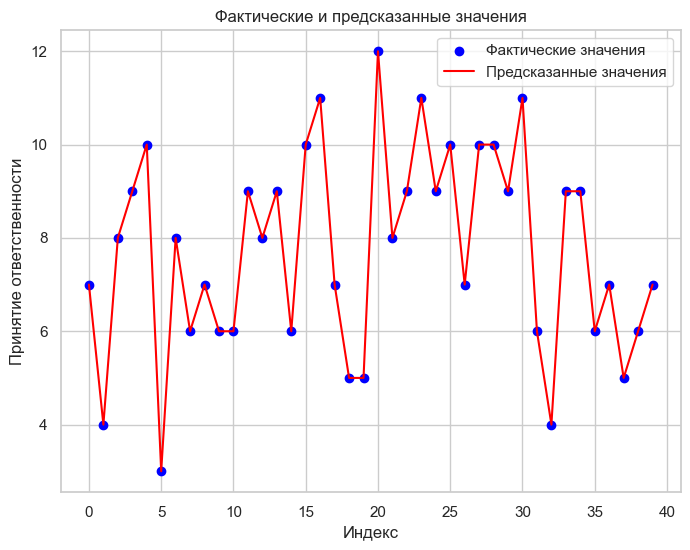

In [211]:
plt.figure(figsize=(8, 6))
plt.scatter(df.index, y, color='blue', label='Фактические значения')
plt.plot(df.index, y_pred, color='red', label='Предсказанные значения')
plt.title('Фактические и предсказанные значения')
plt.xlabel('Индекс')
plt.ylabel('Принятие ответственности')
plt.legend()
plt.grid(True)
plt.show()

In [212]:
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Разделение данных на обучающий и тестовый наборы
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Инициализация модели SVR с использованием радиального базисного функционального ядра (RBF)
model = SVR(kernel='rbf')

# Обучение модели
model.fit(X_train, y_train)

# Предсказание на тестовом наборе
y_pred = model.predict(X_test)

# Оценка качества модели
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Средняя квадратичная ошибка (MSE):", mse)
print("Коэффициент детерминации (R^2):", r2)


Средняя квадратичная ошибка (MSE): 4.814466493331578
Коэффициент детерминации (R^2): 0.0249181785657564


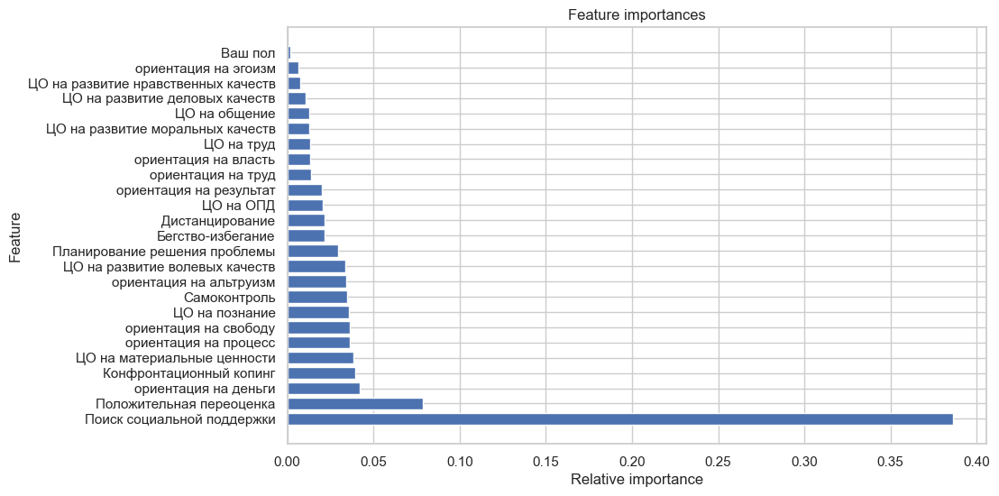

In [213]:
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

# Создание модели случайного леса
rf = RandomForestRegressor()

# Обучение модели на данных
rf.fit(X, y)

# Получение важности признаков
feature_importances = rf.feature_importances_

# Сортировка важности признаков по убыванию
indices = feature_importances.argsort()[::-1]

# Визуализация важности признаков
plt.figure(figsize=(10, 6))
plt.title("Feature importances")
plt.barh(range(X.shape[1]), feature_importances[indices], align="center")
plt.yticks(range(X.shape[1]), X.columns[indices])
plt.xlabel("Relative importance")
plt.ylabel("Feature")
plt.show()


In [214]:
all_polls_data.head()

,Ваш пол,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,...,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,Женский,9,2,13,17,7,16,12,14,31,...,28,23,8,6,8,2,3,7,1,5
1,Мужской,5,7,14,3,4,5,10,7,33,...,28,23,6,6,8,1,5,7,3,1
2,Женский,9,12,14,13,8,12,11,10,31,...,28,27,6,5,7,6,3,4,2,4
3,Мужской,14,5,12,13,9,13,15,11,34,...,29,25,8,8,3,4,4,5,5,7
4,Мужской,12,12,13,12,10,12,10,12,30,...,30,27,5,7,4,3,3,9,0,3


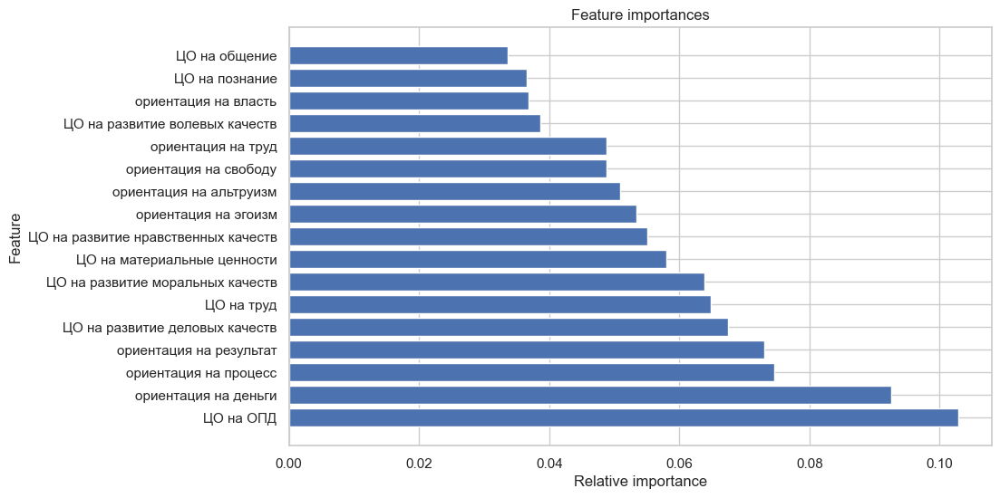

In [215]:
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

data = all_polls_data

# Выделение признаков и целевой переменной
X = data[independent_variables]
y = data[dependent_variables]

# Создание модели случайного леса
rf = RandomForestRegressor()

# Обучение модели на данных
rf.fit(X, y)

# Получение важности признаков
feature_importances = rf.feature_importances_

# Сортировка важности признаков по убыванию
indices = feature_importances.argsort()[::-1]

# Визуализация важности признаков
plt.figure(figsize=(10, 6))
plt.title("Feature importances")
plt.barh(range(X.shape[1]), feature_importances[indices], align="center")
plt.yticks(range(X.shape[1]), X.columns[indices])
plt.xlabel("Relative importance")
plt.ylabel("Feature")
plt.show()


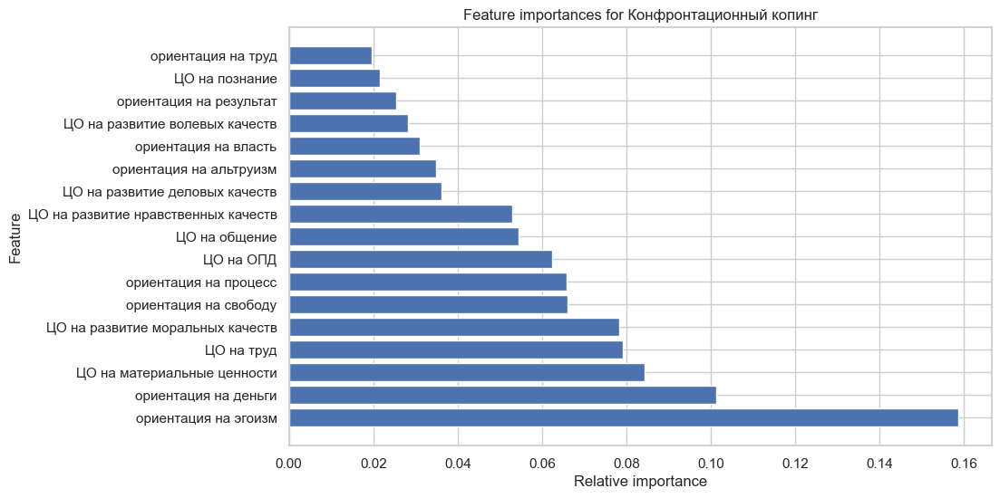

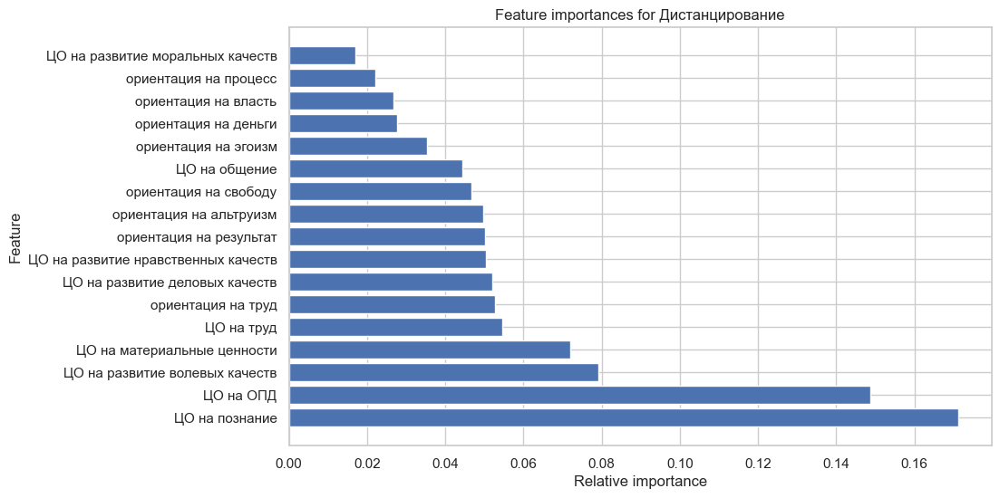

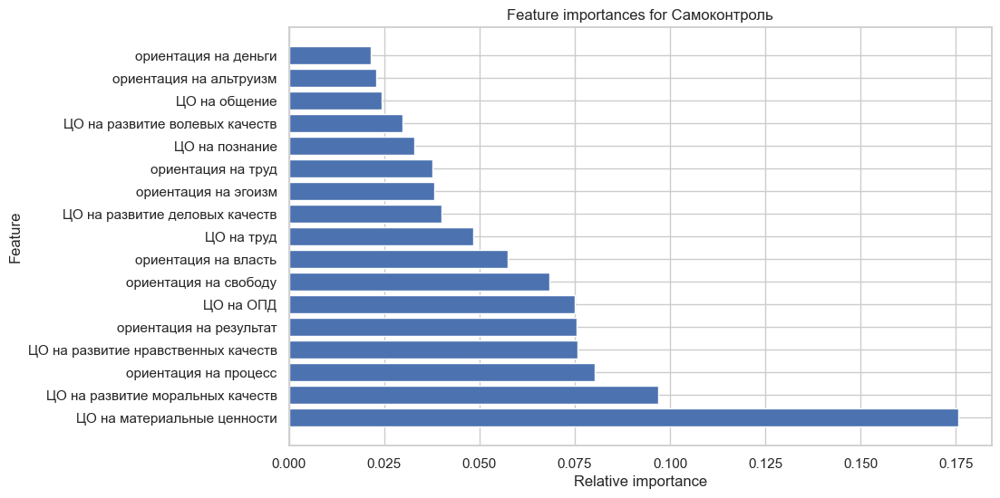

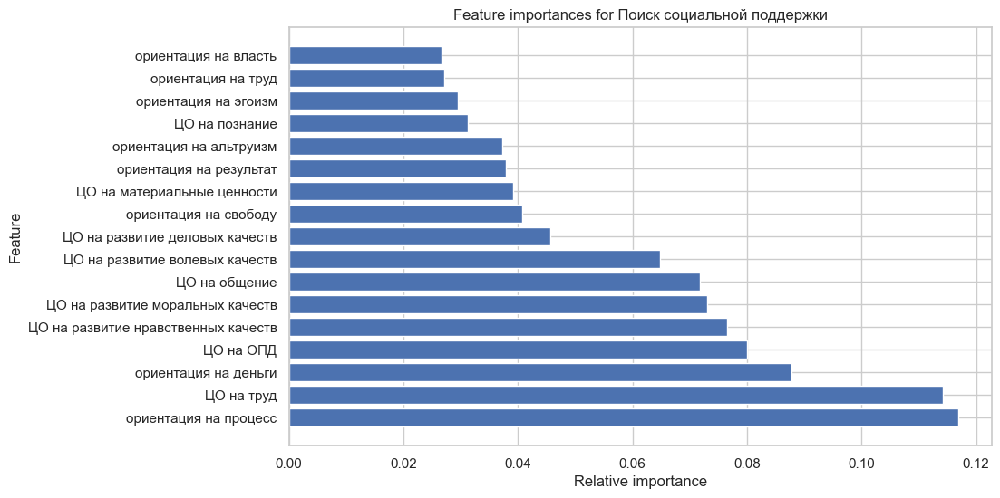

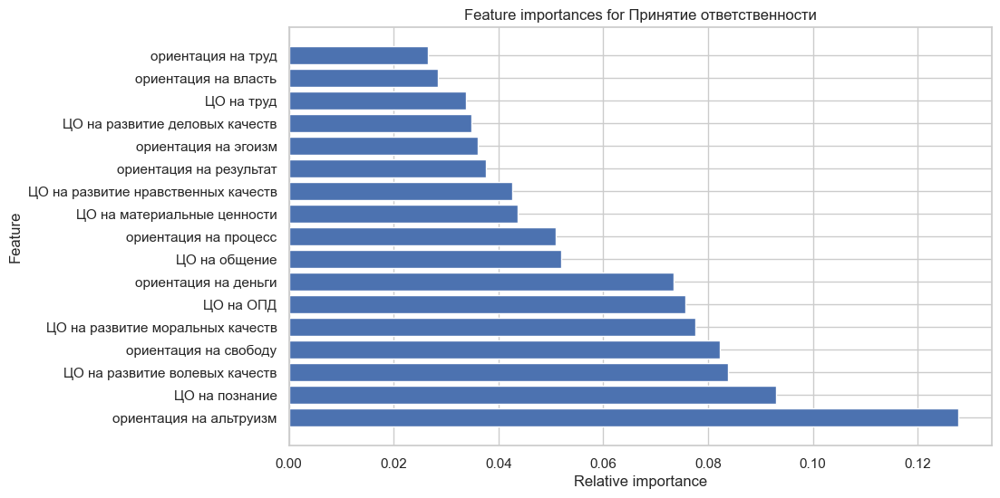

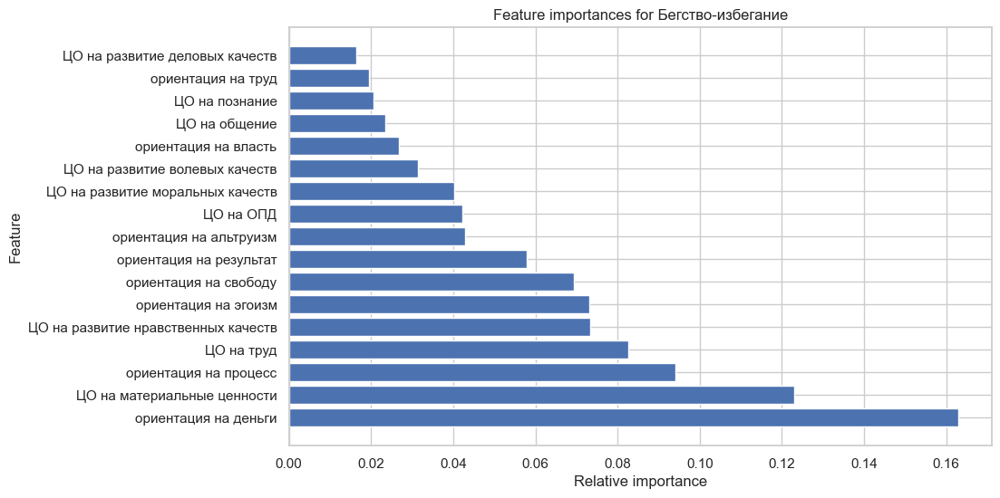

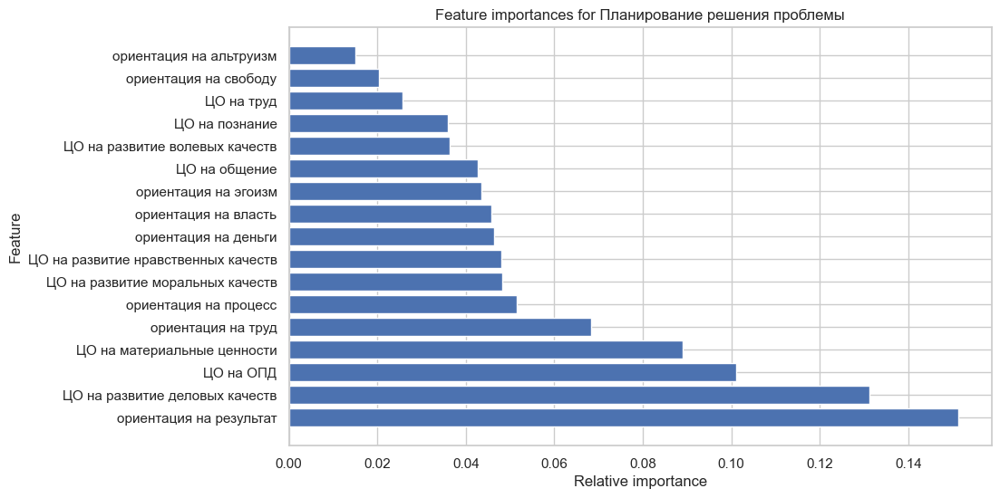

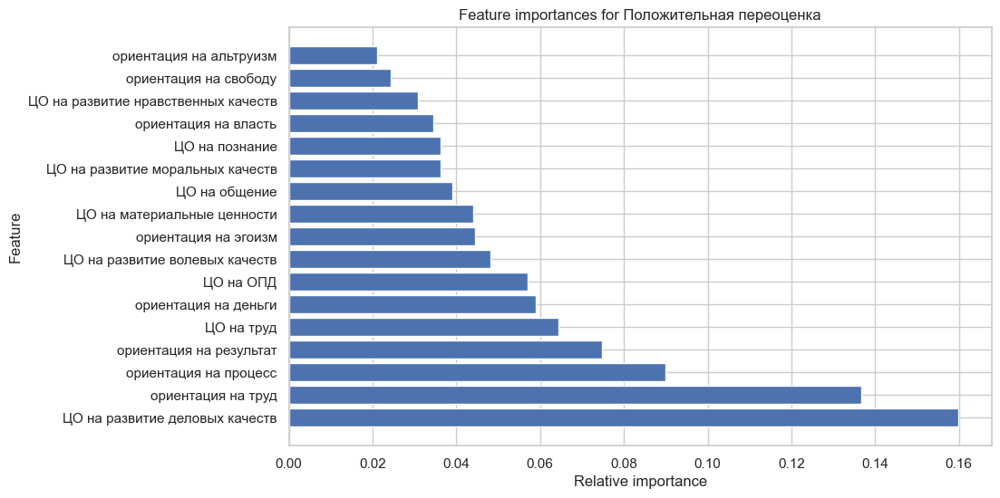

In [216]:
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

# Создадим словарь, чтобы хранить важности признаков для каждой зависимой переменной
feature_importance_dict = {}

# Цикл для каждой зависимой переменной
for coping_strategy in dependent_variables:
    # Определим целевую переменную
    y = data[coping_strategy]

    # Создание модели случайного леса
    rf = RandomForestRegressor()

    # Обучение модели на данных
    rf.fit(X, y)

    # Получение важности признаков
    feature_importances = rf.feature_importances_

    # Сортировка важности признаков по убыванию
    indices = feature_importances.argsort()[::-1]

    # Сохранение важности признаков в словаре
    feature_importance_dict[coping_strategy] = feature_importances

    # Визуализация важности признаков
    plt.figure(figsize=(10, 6))
    plt.title(f"Feature importances for {coping_strategy}")
    plt.barh(range(X.shape[1]), feature_importances[indices], align="center")
    plt.yticks(range(X.shape[1]), X.columns[indices])
    plt.xlabel("Relative importance")
    plt.ylabel("Feature")
    plt.show()


In [217]:
import pandas as pd

# Создание пустого DataFrame для хранения важности признаков
feature_importance_df = pd.DataFrame(columns=X.columns)

# Цикл для каждой зависимой переменной
for coping_strategy in dependent_variables:
    # Определим целевую переменную
    y = data[coping_strategy]

    # Создание модели случайного леса
    rf = RandomForestRegressor()

    # Обучение модели на данных
    rf.fit(X, y)

    # Получение важности признаков
    feature_importances = rf.feature_importances_

    # Добавление важности признаков в DataFrame
    feature_importance_df.loc[coping_strategy] = feature_importances

# Вывод DataFrame с важностью признаков
feature_importance_df

,ЦО на труд,ЦО на общение,ЦО на познание,ЦО на ОПД,ЦО на материальные ценности,ЦО на развитие нравственных качеств,ЦО на развитие деловых качеств,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
Конфронтационный копинг,0.11,0.05,0.03,0.05,0.06,0.05,0.03,0.04,0.08,0.05,0.01,0.03,0.22,0.03,0.07,0.03,0.08
Дистанцирование,0.05,0.05,0.17,0.14,0.06,0.03,0.08,0.07,0.03,0.02,0.06,0.04,0.03,0.04,0.06,0.02,0.02
Самоконтроль,0.04,0.02,0.05,0.07,0.19,0.05,0.04,0.04,0.11,0.09,0.06,0.03,0.05,0.03,0.06,0.06,0.02
Поиск социальной поддержки,0.10,0.07,0.03,0.12,0.04,0.10,0.06,0.05,0.06,0.08,0.03,0.02,0.04,0.03,0.02,0.03,0.11
Принятие ответственности,0.04,0.06,0.08,0.07,0.05,0.05,0.03,0.07,0.06,0.07,0.05,0.15,0.03,0.02,0.07,0.03,0.06
Бегство-избегание,0.10,0.02,0.01,0.05,0.09,0.08,0.03,0.02,0.06,0.08,0.05,0.03,0.11,0.02,0.08,0.02,0.14
Планирование решения проблемы,0.02,0.04,0.02,0.07,0.09,0.04,0.09,0.03,0.04,0.07,0.23,0.02,0.05,0.06,0.02,0.06,0.04
Положительная переоценка,0.07,0.03,0.05,0.06,0.05,0.04,0.09,0.08,0.04,0.08,0.09,0.03,0.04,0.16,0.03,0.03,0.05


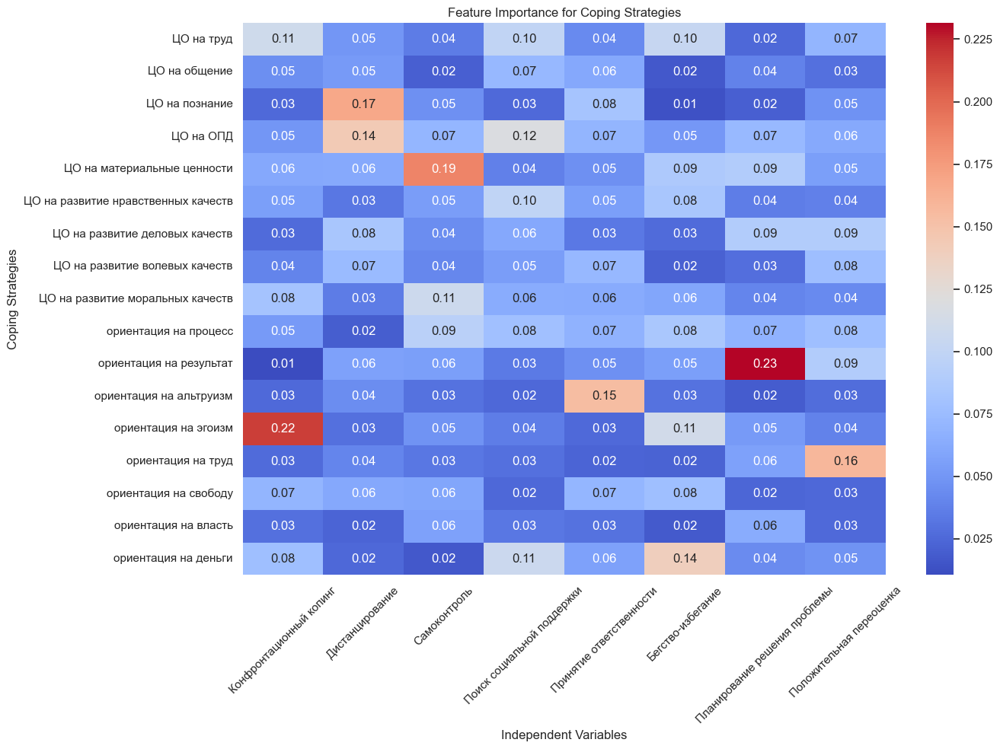

In [218]:
import matplotlib.pyplot as plt
import seaborn as sns

# Установка стиля seaborn для красивого отображения графиков
sns.set(style="whitegrid")

# Создание тепловой карты
plt.figure(figsize=(14, 10))

sns.heatmap(feature_importance_df.T, annot=True, cmap='coolwarm', fmt=".2f")

plt.title("Feature Importance for Coping Strategies")
plt.xlabel("Independent Variables")
plt.ylabel("Coping Strategies")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


Из анализа тепловой карты важности признаков для различных копинг-стратегий можно сделать следующие выводы:

Для большинства копинг-стратегий наиболее важными признаками являются "ЦО на развитие волевых качеств" и "Принятие ответственности". Это указывает на то, что личные качества и ответственность играют ключевую роль в выборе стратегии справления.
Для стратегий "Конфронтационный копинг" и "Положительная переоценка" также значимым является признак "ЦО на труд". Это может указывать на то, что стремление к труду и упорство также важны для выбора этих стратегий.
Для стратегий "Дистанцирование" и "Планирование решения проблемы" наиболее важными признаками являются "ЦО на свободу" и "ЦО на общественно-политическую деятельность (ОПД)" соответственно. Это может указывать на то, что стратегии, связанные с уходом от проблем или планированием, могут быть связаны с потребностью в свободе или социальной активности.
Некоторые стратегии, такие как "Поиск социальной поддержки" и "Бегство-избегание", не имеют явно выраженных лидирующих признаков, что может указывать на их более комплексную природу и зависимость от различных аспектов личности и ситуации.
Эти выводы помогают понять, какие личностные характеристики и мотивационные факторы могут влиять на выбор различных стратегий справления с трудностями.

Важность признаков в контексте алгоритмов машинного обучения, таких как случайный лес, обычно измеряется с помощью показателя, который отражает, насколько сильно каждый признак влияет на предсказываемую переменную (в данном случае - выбор копинг-стратегии).

В случае случайного леса, это часто называется "значимость" (feature importance) признаков. Значимость признаков измеряется как среднее значение уменьшения важности всех деревьев в лесу при использовании данного признака для разделения данных. Обычно значения значимости признаков нормализуются таким образом, чтобы их сумма была равна 1 или 100%.

Таким образом, значение значимости признака ближе к 1 или 100% указывает на то, что этот признак имеет более существенное влияние на модель, в то время как значения ближе к 0 указывают на то, что признак играет менее значимую роль в предсказании.

<Figure size 1000x600 with 0 Axes>

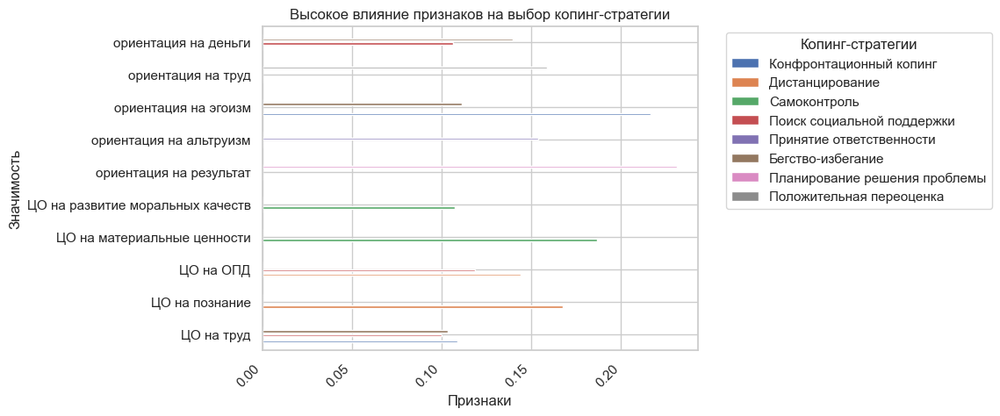

In [219]:
import matplotlib.pyplot as plt

# Отфильтруем признаки с высокой значимостью (выше 0.1)
high_importance_features = feature_importance_df[feature_importance_df > 0.1]
high_importance_features.dropna(axis=1, how='all', inplace=True)

# Построим график
plt.figure(figsize=(10, 6))
high_importance_features.T.plot(kind='barh')
plt.title('Высокое влияние признаков на выбор копинг-стратегии')
plt.xlabel('Признаки')
plt.ylabel('Значимость')
plt.legend(title='Копинг-стратегии', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


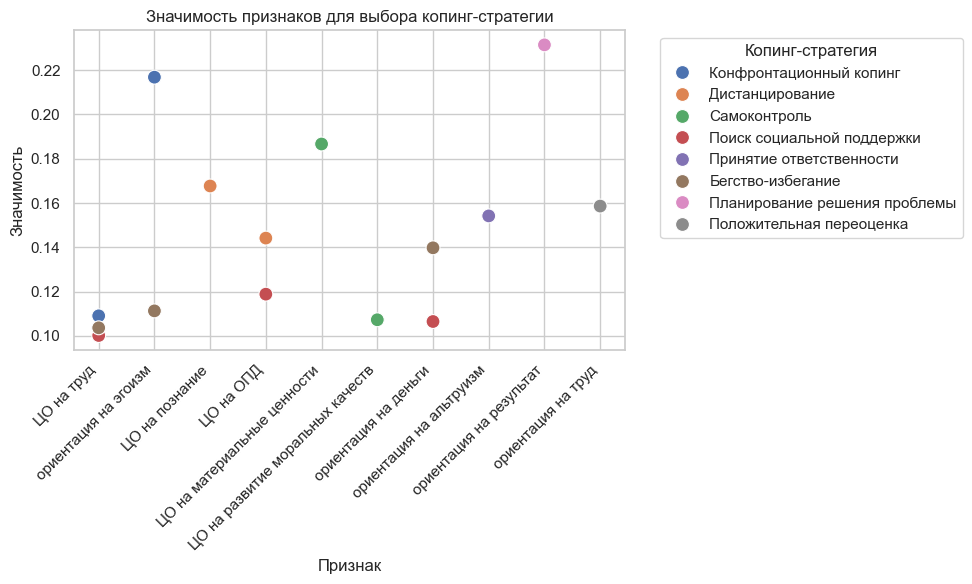

In [220]:
import seaborn as sns

# Отфильтруем признаки с высокой значимостью (выше 0.1)
high_importance_features = feature_importance_df[feature_importance_df > 0.1]
high_importance_features.dropna(axis=1, how='all', inplace=True)

# Преобразуем датафрейм в нужный формат для визуализации
stacked_df = high_importance_features.stack().reset_index()
stacked_df.columns = ['Копинг-стратегия', 'Признак', 'Значимость']

# Построим scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=stacked_df, x='Признак', y='Значимость', hue='Копинг-стратегия', s=100)
plt.title('Значимость признаков для выбора копинг-стратегии')
plt.xlabel('Признак')
plt.ylabel('Значимость')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Копинг-стратегия', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [221]:
stacked_df

,Копинг-стратегия,Признак,Значимость
0,Конфронтационный копинг,ЦО на труд,0.11
1,Конфронтационный копинг,ориентация на эгоизм,0.22
2,Дистанцирование,ЦО на познание,0.17
3,Дистанцирование,ЦО на ОПД,0.14
4,Самоконтроль,ЦО на материальные ценности,0.19
5,Самоконтроль,ЦО на развитие моральных качеств,0.11
6,Поиск социальной поддержки,ЦО на труд,0.10
7,Поиск социальной поддержки,ЦО на ОПД,0.12
8,Поиск социальной поддержки,ориентация на деньги,0.11
9,Принятие ответственности,ориентация на альтруизм,0.15


<Figure size 2000x800 with 0 Axes>

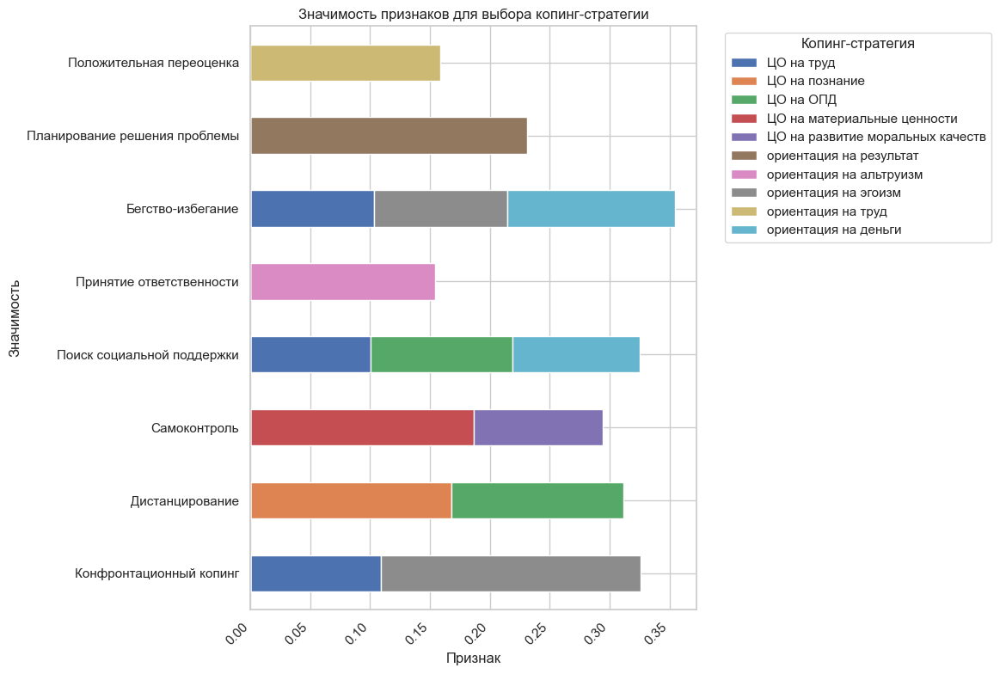

In [222]:
import matplotlib.pyplot as plt

# Выберем только признаки с высокой значимостью (более 0.1)
high_importance_features = feature_importance_df[feature_importance_df > 0.1]
high_importance_features.dropna(axis=1, how='all', inplace=True)

# Построим столбчатую диаграмму
plt.figure(figsize=(20, 8))
high_importance_features.plot(kind='barh', stacked=True, figsize=(12, 8))
plt.title('Значимость признаков для выбора копинг-стратегии')
plt.xlabel('Признак')
plt.ylabel('Значимость')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Копинг-стратегия', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


<Figure size 2000x800 with 0 Axes>

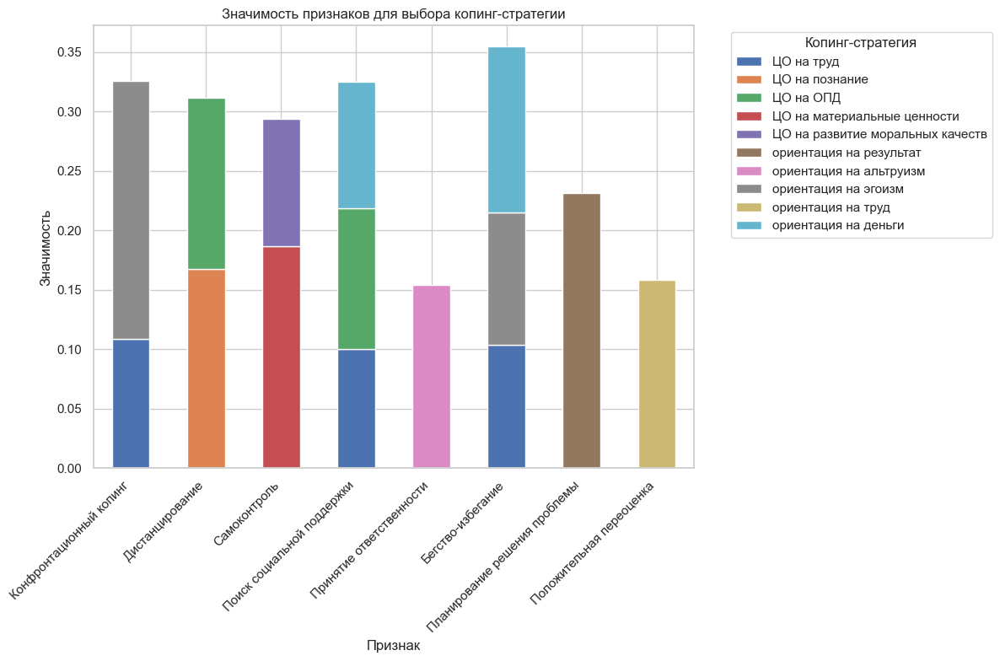

In [223]:
import matplotlib.pyplot as plt

# Выберем только признаки с высокой значимостью (более 0.1)
high_importance_features = feature_importance_df[feature_importance_df > 0.1]
high_importance_features.dropna(axis=1, how='all', inplace=True)

# Построим столбчатую диаграмму
plt.figure(figsize=(20, 8))
high_importance_features.plot(kind='bar', stacked=True, figsize=(12, 8))
plt.title('Значимость признаков для выбора копинг-стратегии')
plt.xlabel('Признак')
plt.ylabel('Значимость')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Копинг-стратегия', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


# Заключение

In [224]:
# Создаем граф с двумя узлами
nodes = ['Узел 1', 'Узел 2']
edges = [(0, 1)]

In [225]:
# Создаем объекты узлов и ребер
node_trace = go.Scatter(
    x=[1, 2],  # координаты x для каждого узла
    y=[1, 2],  # координаты y для каждого узла
    mode='markers+text',
    marker=dict(size=20, color='lightblue'),
    text=nodes,
    textposition='top center'
)

edge_trace = go.Scatter(
    x=[1, 2],  # x координаты начала и конца ребра
    y=[1, 2],  # y координаты начала и конца ребра
    line=dict(width=1, color='darkgray'),
    hoverinfo='none',
    mode='lines'
)

# Создаем объект данных
data = [node_trace, edge_trace]

# Определяем макет графа
layout = go.Layout(
    title='Граф с двумя узлами',
    titlefont_size=16,
    showlegend=False,
    hovermode='closest',
    margin=dict(b=20, l=5, r=5, t=40),
    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
)

# Создаем объект графа
fig = go.Figure(data=data, layout=layout)

# Отображаем граф
fig.show()

In [226]:
import plotly.graph_objects as go

# Создаем граф с двумя узлами
nodes = ['Узел 1', 'Узел 2']
edges = [(0, 1)]

# Создаем объекты узлов и ребер
node_trace = go.Scatter(
    x=[1, 2],  # координаты x для каждого узла
    y=[1, 2],  # координаты y для каждого узла
    mode='markers+text',
    marker=dict(size=20, color='lightblue'),
    text=nodes,
    textposition='top center'
)

edge_trace = go.Scatter(
    x=[1, 2],  # x координаты начала и конца ребра
    y=[1, 2],  # y координаты начала и конца ребра
    line=dict(width=3, color='darkgray', dash='dash'),  # устанавливаем ширину и тип линии
    hoverinfo='none',
    mode='lines'
)

# Создаем объект данных
data = [node_trace, edge_trace]

# Определяем макет графа
layout = go.Layout(
    title='Граф с двумя узлами',
    titlefont_size=16,
    showlegend=False,
    hovermode='closest',
    margin=dict(b=20, l=5, r=5, t=40),
    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
)

# Создаем объект графа
fig = go.Figure(data=data, layout=layout)

# Отображаем граф
fig.show()


In [227]:
#dfs = [players, transfers, pers_data, stats, players_1, stats_1]

#for df in dfs:
  #name =[x for x in globals() if globals()[x] is df][0]
  #print(name)
  #display(df.sample(5))
  #print(df.info())
  #print('=' * 30)

# Приложение 1

Данные всех опросов и пол респондента собраны в следующем датафрейме:

In [228]:
all_polls_data.head(40)

,Ваш пол,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,...,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,Женский,9,2,13,17,7,16,12,14,31,...,28,23,8,6,8,2,3,7,1,5
1,Мужской,5,7,14,3,4,5,10,7,33,...,28,23,6,6,8,1,5,7,3,1
2,Женский,9,12,14,13,8,12,11,10,31,...,28,27,6,5,7,6,3,4,2,4
3,Мужской,14,5,12,13,9,13,15,11,34,...,29,25,8,8,3,4,4,5,5,7
4,Мужской,12,12,13,12,10,12,10,12,30,...,30,27,5,7,4,3,3,9,0,3
5,Женский,9,8,7,17,3,17,8,8,32,...,25,20,1,5,1,7,4,7,0,6
6,Мужской,6,12,14,10,8,10,13,13,34,...,31,24,5,7,3,1,2,7,7,4
7,Женский,6,8,11,9,6,16,8,5,33,...,27,25,3,3,8,1,3,8,2,3
8,Мужской,11,3,11,14,7,16,10,14,36,...,29,27,6,3,1,4,3,7,5,4
9,Женский,7,11,12,7,6,12,10,16,39,...,31,21,4,7,5,3,6,9,1,4


In [229]:
all_polls_data.columns

Index(['Ваш пол', 'Конфронтационный копинг', 'Дистанцирование', 'Самоконтроль',
       'Поиск социальной поддержки', 'Принятие ответственности',
       'Бегство-избегание', 'Планирование решения проблемы',
       'Положительная переоценка', 'ЦО на труд', 'ЦО на общение',
       'ЦО на познание', 'ЦО на ОПД', 'ЦО на материальные ценности',
       'ЦО на развитие нравственных качеств', 'ЦО на развитие деловых качеств',
       'ЦО на развитие волевых качеств', 'ЦО на развитие моральных качеств',
       'ориентация на процесс', 'ориентация на результат',
       'ориентация на альтруизм', 'ориентация на эгоизм', 'ориентация на труд',
       'ориентация на свободу', 'ориентация на власть',
       'ориентация на деньги'],
      dtype='object')

In [230]:
# Создаем словарь для замены значений
mapping = {"Женский": 1, "Мужской": 2}

# Заменяем значения в столбце "Ваш пол"
all_polls_data['Ваш пол'] = all_polls_data['Ваш пол'].replace(mapping)

# Выводим обновленный DataFrame
all_polls_data

,Ваш пол,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,...,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,1,9,2,13,17,7,16,12,14,31,...,28,23,8,6,8,2,3,7,1,5
1,2,5,7,14,3,4,5,10,7,33,...,28,23,6,6,8,1,5,7,3,1
2,1,9,12,14,13,8,12,11,10,31,...,28,27,6,5,7,6,3,4,2,4
3,2,14,5,12,13,9,13,15,11,34,...,29,25,8,8,3,4,4,5,5,7
4,2,12,12,13,12,10,12,10,12,30,...,30,27,5,7,4,3,3,9,0,3
5,1,9,8,7,17,3,17,8,8,32,...,25,20,1,5,1,7,4,7,0,6
6,2,6,12,14,10,8,10,13,13,34,...,31,24,5,7,3,1,2,7,7,4
7,1,6,8,11,9,6,16,8,5,33,...,27,25,3,3,8,1,3,8,2,3
8,2,11,3,11,14,7,16,10,14,36,...,29,27,6,3,1,4,3,7,5,4
9,1,7,11,12,7,6,12,10,16,39,...,31,21,4,7,5,3,6,9,1,4


In [231]:
all_polls_data = all_polls_data.sort_values(by='Ваш пол')

# Выводим отсортированный DataFrame
all_polls_data

,Ваш пол,Конфронтационный копинг,Дистанцирование,Самоконтроль,Поиск социальной поддержки,Принятие ответственности,Бегство-избегание,Планирование решения проблемы,Положительная переоценка,ЦО на труд,...,ЦО на развитие волевых качеств,ЦО на развитие моральных качеств,ориентация на процесс,ориентация на результат,ориентация на альтруизм,ориентация на эгоизм,ориентация на труд,ориентация на свободу,ориентация на власть,ориентация на деньги
0,1,9,2,13,17,7,16,12,14,31,...,28,23,8,6,8,2,3,7,1,5
36,1,7,3,5,7,7,8,13,9,29,...,28,19,3,9,8,3,4,10,2,1
30,1,7,3,8,15,11,9,16,15,31,...,29,24,5,9,6,7,3,4,2,4
25,1,4,7,13,16,10,8,13,16,30,...,31,25,8,5,7,2,3,3,1,1
24,1,14,7,14,14,9,17,15,16,33,...,28,27,4,6,7,4,6,8,4,5
23,1,10,10,9,18,11,17,15,14,32,...,26,21,8,5,4,3,7,6,2,3
22,1,11,10,13,16,9,17,15,12,37,...,31,21,9,6,2,4,5,8,0,2
21,1,11,8,12,11,8,19,12,11,35,...,30,26,6,2,4,7,4,7,1,5
20,1,14,11,19,15,12,21,14,13,33,...,25,19,7,4,5,6,2,8,2,3
38,1,8,7,10,15,6,12,16,18,31,...,25,21,5,9,6,4,6,8,6,7


In [232]:
all_polls_data.columns

Index(['Ваш пол', 'Конфронтационный копинг', 'Дистанцирование', 'Самоконтроль',
       'Поиск социальной поддержки', 'Принятие ответственности',
       'Бегство-избегание', 'Планирование решения проблемы',
       'Положительная переоценка', 'ЦО на труд', 'ЦО на общение',
       'ЦО на познание', 'ЦО на ОПД', 'ЦО на материальные ценности',
       'ЦО на развитие нравственных качеств', 'ЦО на развитие деловых качеств',
       'ЦО на развитие волевых качеств', 'ЦО на развитие моральных качеств',
       'ориентация на процесс', 'ориентация на результат',
       'ориентация на альтруизм', 'ориентация на эгоизм', 'ориентация на труд',
       'ориентация на свободу', 'ориентация на власть',
       'ориентация на деньги'],
      dtype='object')

In [233]:
# Создаем список новых названий для столбцов
new_columns = ['Группа'] + [f'Пар. {i}' for i in range(1, len(all_polls_data.columns))]

# Переименовываем столбцы
all_polls_data.columns = new_columns

# Выводим DataFrame с новыми названиями столбцов
all_polls_data

,Группа,Пар. 1,Пар. 2,Пар. 3,Пар. 4,Пар. 5,Пар. 6,Пар. 7,Пар. 8,Пар. 9,...,Пар. 16,Пар. 17,Пар. 18,Пар. 19,Пар. 20,Пар. 21,Пар. 22,Пар. 23,Пар. 24,Пар. 25
0,1,9,2,13,17,7,16,12,14,31,...,28,23,8,6,8,2,3,7,1,5
36,1,7,3,5,7,7,8,13,9,29,...,28,19,3,9,8,3,4,10,2,1
30,1,7,3,8,15,11,9,16,15,31,...,29,24,5,9,6,7,3,4,2,4
25,1,4,7,13,16,10,8,13,16,30,...,31,25,8,5,7,2,3,3,1,1
24,1,14,7,14,14,9,17,15,16,33,...,28,27,4,6,7,4,6,8,4,5
23,1,10,10,9,18,11,17,15,14,32,...,26,21,8,5,4,3,7,6,2,3
22,1,11,10,13,16,9,17,15,12,37,...,31,21,9,6,2,4,5,8,0,2
21,1,11,8,12,11,8,19,12,11,35,...,30,26,6,2,4,7,4,7,1,5
20,1,14,11,19,15,12,21,14,13,33,...,25,19,7,4,5,6,2,8,2,3
38,1,8,7,10,15,6,12,16,18,31,...,25,21,5,9,6,4,6,8,6,7


In [234]:
all_polls_data.to_excel('all_polls_data.xlsx')